### BADASS Analysis: fatty acids

Can we distinguish five different classes of fatty acids from each another? And can we reduce the number of peptides we include in the array without negatively affecting model performance?

#### Analytes

Fatty acids:
- Butanoic acid (B)
- Dodecanoic acid (D)
- Nervonic acid (N)
- Oleic acid (O)
- Palmitic acid (P)

In [1]:
# Import from array_sensing package
from subroutines.parse_array_data import ParseArrayData
from subroutines.train import RunML, draw_conf_matrices

In [2]:
import copy
import math
import os
import pickle
import random
import shutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from collections import OrderedDict
from IPython.display import display
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import (
    accuracy_score, recall_score, precision_score, f1_score, cohen_kappa_score, make_scorer
)
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC, SVC

%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 10)  # Sets default figure size

#### Parse in input data

Large array fatty acid data

In [3]:
fa_fluor_data = ParseArrayData(
    data_dirs_dict={'DPH': '/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/'
                           'FAs/Reformatted_FA_csvs/'},
    results_dir='/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_analysis_large_array/'
                'FAs/FA_plate_parsing_plots/',
    repeat_labels_list=['repeat_1', 'repeat_2', 'repeat_3', 'repeat_4', 'repeat_5', 'repeat_6', 'repeat_7',
                        'repeat_8', 'repeat_9', 'repeat_10'],
    peptide_dict = {'DPH': ['No Pep', 'CCPent', 'QLKEIA', 'CCHex2-I24K', 'CCHept-I24N', 'CCHept-L28W',
                            'GRP22', 'CCHex', 'NLKEIA', 'CCHept-L28K', 'CCHept-I24T', 'CCHept-L7Y',
                            'GRP35', 'CCHex2', 'CCHept-I17G-L21G', 'CCHept-I17H', 'CCHept-I24H', 'CCHept-L28Y',
                            'GRP46', 'CCHept', 'CCHept-I17A-L21A', 'CCHept-I17K-L24E', 'CCHept-L21S-I24S',
                            'CCHept-I24Y', 'GRP51', 'CCHept-I24D', 'CCHept-L14A', 'CCHept-L7K',
                            'CCHept-L21N-I24N', 'CCHept-L21S-I24Y', 'GRP52', 'CCHept-I24E', 'CCHept-L21A',
                            'CCHept-L21K-I24E', 'CCHept-L21T-I24T', 'CCHept-L21Y-I24S', 'GRP63', 'CCHept-I24K',
                            'CCHept-L21K', 'CCHept-L21E-I24K', 'CCHept-L21H-I24H', 'CCHept-I17T', 'GRP80',
                            'CCHept-I17K', 'CCPent-I24K', 'CCHept-I24S', 'CCHept-L7W', 'CCHept-I24P']},
    control_peptides={'DPH': ['GRP35']},
    control_analytes=[]
)

Locate xlsx files

In [4]:
fa_fluor_data.group_xlsx_repeats()

In [5]:
fa_fluor_data.repeat_dict

OrderedDict([('repeat_1',
              OrderedDict([('DPH',
                            ['B_repeat_1.xlsx',
                             'D_repeat_1.xlsx',
                             'N_repeat_1.xlsx',
                             'O_repeat_1.xlsx',
                             'P_repeat_1.xlsx'])])),
             ('repeat_2',
              OrderedDict([('DPH',
                            ['B_repeat_2.xlsx',
                             'D_repeat_2.xlsx',
                             'N_repeat_2.xlsx',
                             'O_repeat_2.xlsx',
                             'P_repeat_2.xlsx'])])),
             ('repeat_3',
              OrderedDict([('DPH',
                            ['B_repeat_3.xlsx',
                             'D_repeat_3.xlsx',
                             'N_repeat_3.xlsx',
                             'O_repeat_3.xlsx',
                             'P_repeat_3.xlsx'])])),
             ('repeat_4',
              OrderedDict([('DPH',
                     

Read the data in each xlsx file into a dataframe and perform min-max scaling

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_1.xlsx
Drawing scatter plot of data spread for B_repeat_1 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

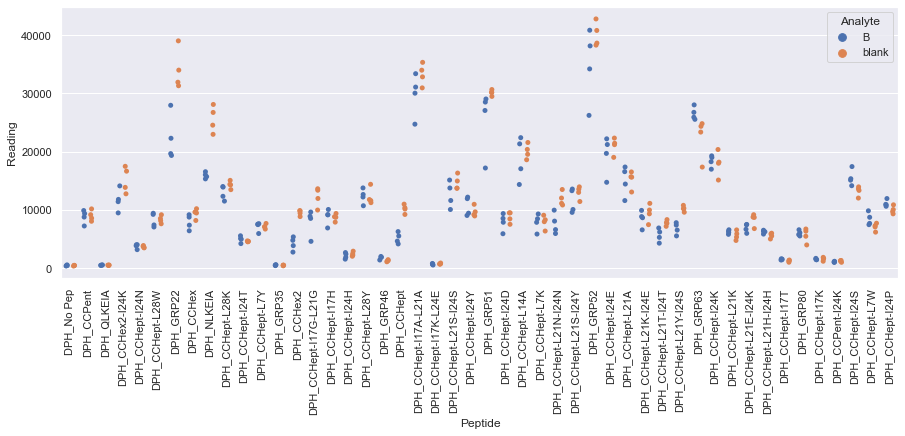

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_1.xlsx
Drawing scatter plot of data spread for D_repeat_1 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

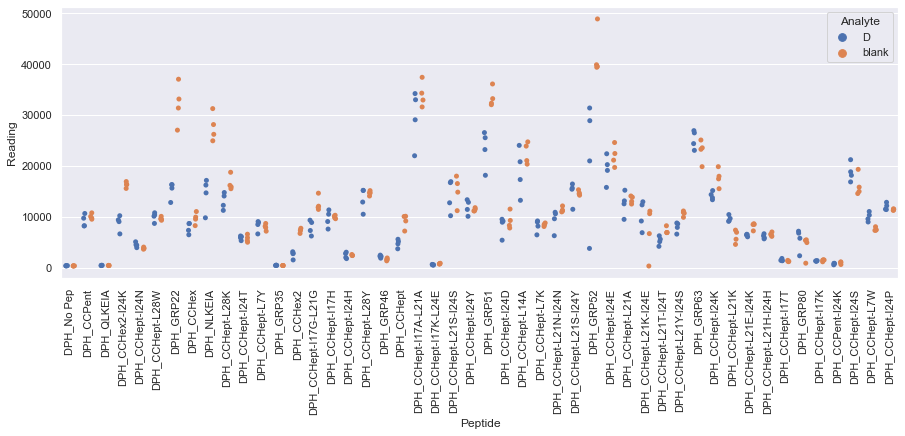

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_1.xlsx
Drawing scatter plot of data spread for N_repeat_1 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

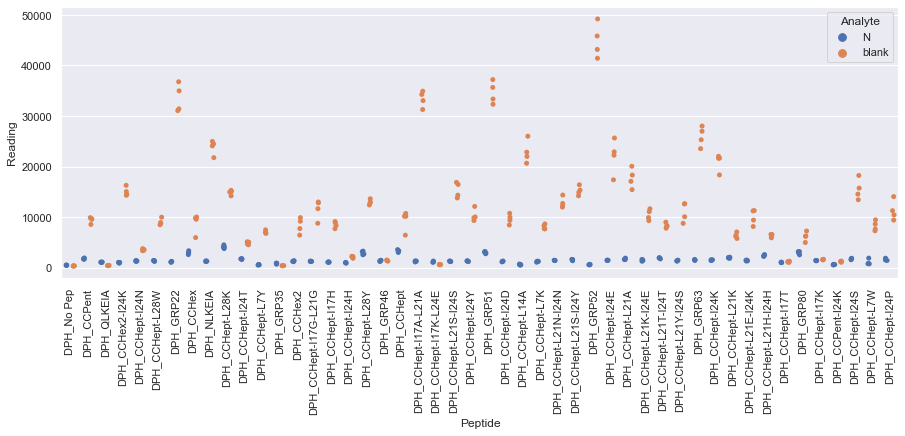

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_1.xlsx
Drawing scatter plot of data spread for O_repeat_1 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

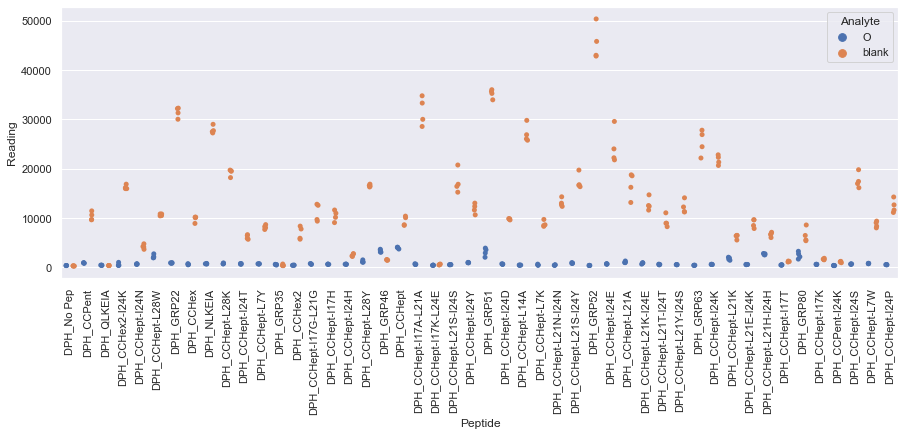

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_1.xlsx
Drawing scatter plot of data spread for P_repeat_1 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

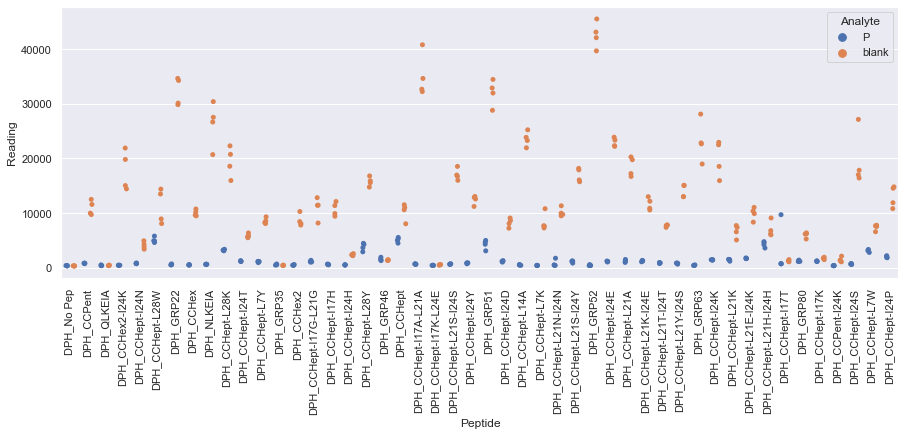

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_2.xlsx
Drawing scatter plot of data spread for B_repeat_2 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

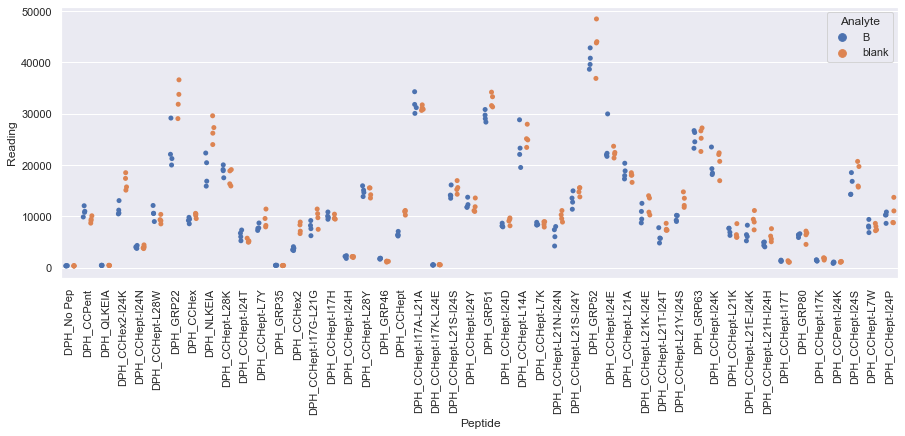

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_2.xlsx
Drawing scatter plot of data spread for D_repeat_2 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

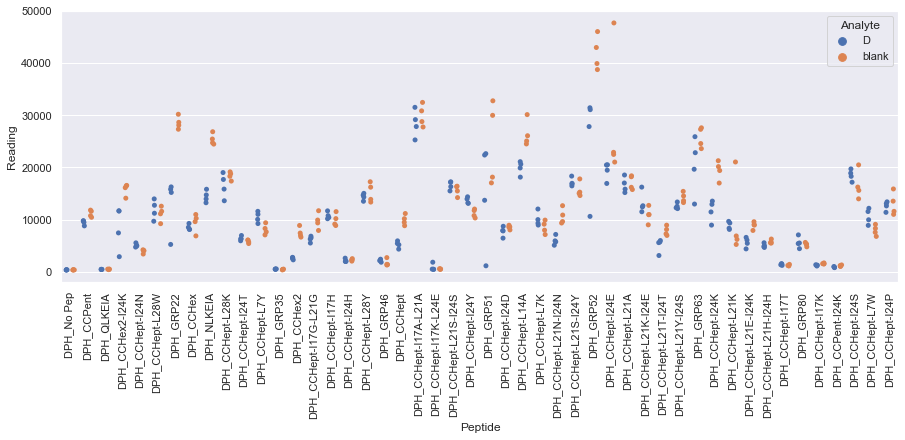

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_2.xlsx
Drawing scatter plot of data spread for N_repeat_2 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

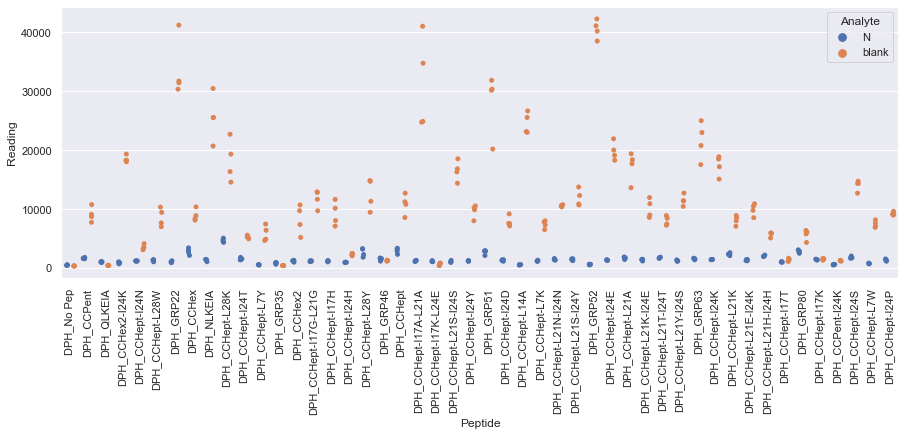

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_2.xlsx
Drawing scatter plot of data spread for O_repeat_2 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

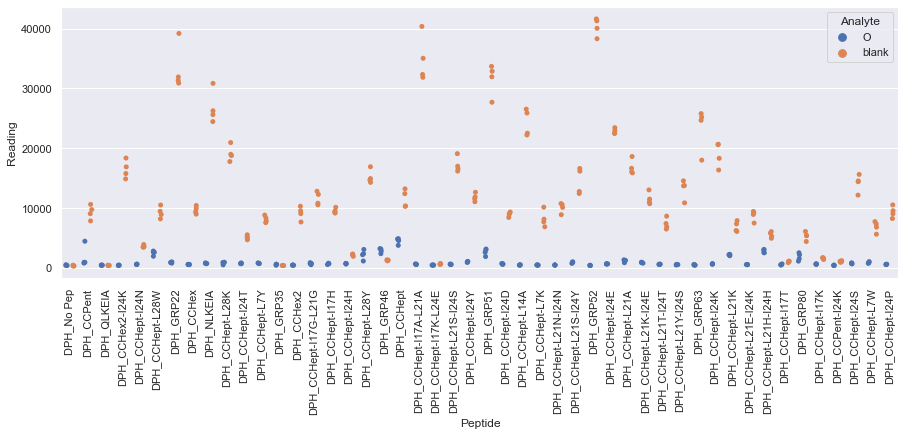

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_2.xlsx
Drawing scatter plot of data spread for P_repeat_2 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

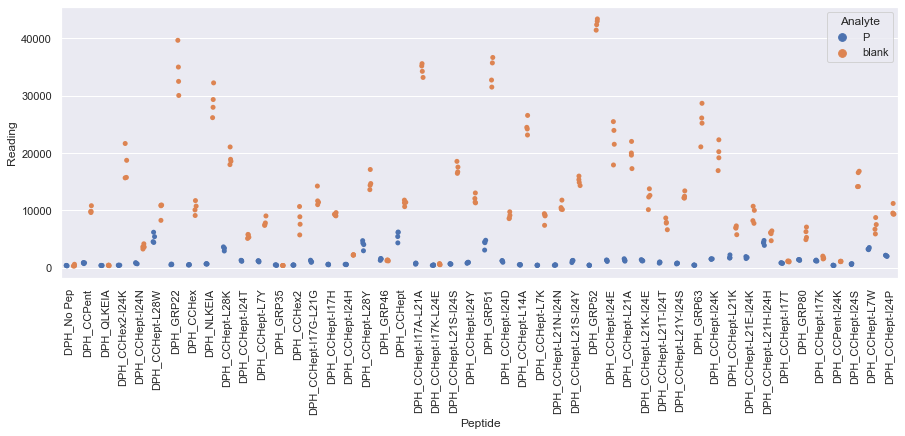

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_3.xlsx
Drawing scatter plot of data spread for B_repeat_3 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

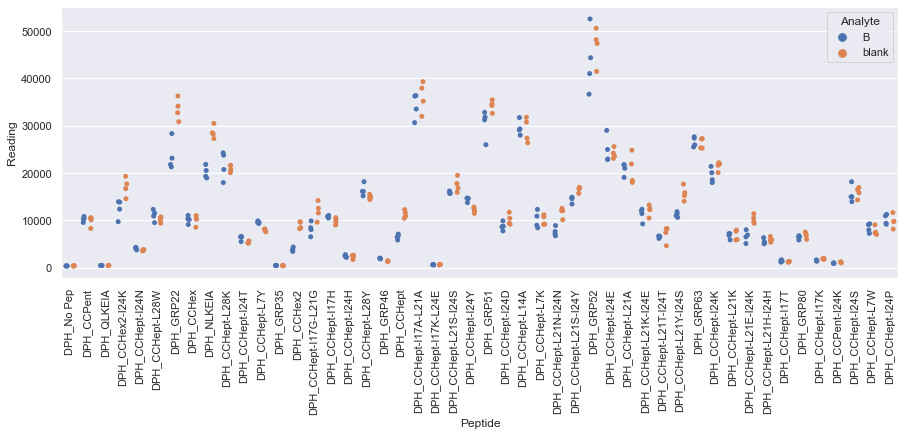

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_3.xlsx
Drawing scatter plot of data spread for D_repeat_3 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

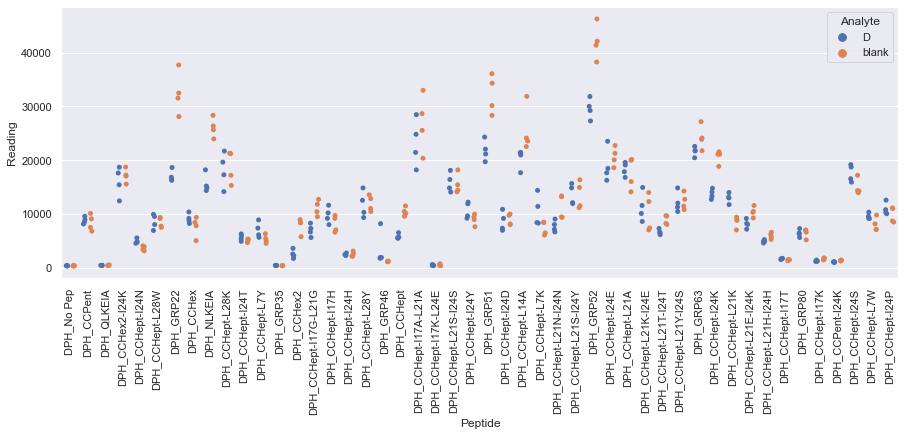

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_3.xlsx
Drawing scatter plot of data spread for N_repeat_3 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

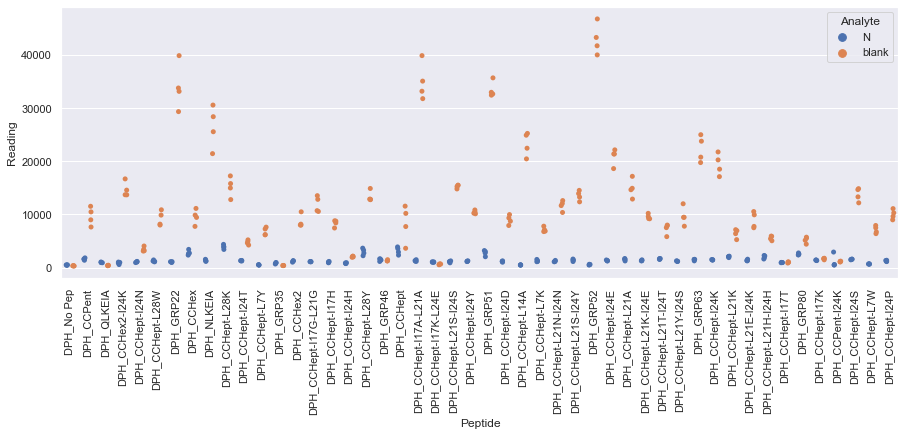

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_3.xlsx
Drawing scatter plot of data spread for O_repeat_3 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

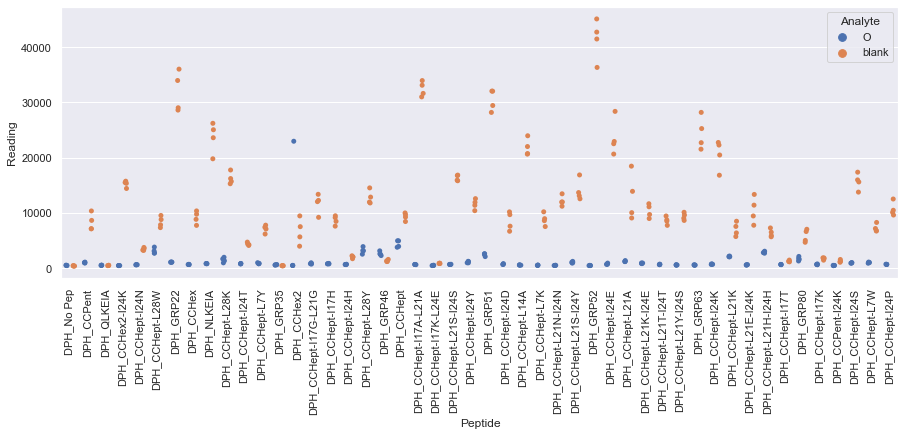

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_3.xlsx
Drawing scatter plot of data spread for P_repeat_3 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

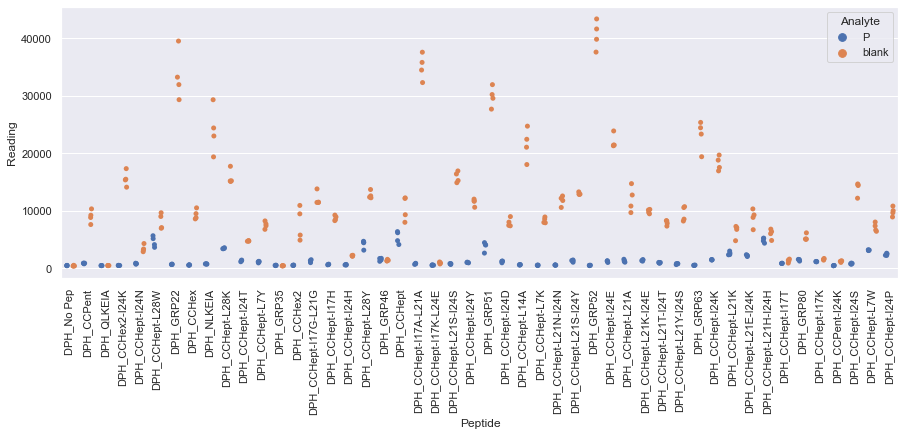

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_4.xlsx
Drawing scatter plot of data spread for B_repeat_4 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

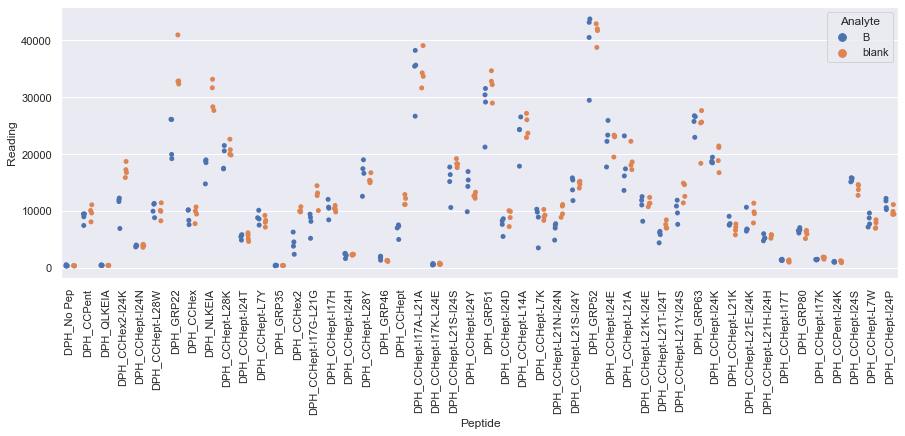

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_4.xlsx
Drawing scatter plot of data spread for D_repeat_4 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

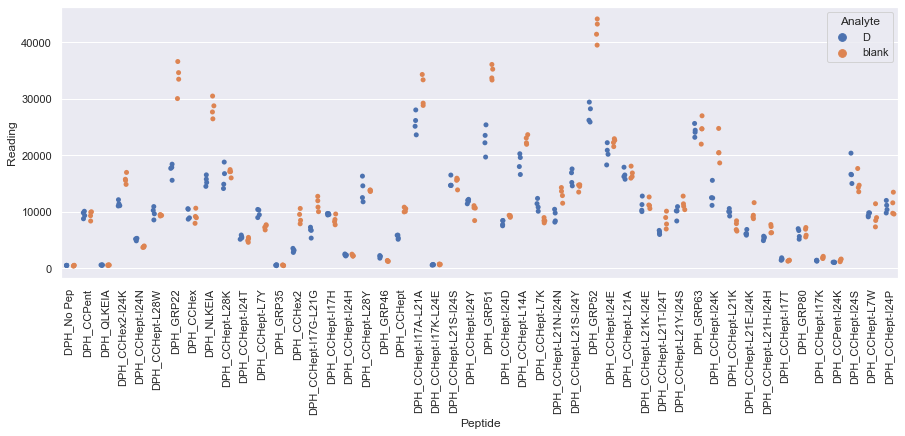

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_4.xlsx
Drawing scatter plot of data spread for N_repeat_4 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

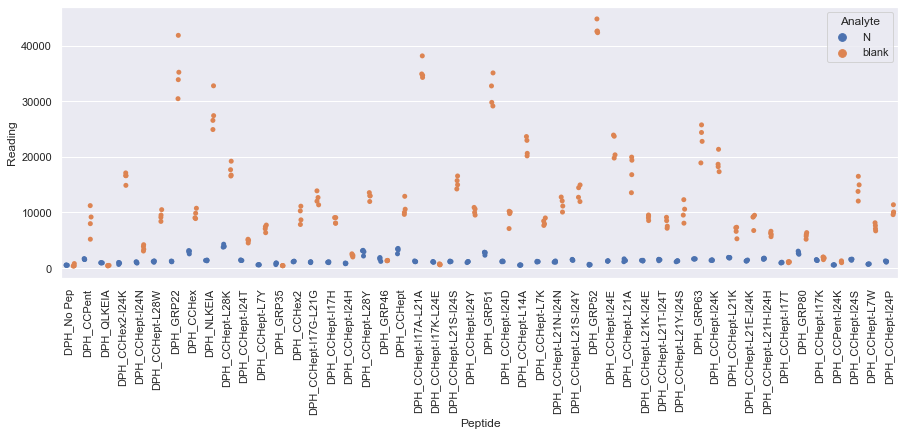

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_4.xlsx
Drawing scatter plot of data spread for O_repeat_4 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

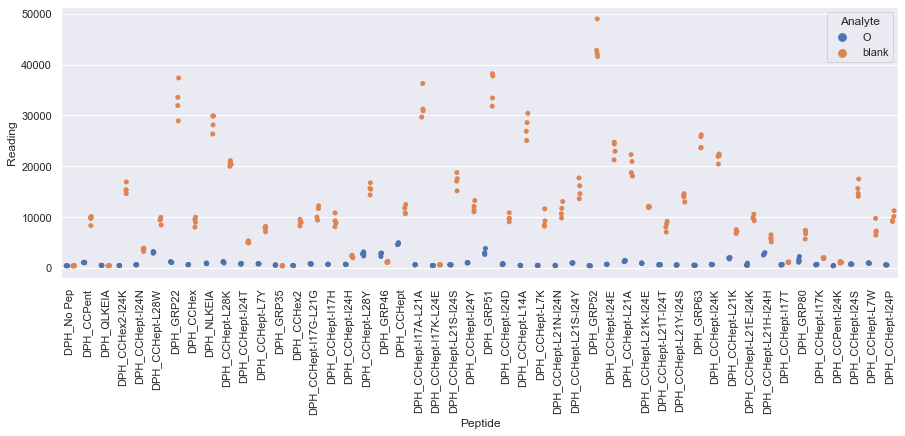

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_4.xlsx
Drawing scatter plot of data spread for P_repeat_4 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

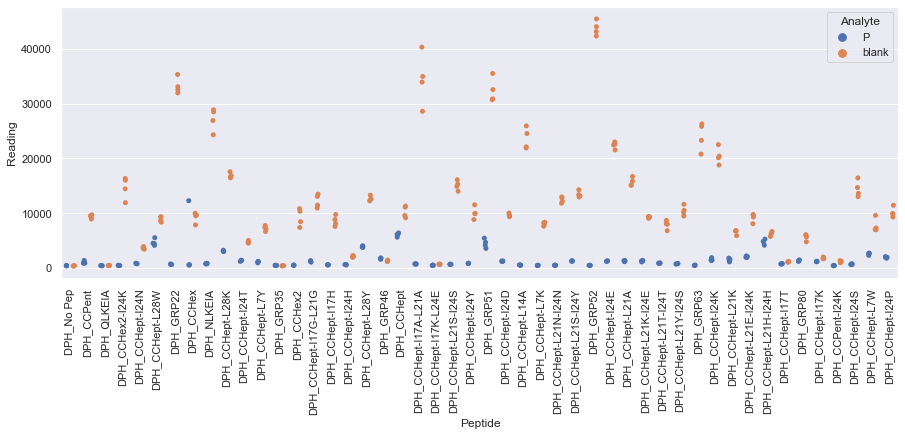

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_5.xlsx
Drawing scatter plot of data spread for B_repeat_5 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

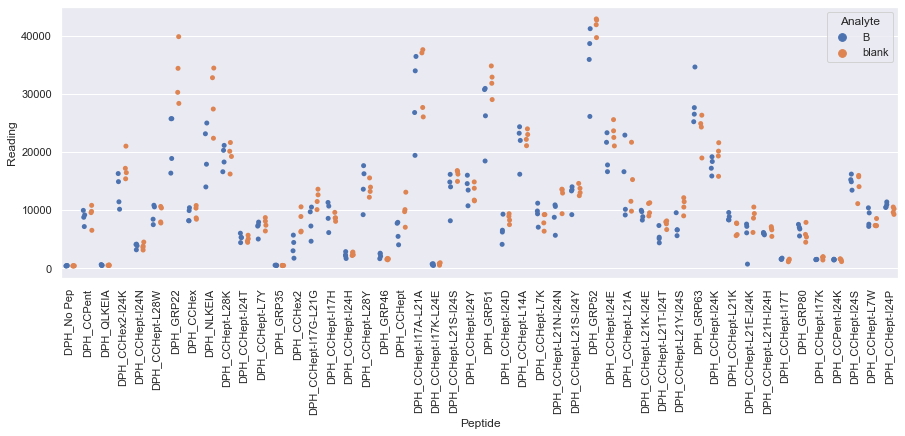

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_5.xlsx
Drawing scatter plot of data spread for D_repeat_5 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

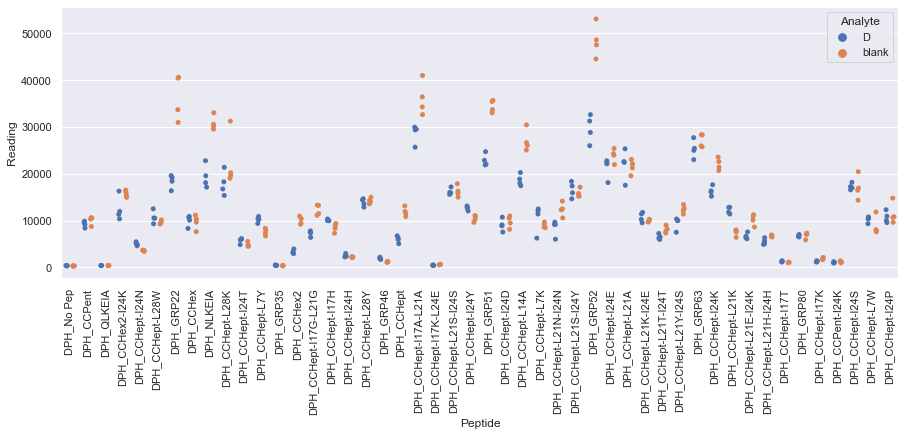

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_5.xlsx
Drawing scatter plot of data spread for N_repeat_5 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

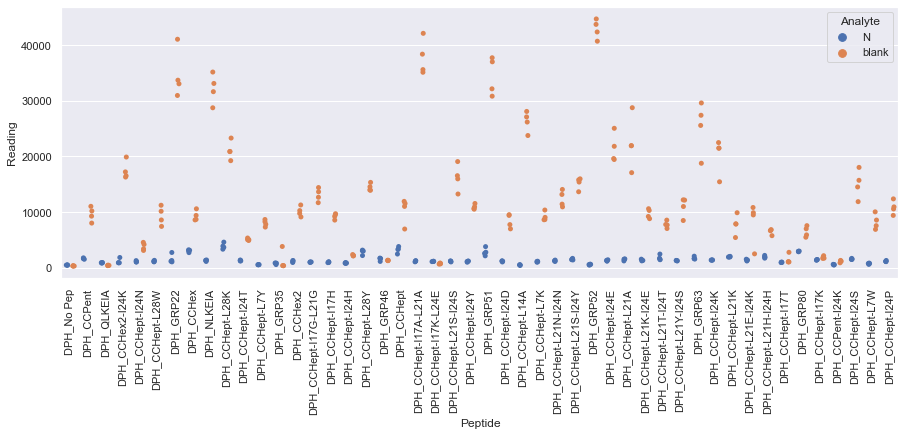

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_5.xlsx
Drawing scatter plot of data spread for O_repeat_5 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

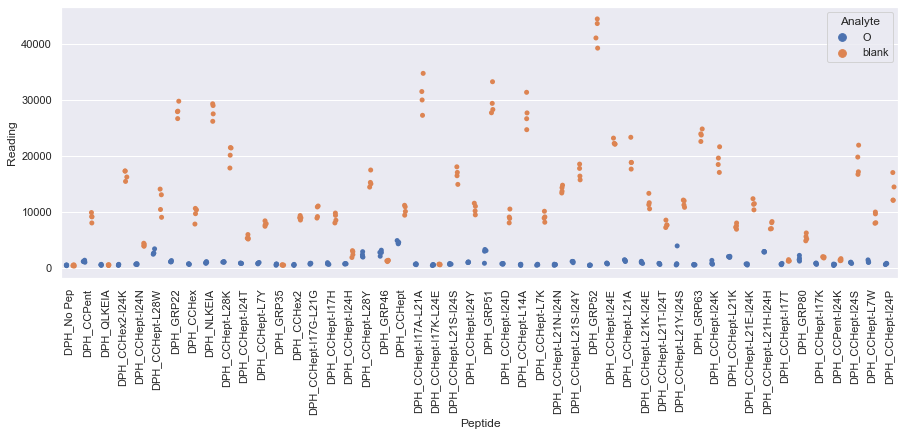

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_5.xlsx
Drawing scatter plot of data spread for P_repeat_5 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

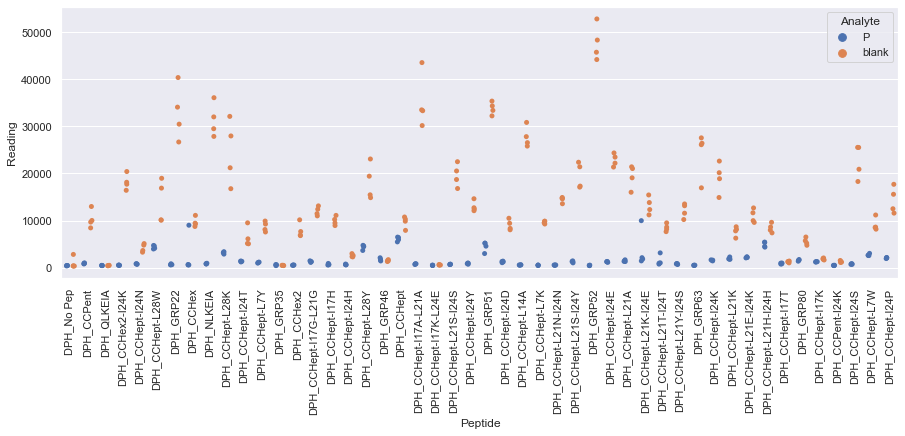

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_6.xlsx
Drawing scatter plot of data spread for B_repeat_6 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

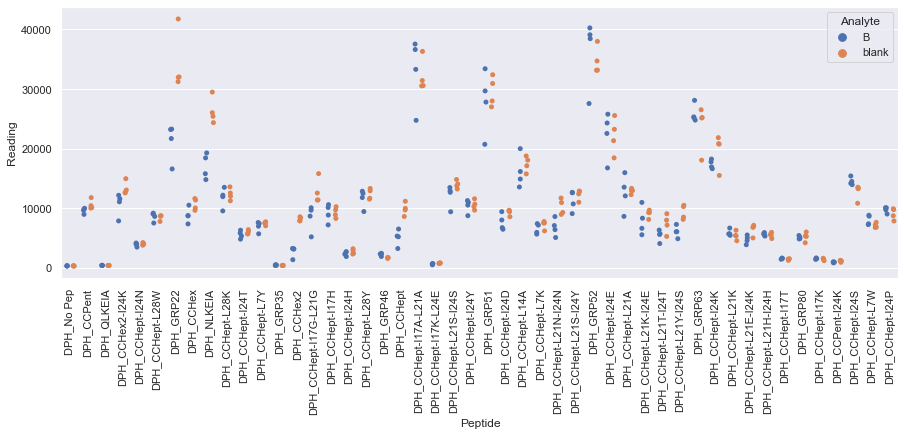

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_6.xlsx
Drawing scatter plot of data spread for D_repeat_6 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

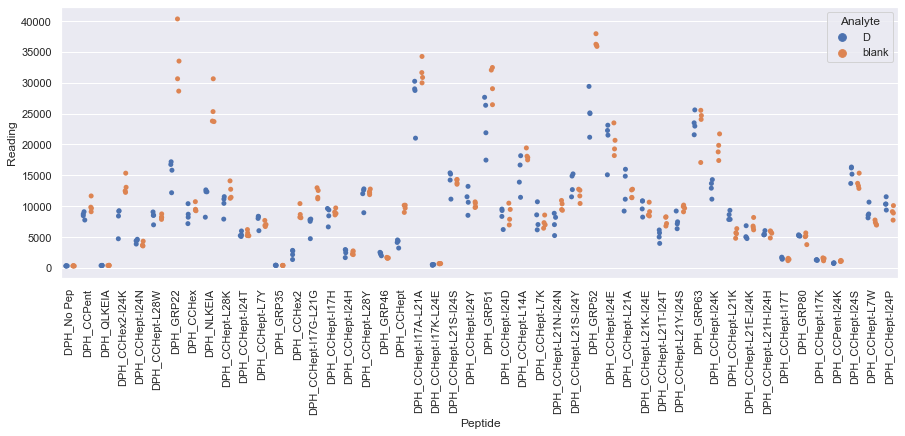

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_6.xlsx
Drawing scatter plot of data spread for N_repeat_6 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

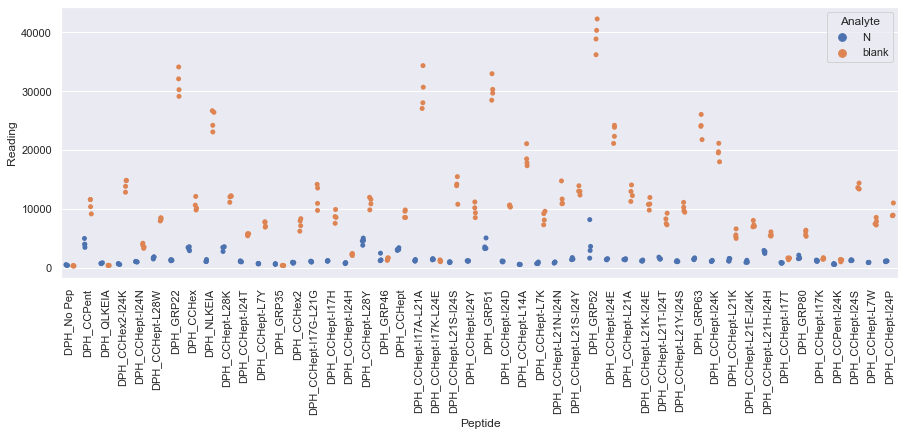

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_6.xlsx
Drawing scatter plot of data spread for O_repeat_6 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

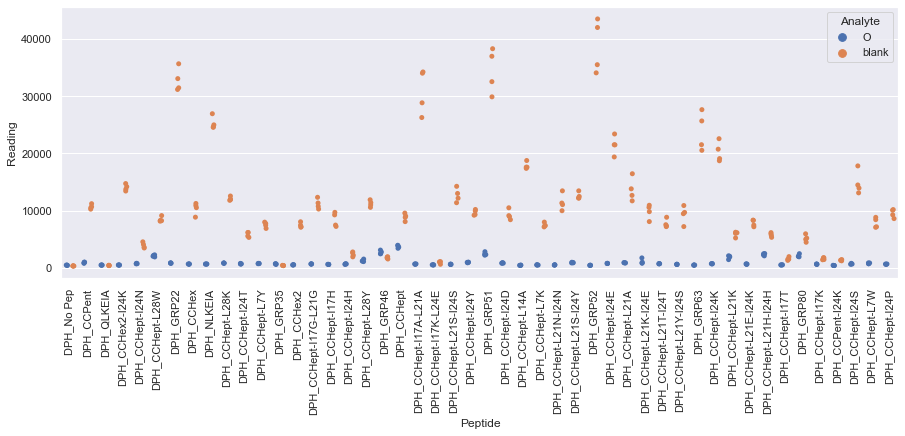

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_6.xlsx
Drawing scatter plot of data spread for P_repeat_6 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

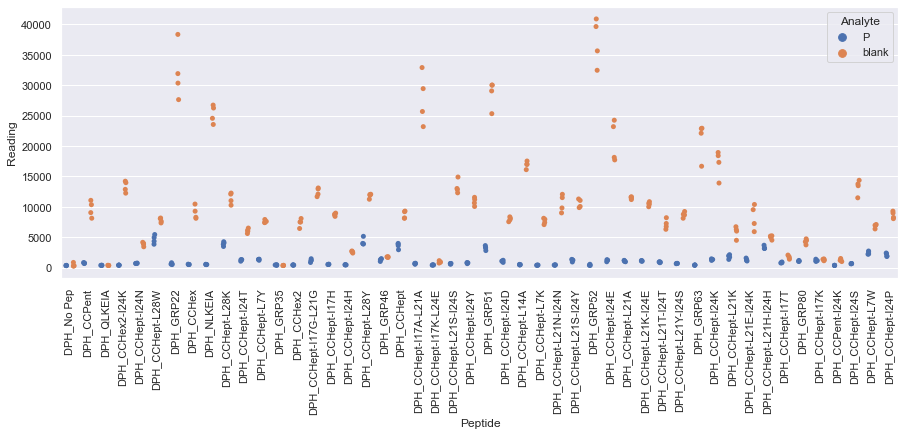

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_7.xlsx
Drawing scatter plot of data spread for B_repeat_7 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

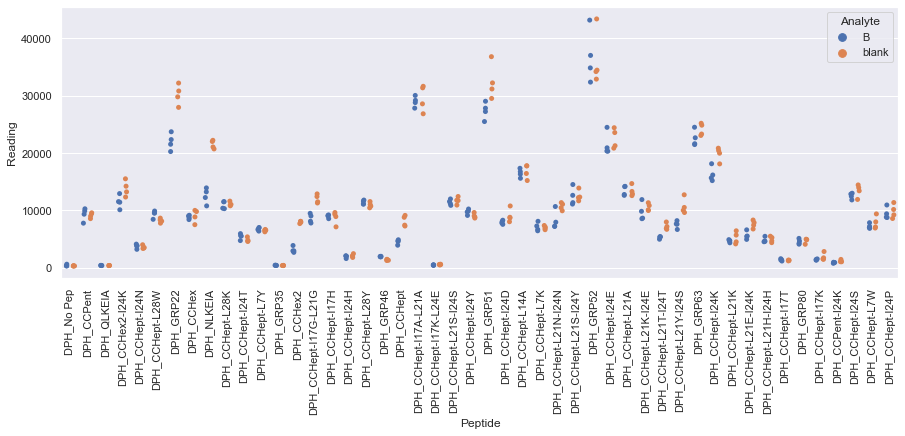

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_7.xlsx
Drawing scatter plot of data spread for D_repeat_7 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

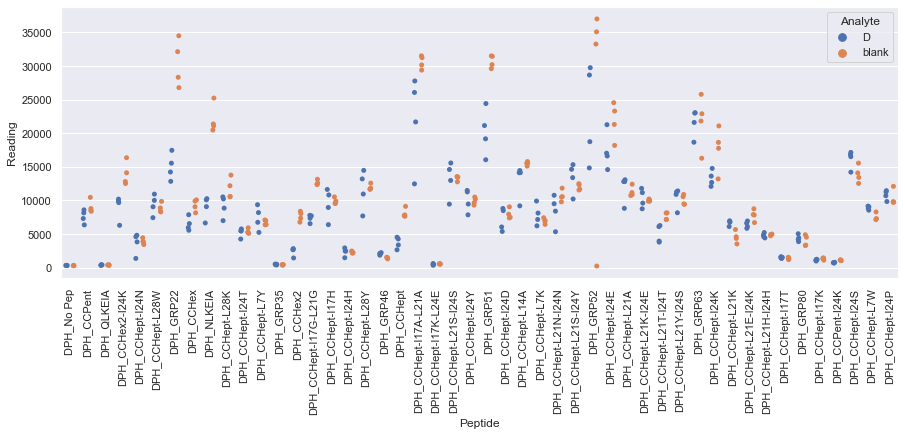

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_7.xlsx
Drawing scatter plot of data spread for N_repeat_7 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

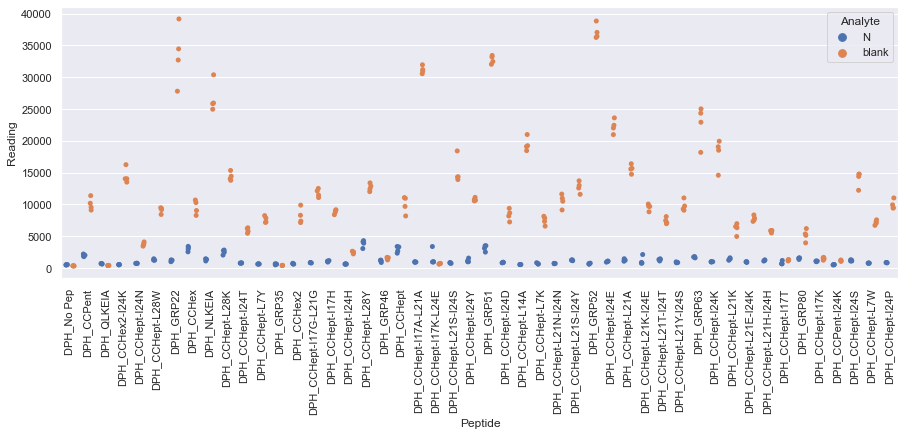

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_7.xlsx
Drawing scatter plot of data spread for O_repeat_7 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

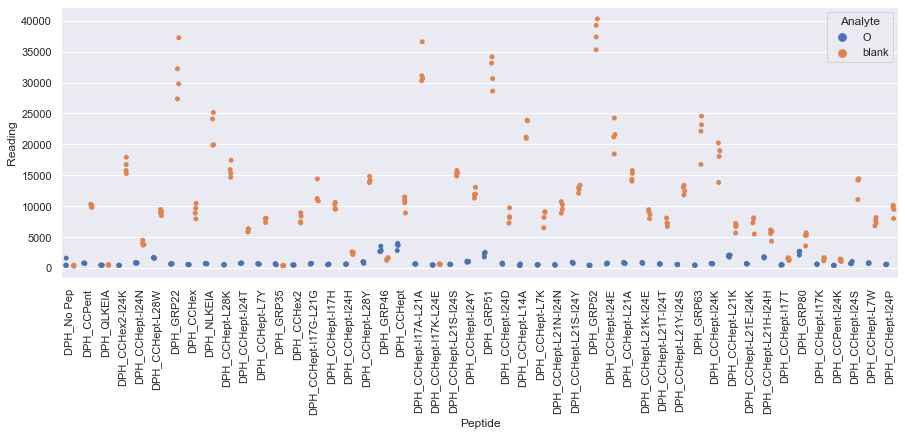

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_7.xlsx
Drawing scatter plot of data spread for P_repeat_7 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

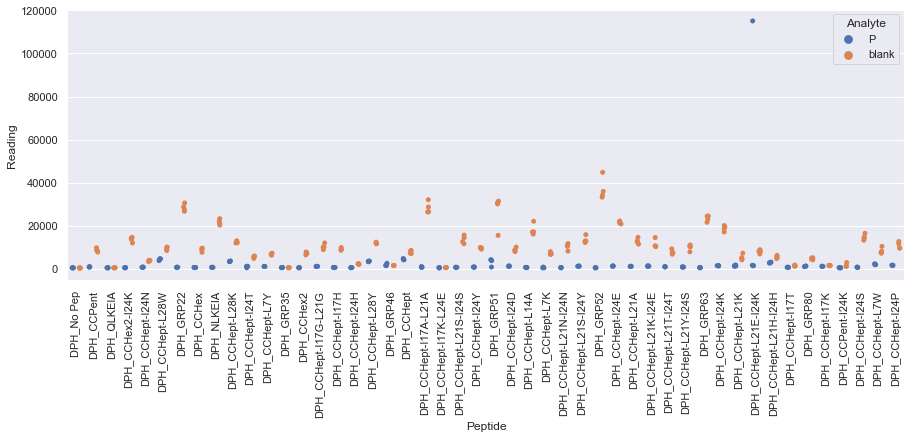

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_8.xlsx
Drawing scatter plot of data spread for B_repeat_8 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

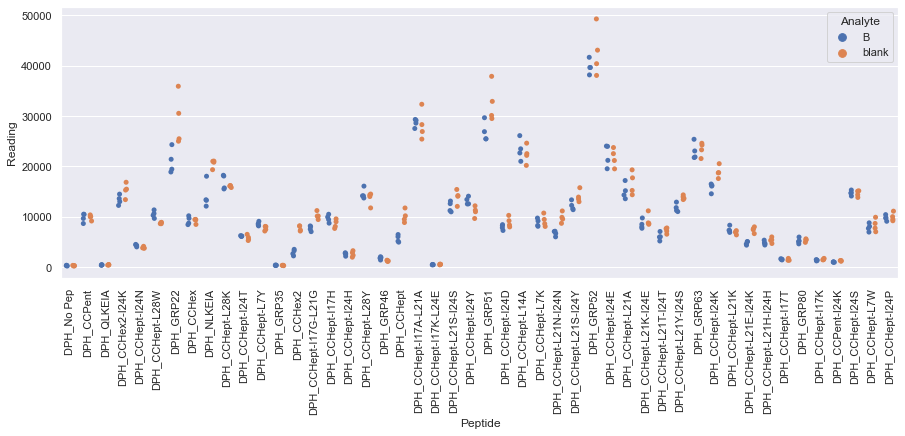

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_8.xlsx
Drawing scatter plot of data spread for D_repeat_8 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

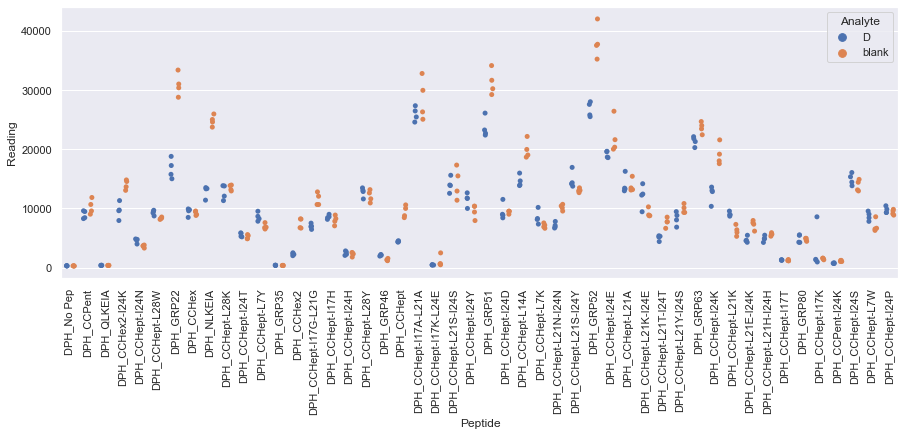

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_8.xlsx
Drawing scatter plot of data spread for N_repeat_8 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

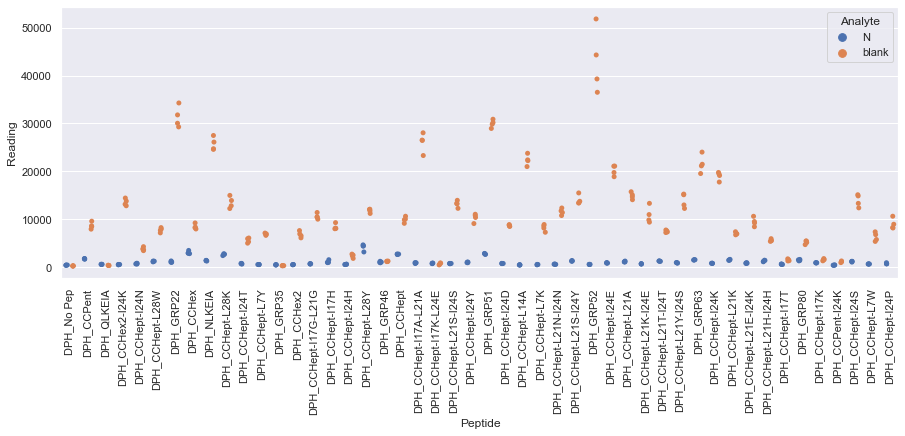

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_8.xlsx
Drawing scatter plot of data spread for O_repeat_8 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

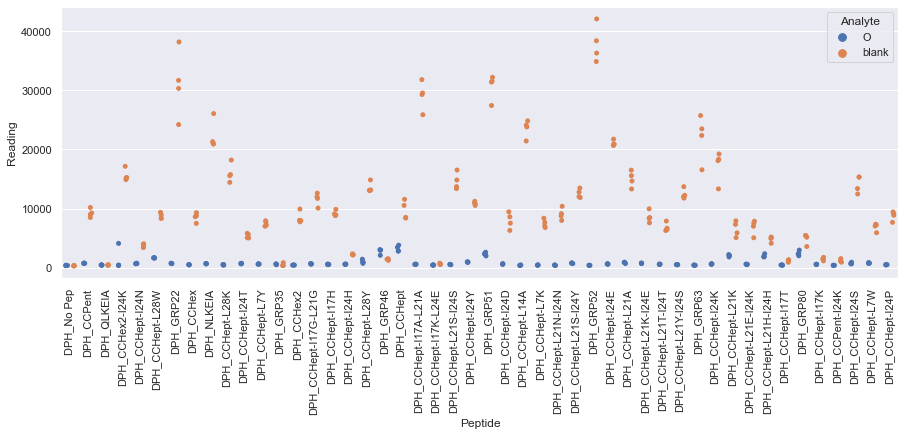

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_8.xlsx
Drawing scatter plot of data spread for P_repeat_8 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

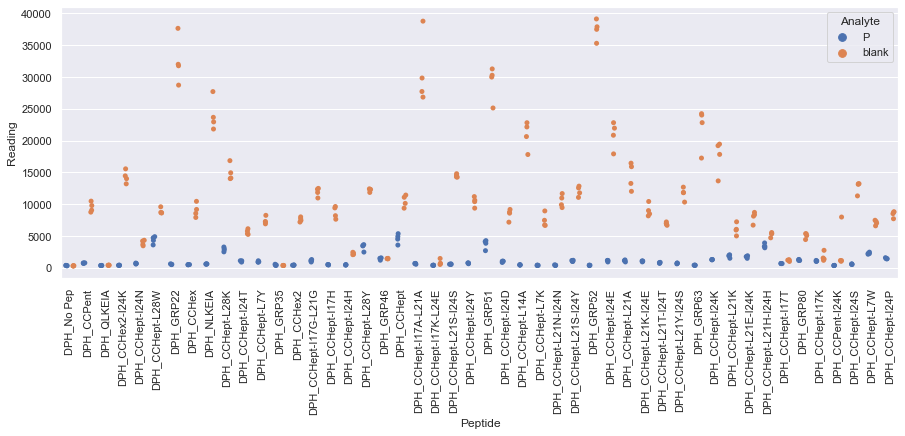

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_9.xlsx
Drawing scatter plot of data spread for B_repeat_9 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

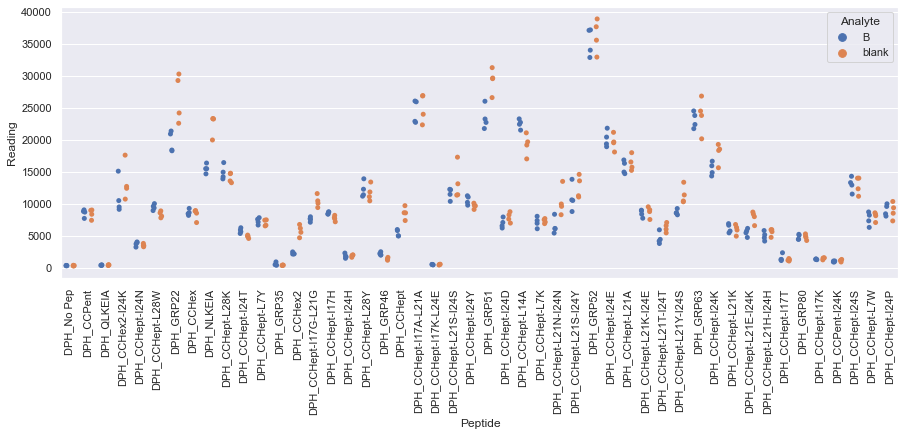

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_9.xlsx
Drawing scatter plot of data spread for D_repeat_9 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

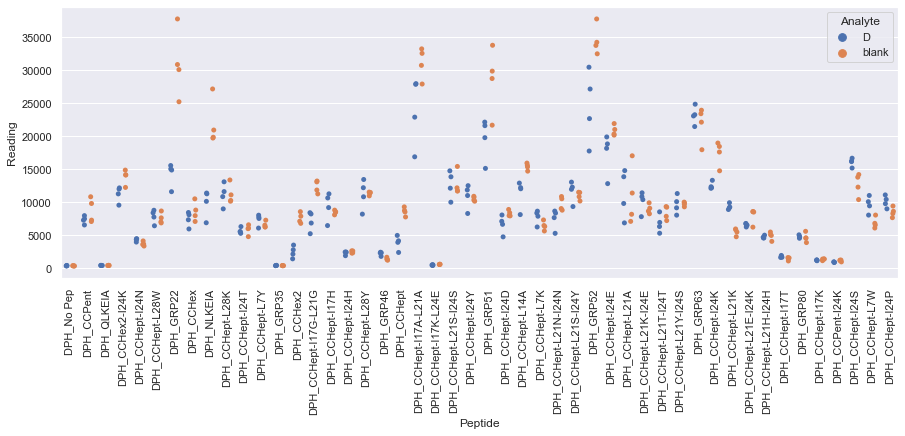

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_9.xlsx
Drawing scatter plot of data spread for N_repeat_9 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

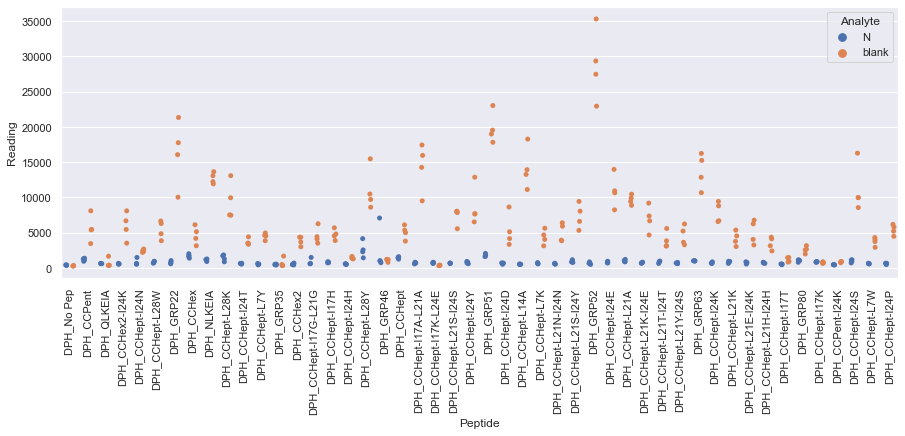

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_9.xlsx
Drawing scatter plot of data spread for O_repeat_9 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

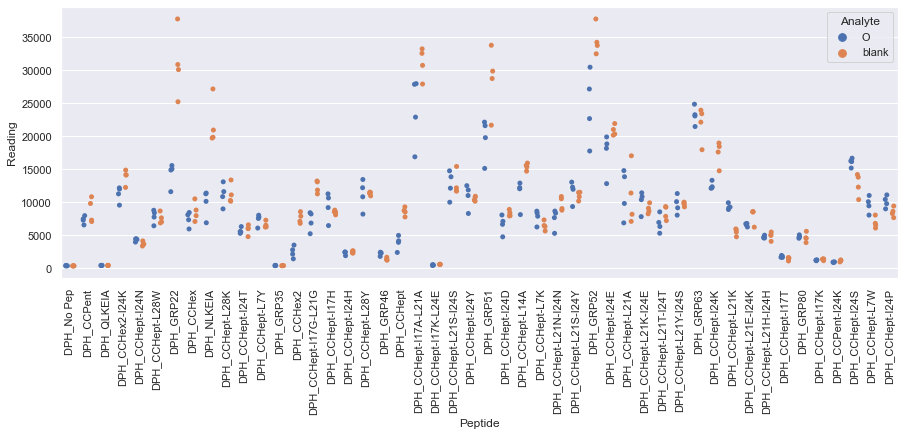

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_9.xlsx
Drawing scatter plot of data spread for P_repeat_9 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

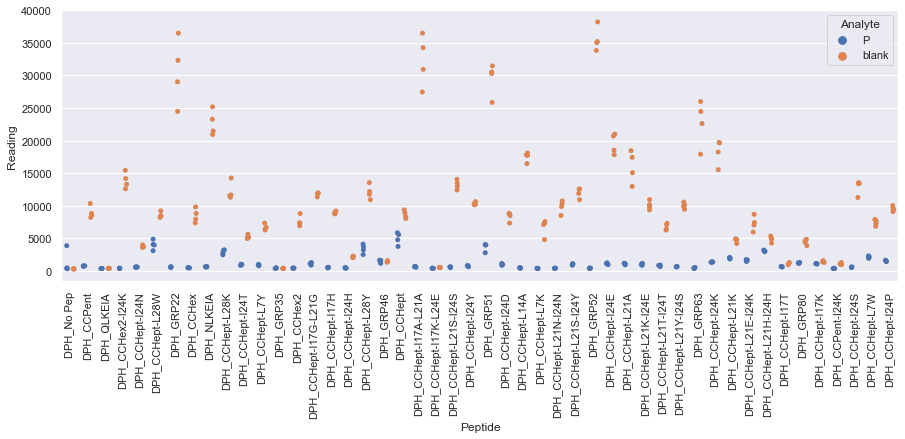

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_10.xlsx
Drawing scatter plot of data spread for B_repeat_10 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

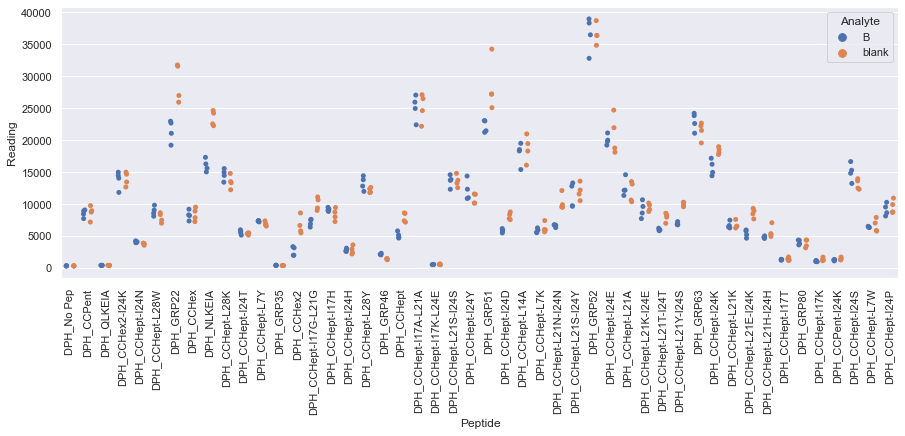

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_10.xlsx
Drawing scatter plot of data spread for D_repeat_10 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

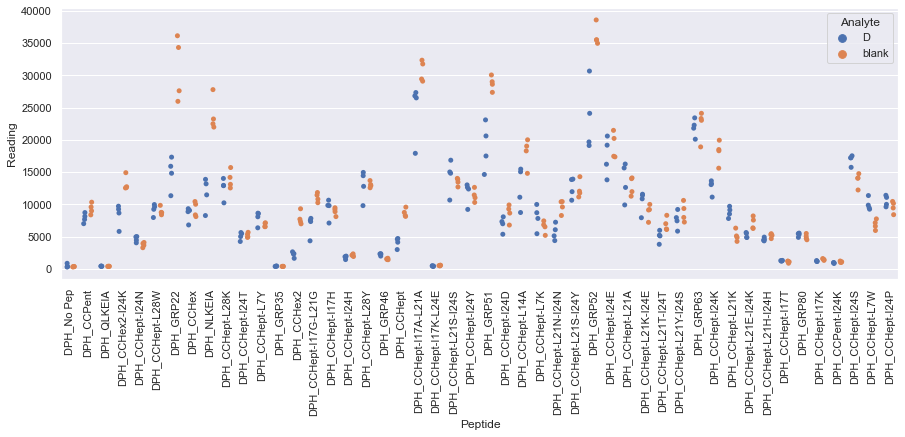

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_10.xlsx
Drawing scatter plot of data spread for N_repeat_10 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

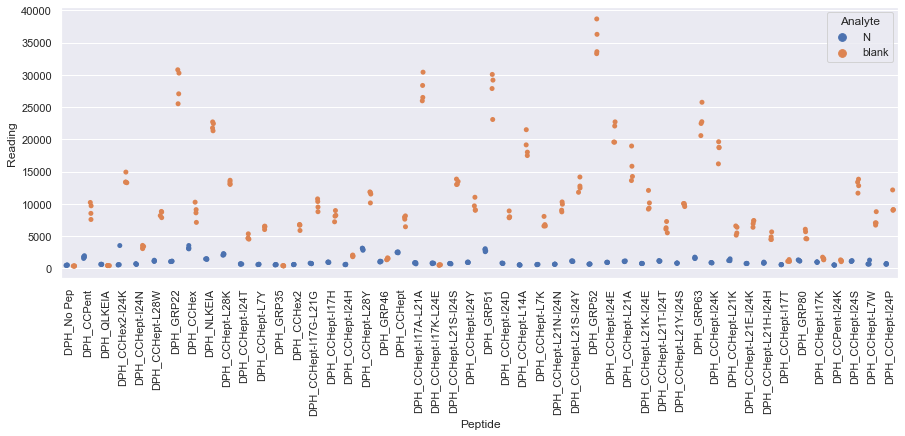

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_10.xlsx
Drawing scatter plot of data spread for O_repeat_10 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

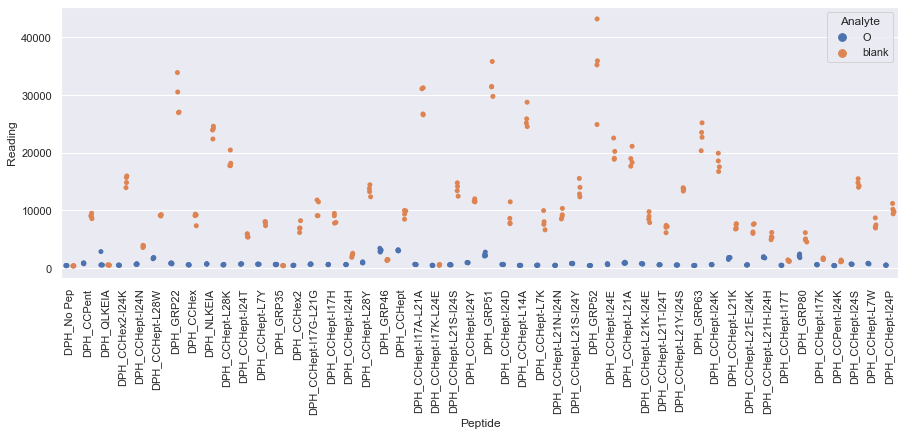

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_10.xlsx
Drawing scatter plot of data spread for P_repeat_10 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

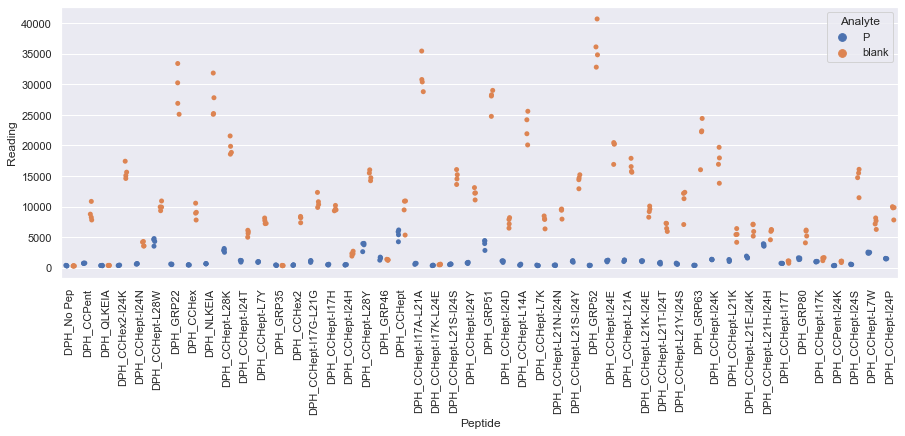

Drawing scatter plot of data spread for B_repeat_1 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

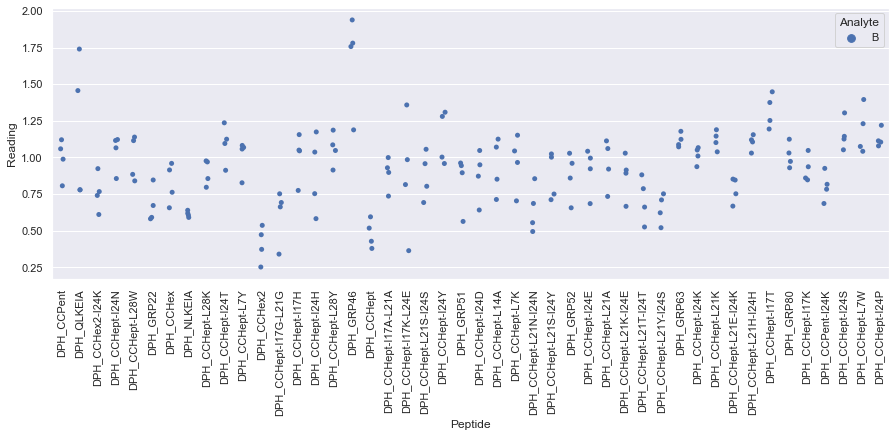

Drawing scatter plot of data spread for D_repeat_1 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

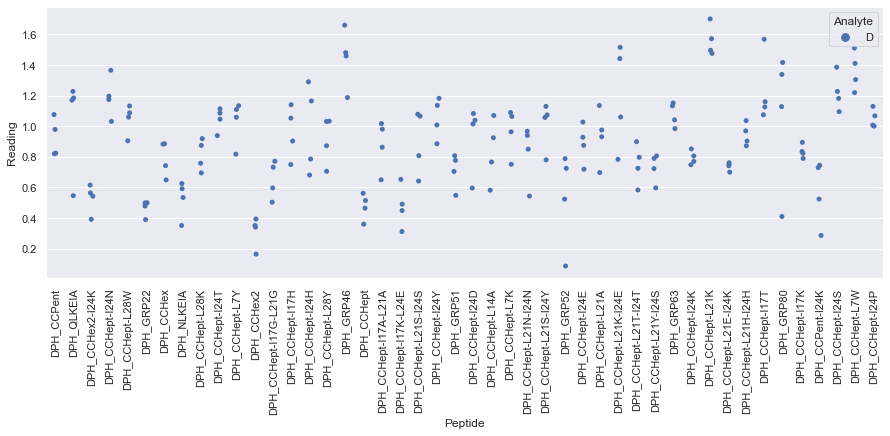

Drawing scatter plot of data spread for N_repeat_1 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

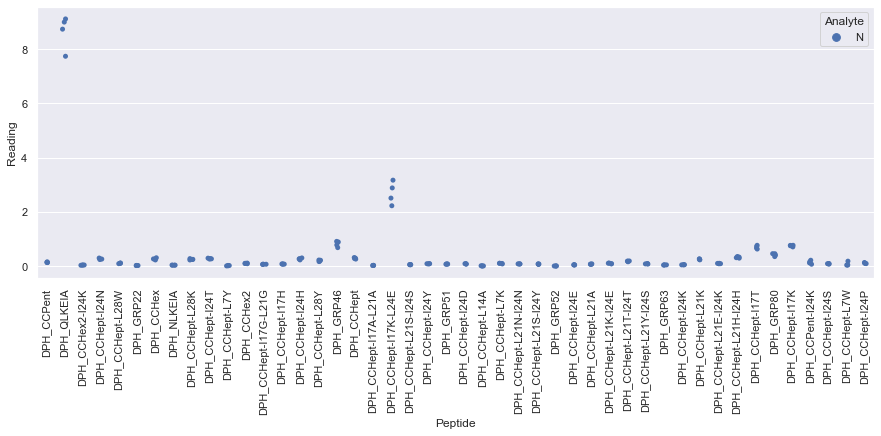

 WARNING - median fluorescence of (O + DPH_CCPent-I24K + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_1.xlsx. Analysis will continue but please CHECK YOUR DATA. 
Drawing scatter plot of data spread for O_repeat_1 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

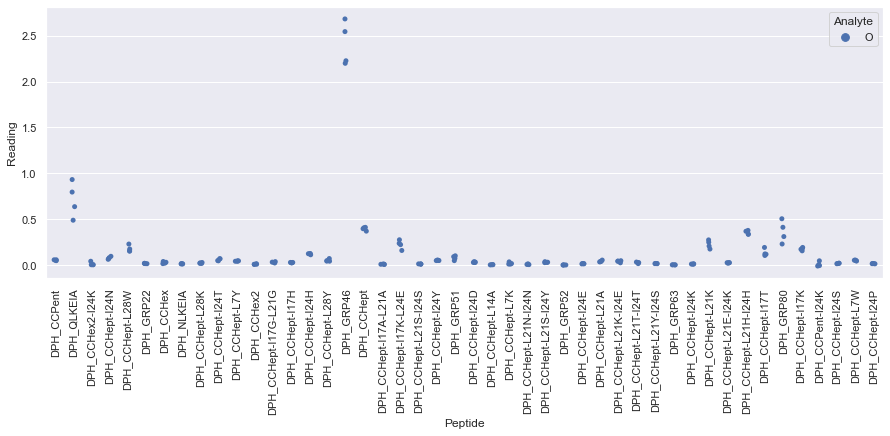

Drawing scatter plot of data spread for P_repeat_1 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

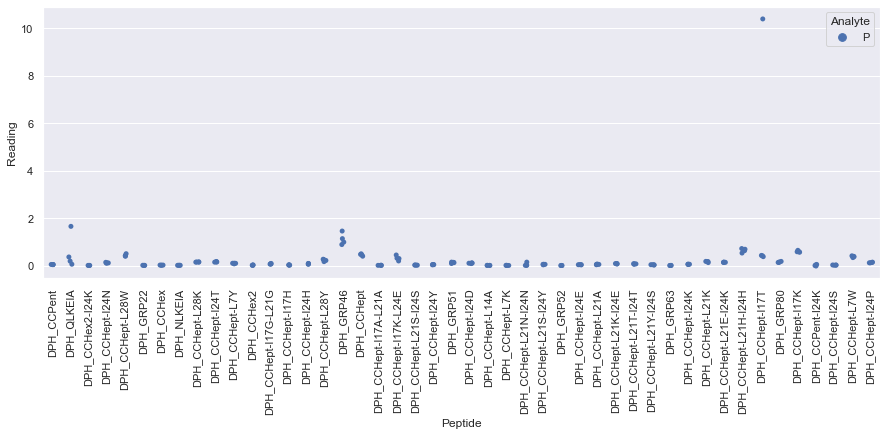

Drawing scatter plot of data spread for B_repeat_2 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

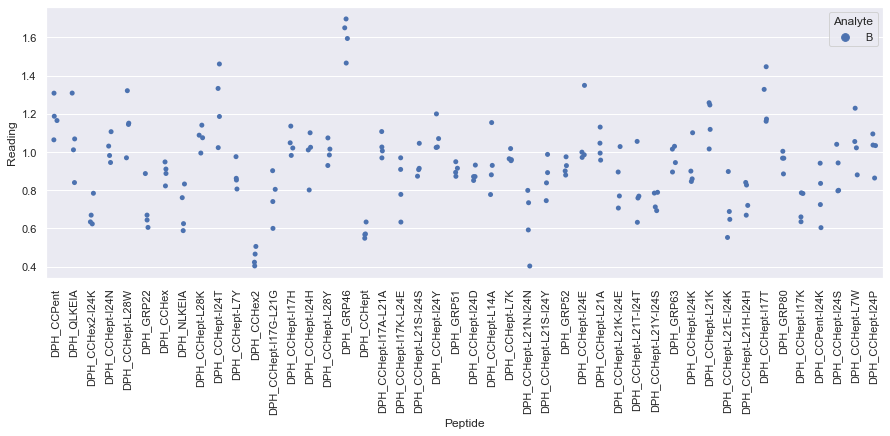

Drawing scatter plot of data spread for D_repeat_2 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

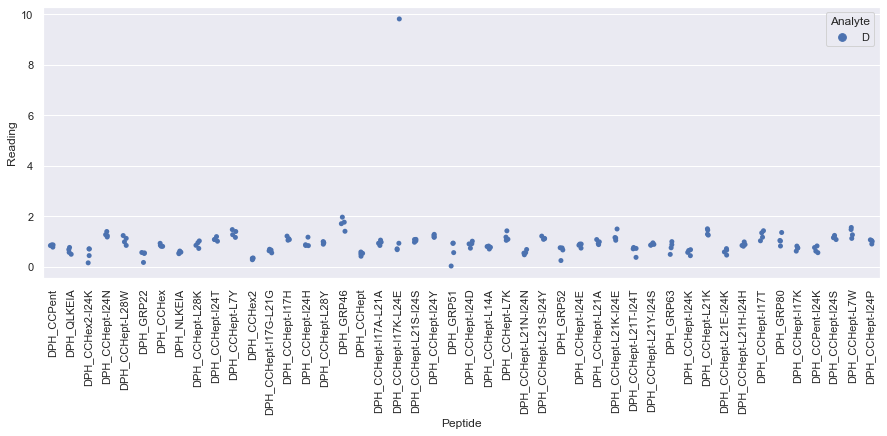

Drawing scatter plot of data spread for N_repeat_2 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

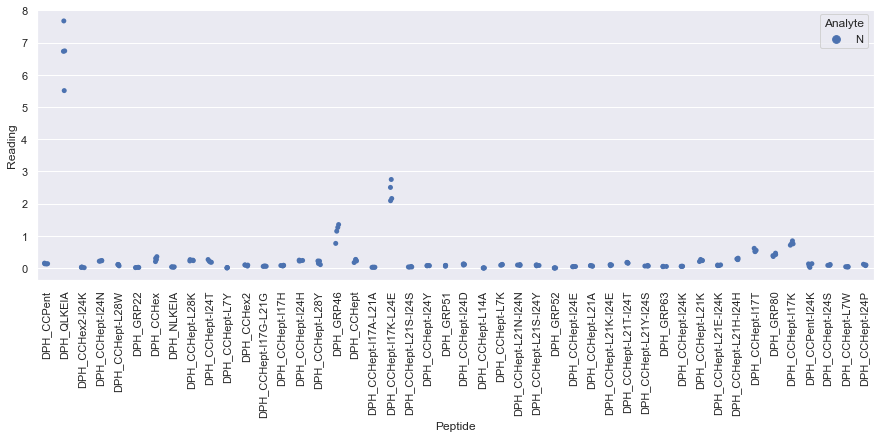

Drawing scatter plot of data spread for O_repeat_2 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

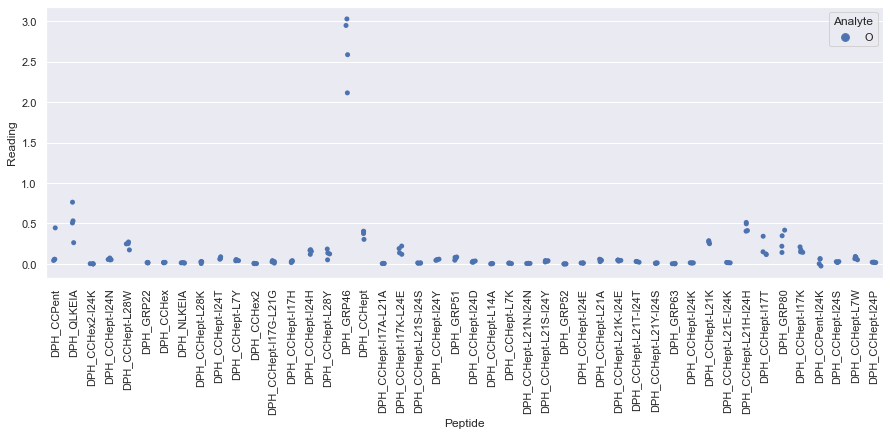

Drawing scatter plot of data spread for P_repeat_2 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

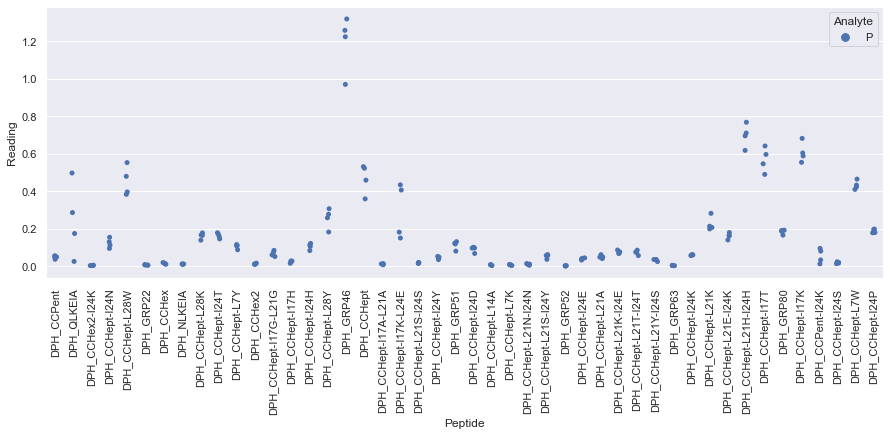

Drawing scatter plot of data spread for B_repeat_3 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

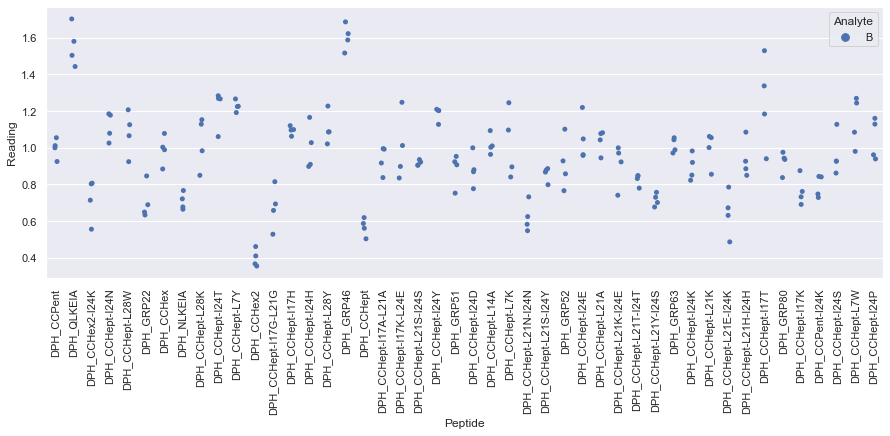

Drawing scatter plot of data spread for D_repeat_3 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

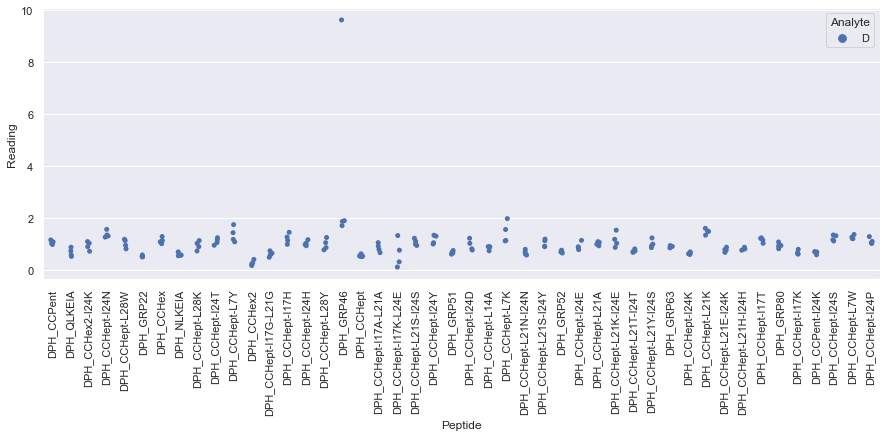

 WARNING - median fluorescence of (N + DPH_CCHept-L14A + fluorophore) is less than fluorescence of (N + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_3.xlsx. Analysis will continue but please CHECK YOUR DATA. 
Drawing scatter plot of data spread for N_repeat_3 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

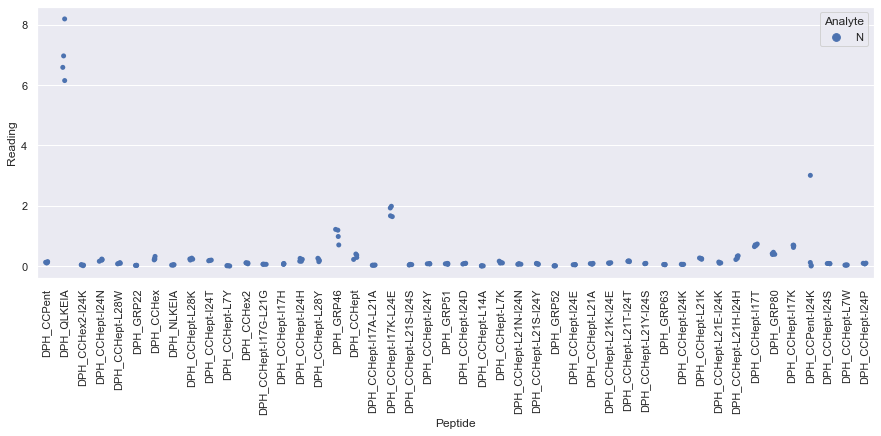

 WARNING - median fluorescence of (O + DPH_CCHex2-I24K + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_3.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (O + DPH_CCHex2 + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_3.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (O + DPH_GRP52 + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_3.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (O + DPH_CCPent-I24K + fluorophore) is less than fluorescence of (O + fluo

<Figure size 720x720 with 0 Axes>

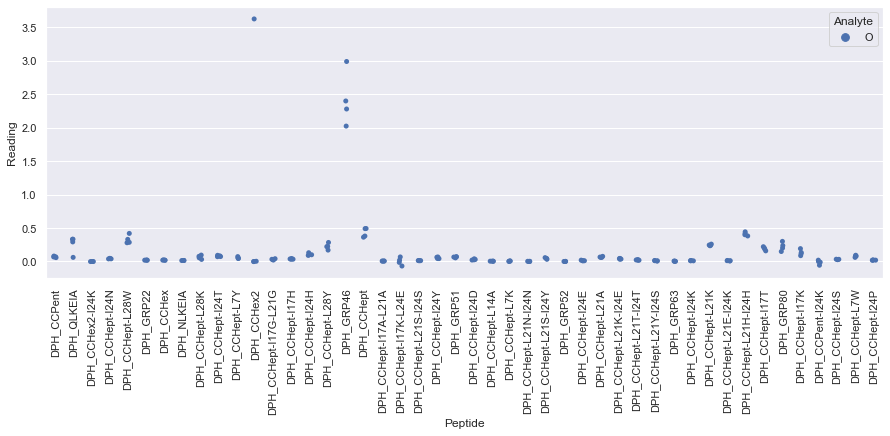

 WARNING - median fluorescence of (P + DPH_QLKEIA + fluorophore) is less than fluorescence of (P + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_3.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (P + DPH_CCPent-I24K + fluorophore) is less than fluorescence of (P + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_3.xlsx. Analysis will continue but please CHECK YOUR DATA. 
Drawing scatter plot of data spread for P_repeat_3 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

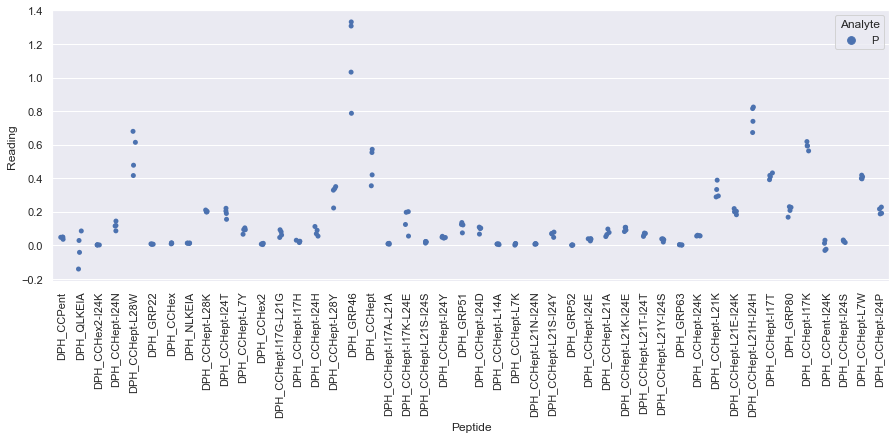

Drawing scatter plot of data spread for B_repeat_4 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

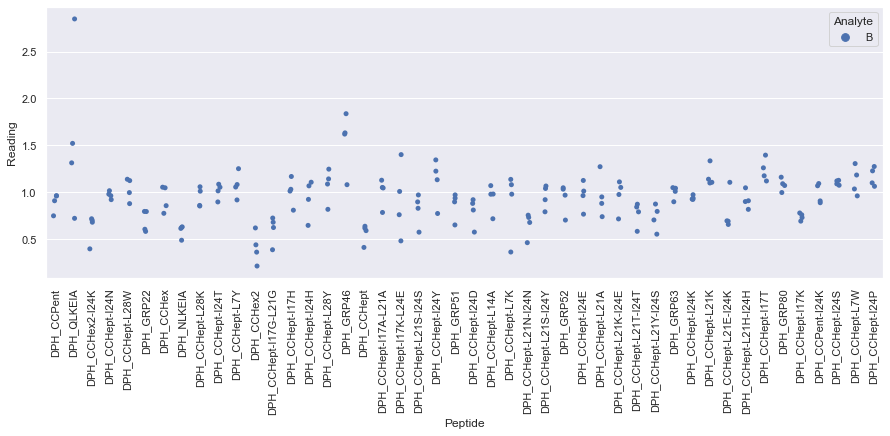

Drawing scatter plot of data spread for D_repeat_4 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

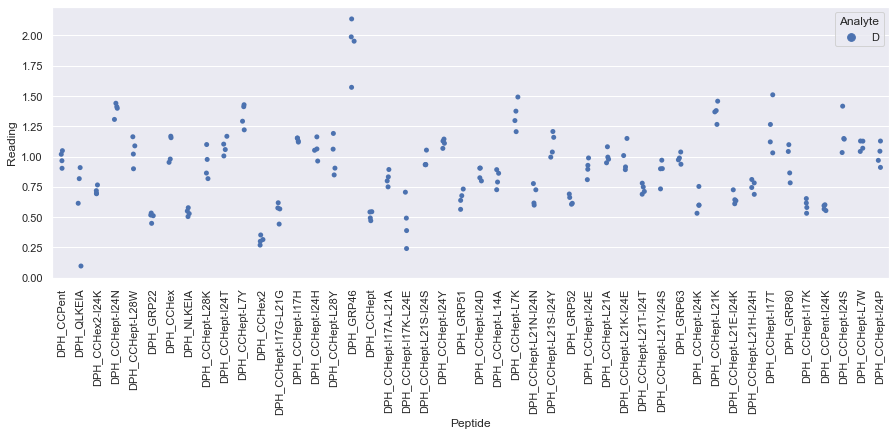

Drawing scatter plot of data spread for N_repeat_4 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

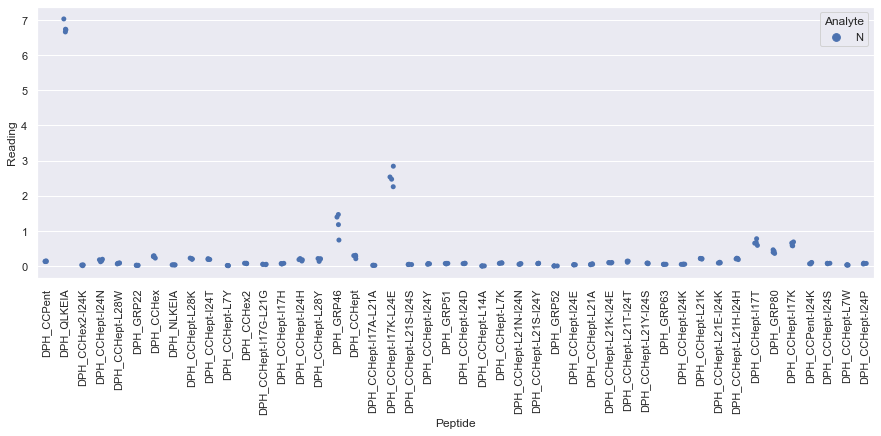

Drawing scatter plot of data spread for O_repeat_4 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

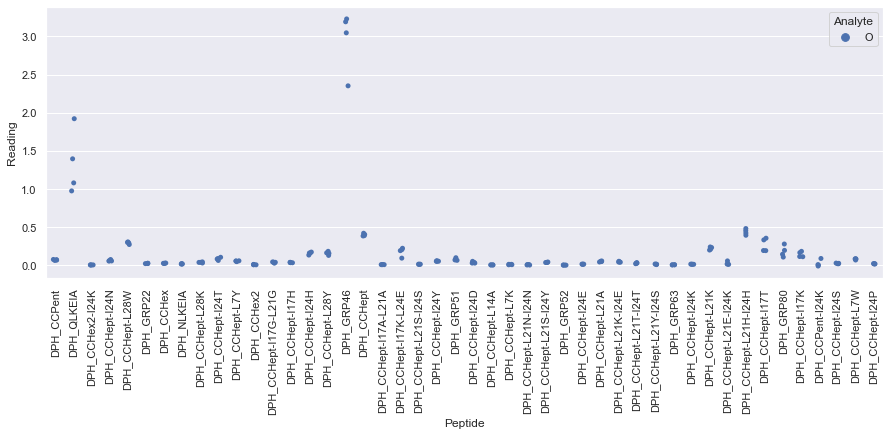

Drawing scatter plot of data spread for P_repeat_4 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

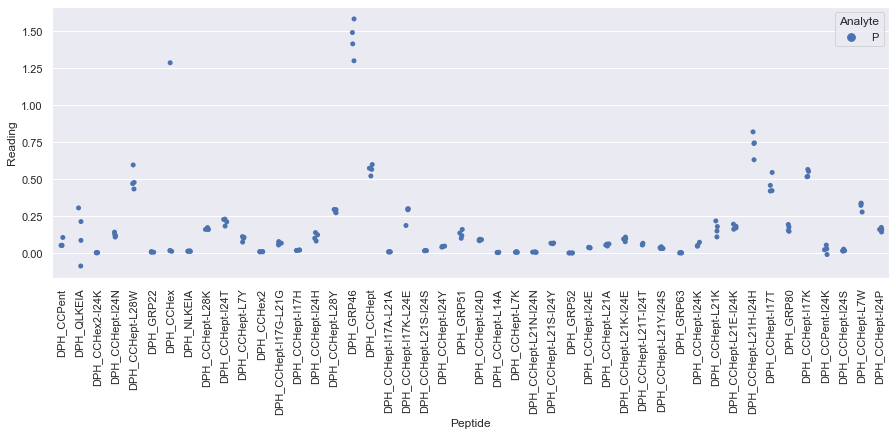

Drawing scatter plot of data spread for B_repeat_5 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

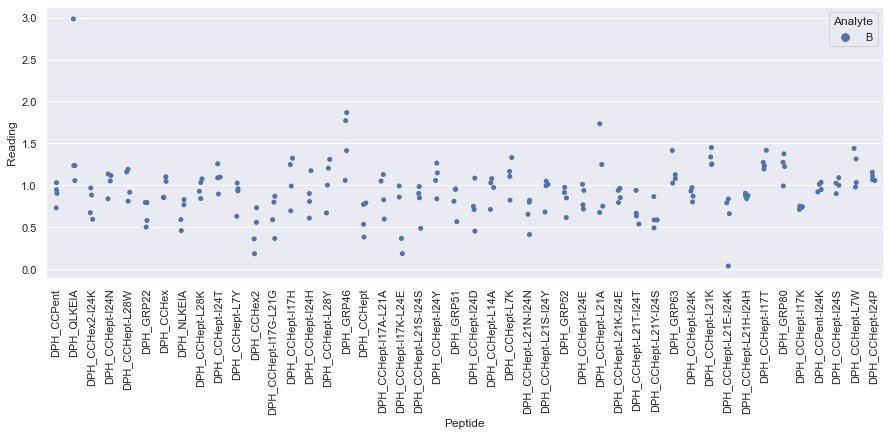

Drawing scatter plot of data spread for D_repeat_5 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

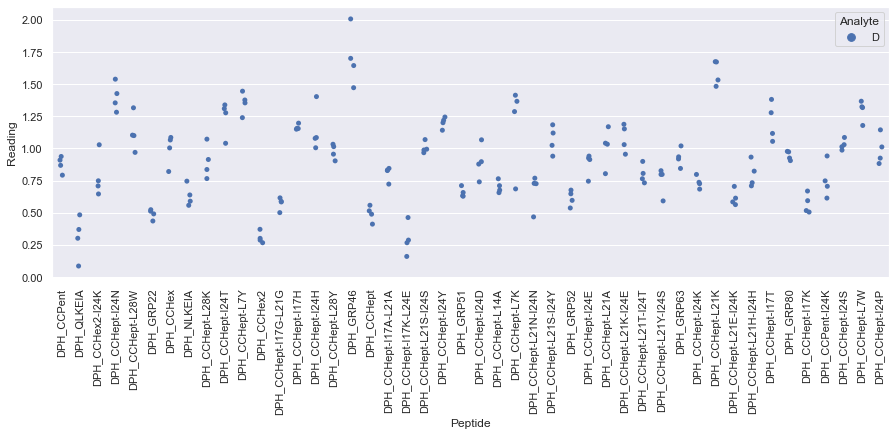

Drawing scatter plot of data spread for N_repeat_5 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

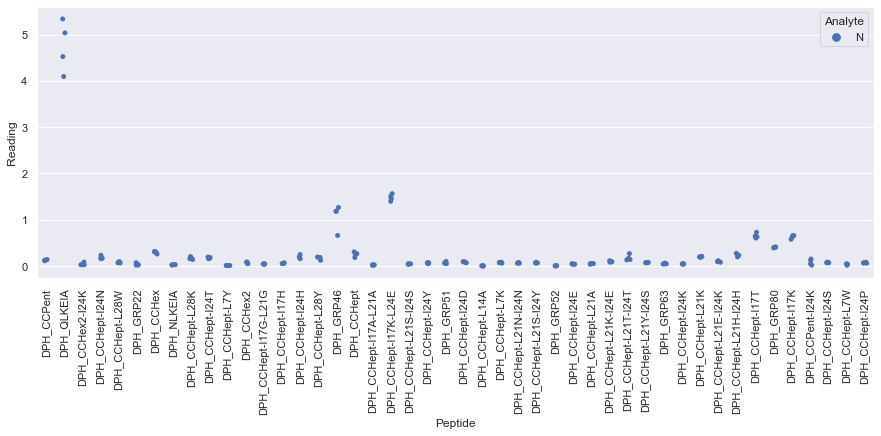

Drawing scatter plot of data spread for O_repeat_5 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

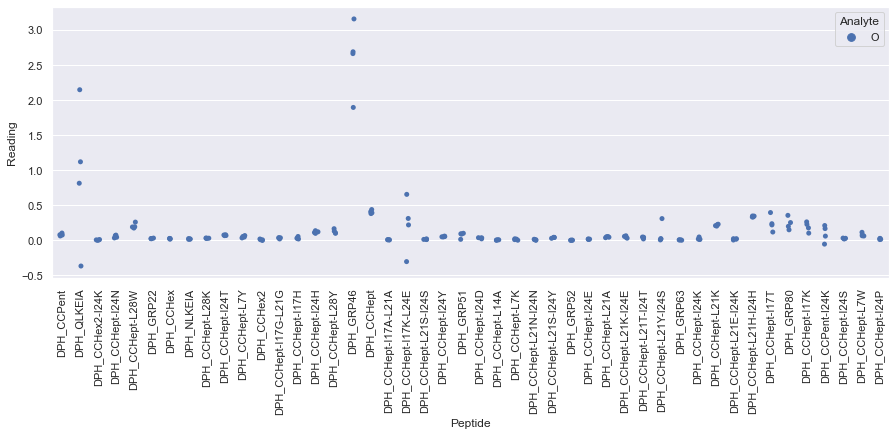

Drawing scatter plot of data spread for P_repeat_5 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

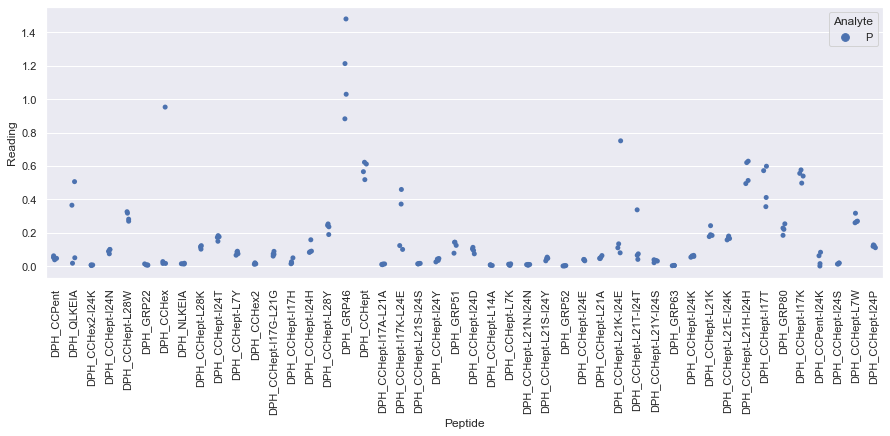

Drawing scatter plot of data spread for B_repeat_6 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

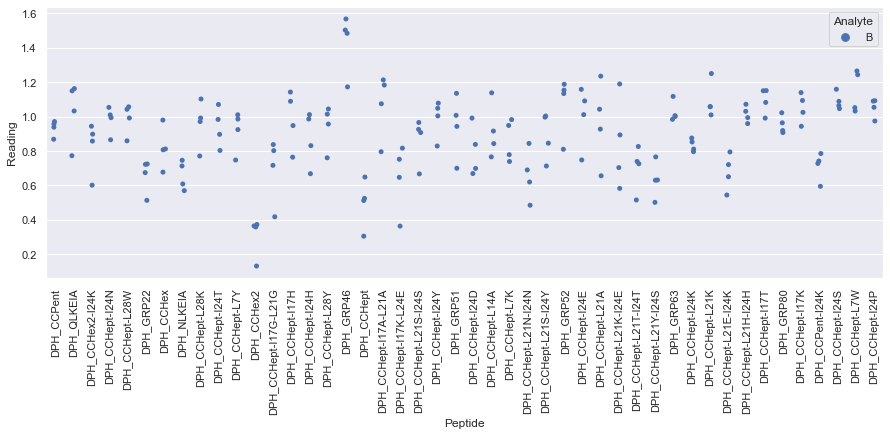

Drawing scatter plot of data spread for D_repeat_6 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

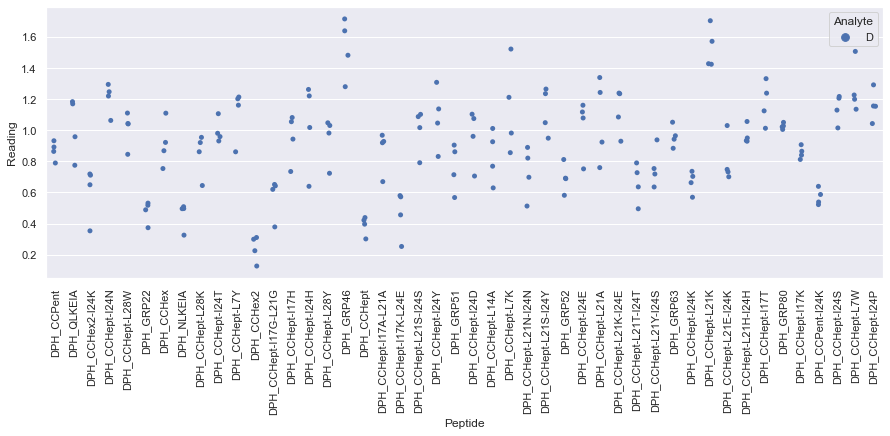

Drawing scatter plot of data spread for N_repeat_6 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

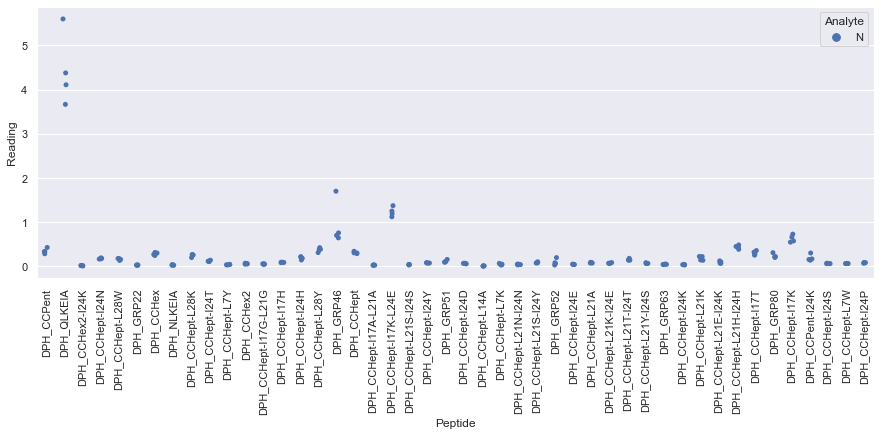

 WARNING - median fluorescence of (O + DPH_CCHept-L14A + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_6.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (O + DPH_GRP52 + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_6.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (O + DPH_CCPent-I24K + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_6.xlsx. Analysis will continue but please CHECK YOUR DATA. 
Drawing scatter plot of data spread for O_repeat_6 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

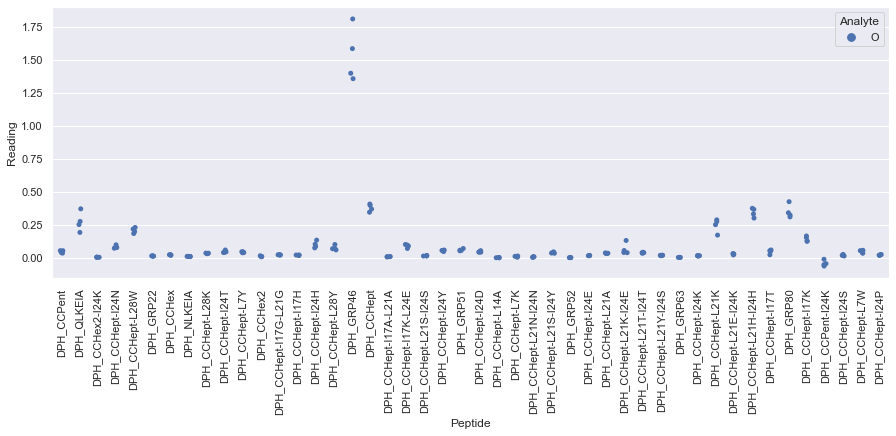

Drawing scatter plot of data spread for P_repeat_6 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

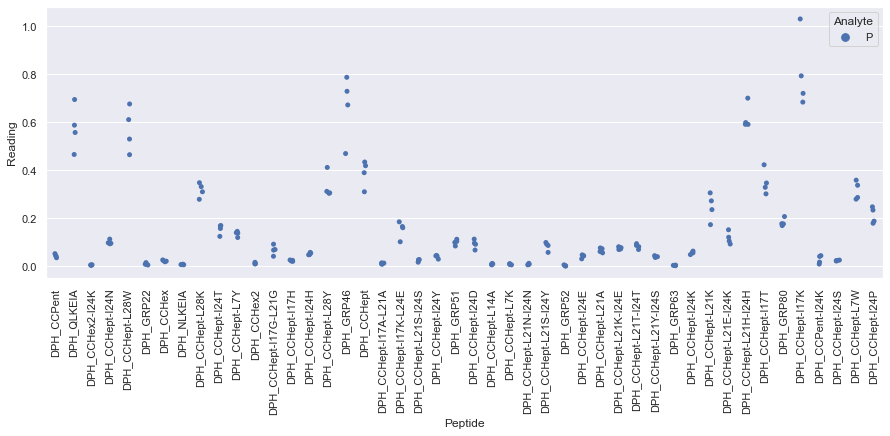

Drawing scatter plot of data spread for B_repeat_7 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

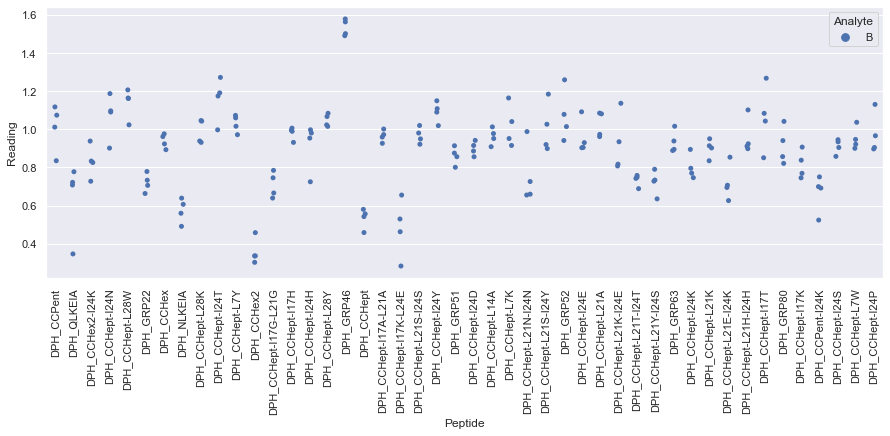

Drawing scatter plot of data spread for D_repeat_7 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

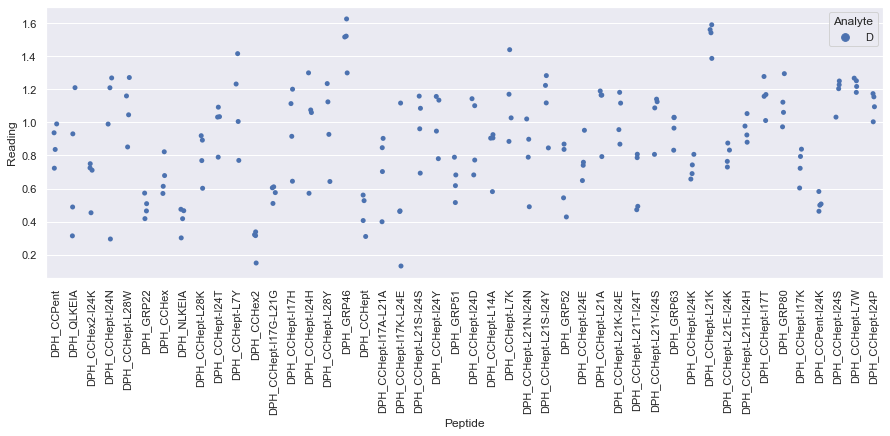

Drawing scatter plot of data spread for N_repeat_7 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

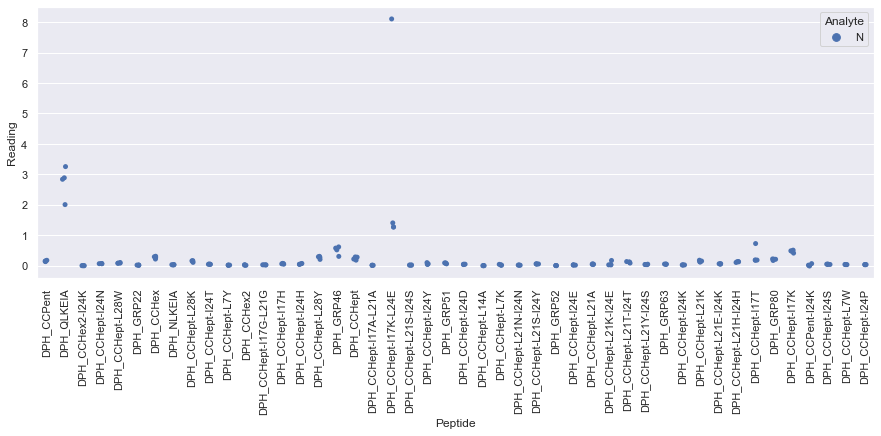

 WARNING - median fluorescence of (O + DPH_CCHex2-I24K + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_7.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (O + DPH_CCHept-L14A + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_7.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (O + DPH_GRP52 + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_7.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (O + DPH_CCPent-I24K + fluorophore) is less than fluorescence of (O +

<Figure size 720x720 with 0 Axes>

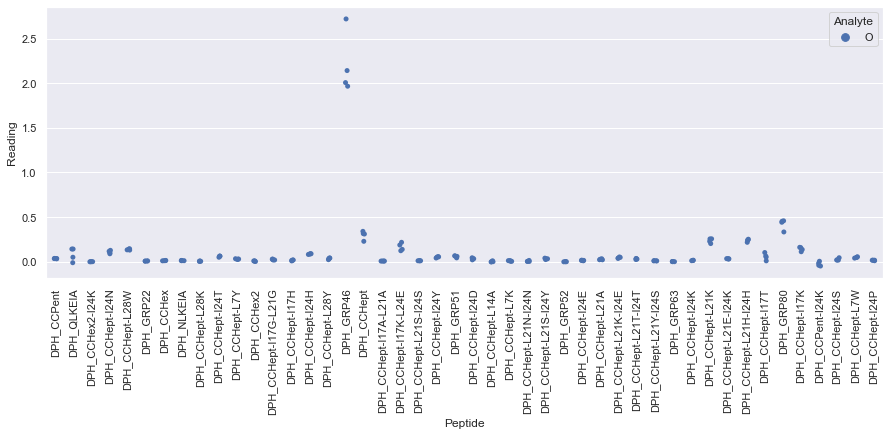

Drawing scatter plot of data spread for P_repeat_7 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

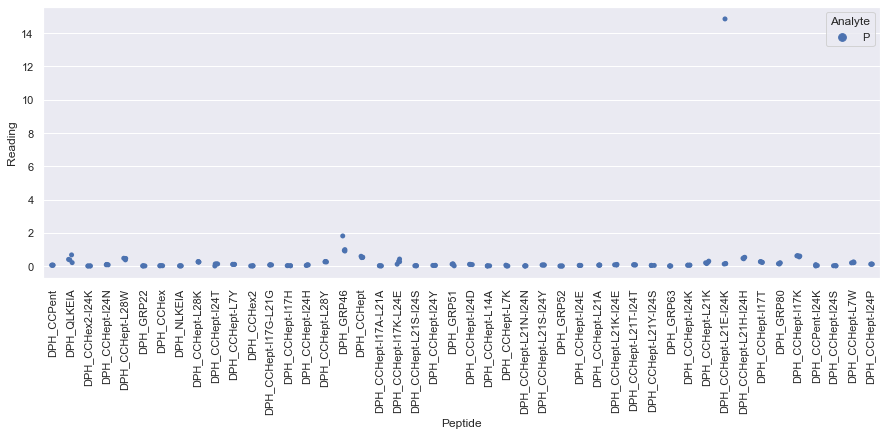

Drawing scatter plot of data spread for B_repeat_8 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

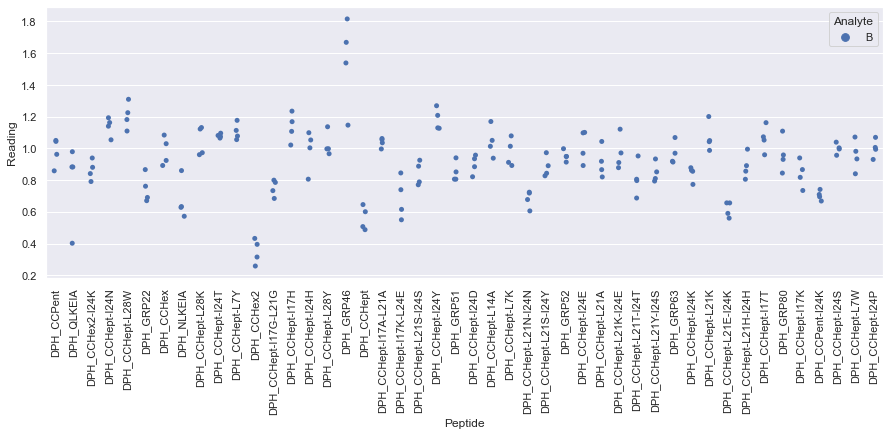

Drawing scatter plot of data spread for D_repeat_8 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

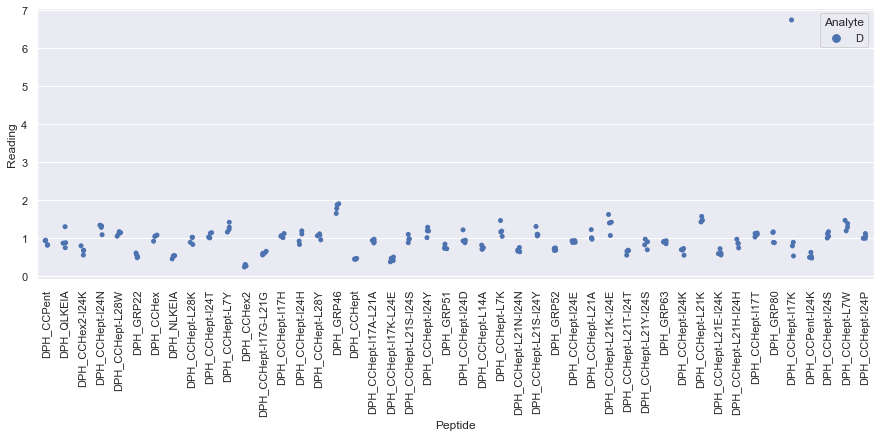

Drawing scatter plot of data spread for N_repeat_8 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

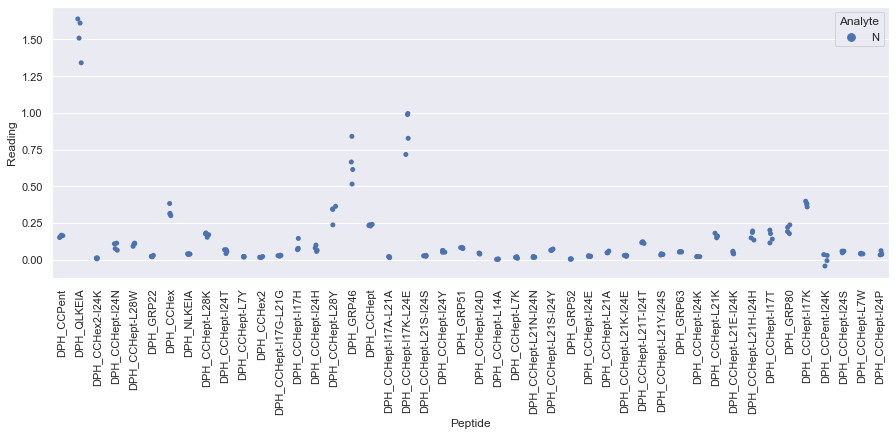

Drawing scatter plot of data spread for O_repeat_8 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

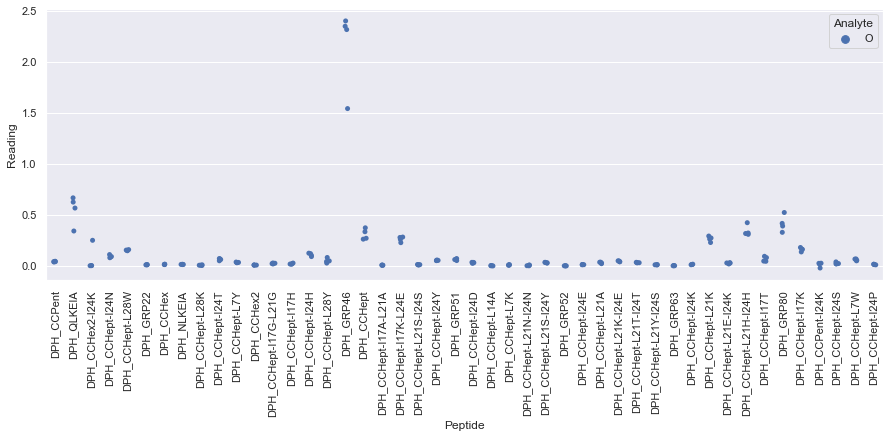

Drawing scatter plot of data spread for P_repeat_8 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

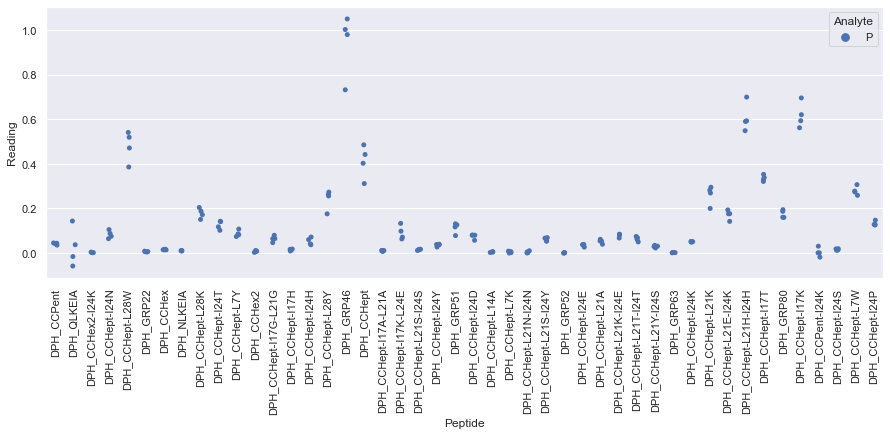

Drawing scatter plot of data spread for B_repeat_9 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

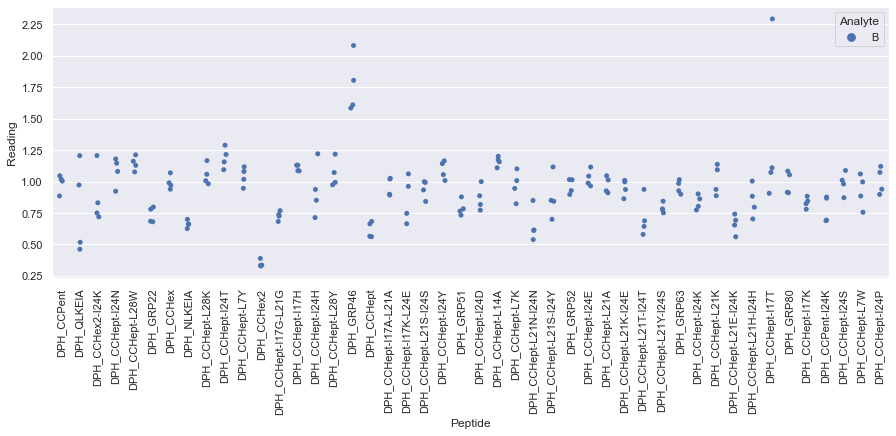

Drawing scatter plot of data spread for D_repeat_9 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

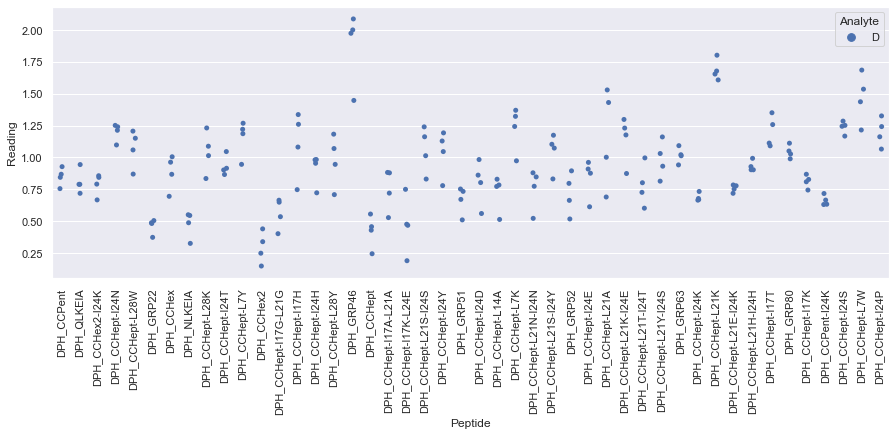

Drawing scatter plot of data spread for N_repeat_9 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

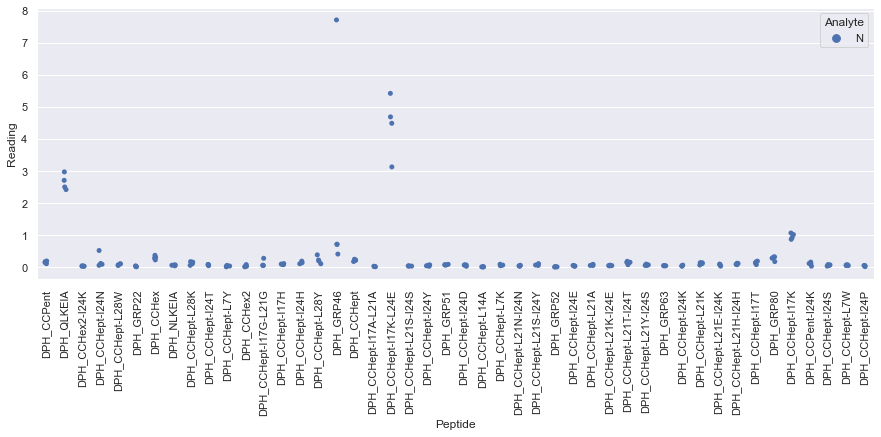

Drawing scatter plot of data spread for O_repeat_9 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

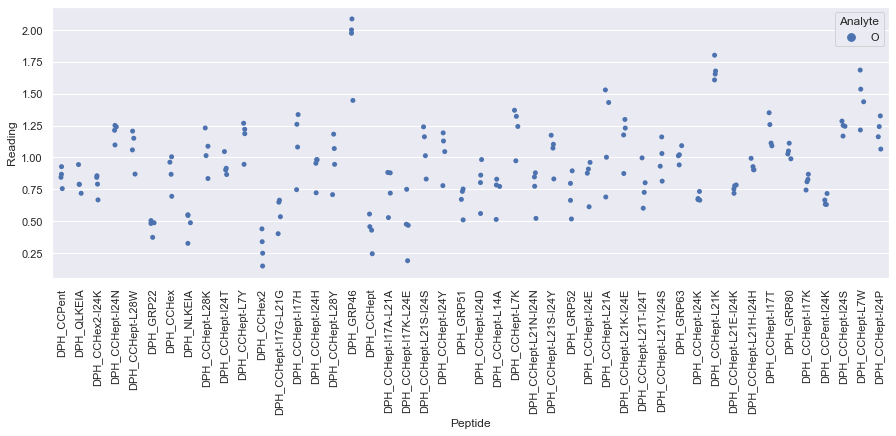

 WARNING - median fluorescence of (P + DPH_QLKEIA + fluorophore) is less than fluorescence of (P + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_9.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (P + DPH_CCHex2-I24K + fluorophore) is less than fluorescence of (P + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_9.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (P + DPH_CCHex2 + fluorophore) is less than fluorescence of (P + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_9.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (P + DPH_CCHept-I17K-L24E + fluorophore) is less than fluorescence of (P 

<Figure size 720x720 with 0 Axes>

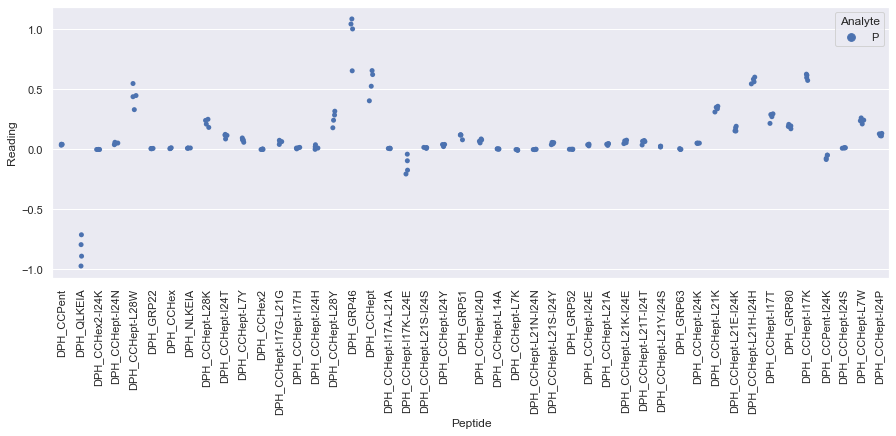

Drawing scatter plot of data spread for B_repeat_10 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

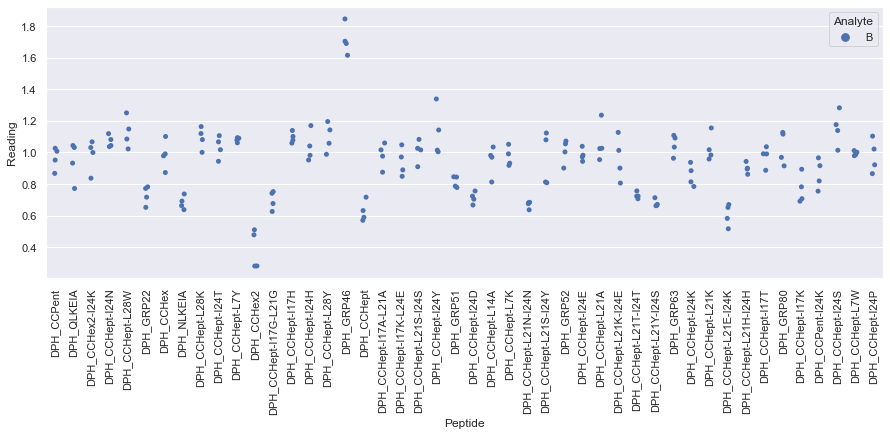

Drawing scatter plot of data spread for D_repeat_10 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

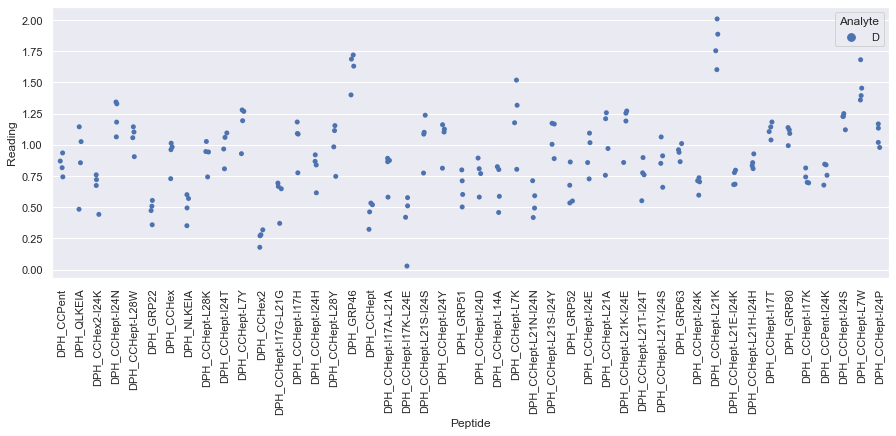

Drawing scatter plot of data spread for N_repeat_10 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

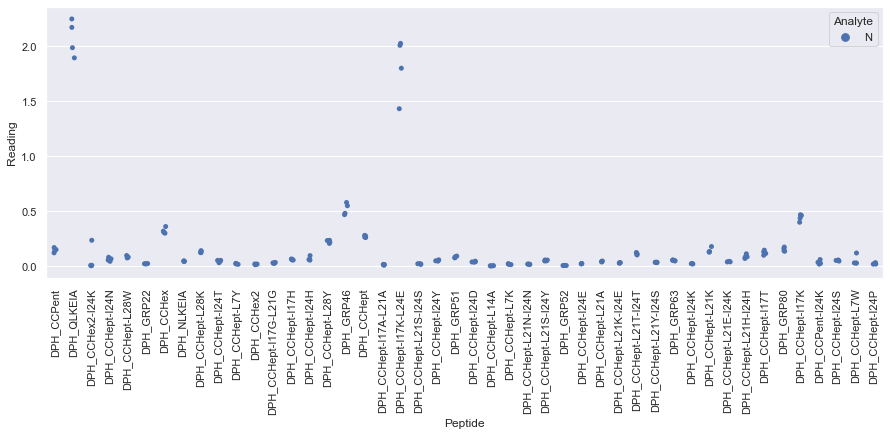

 WARNING - median fluorescence of (O + DPH_GRP52 + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_10.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (O + DPH_CCPent-I24K + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_10.xlsx. Analysis will continue but please CHECK YOUR DATA. 
Drawing scatter plot of data spread for O_repeat_10 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

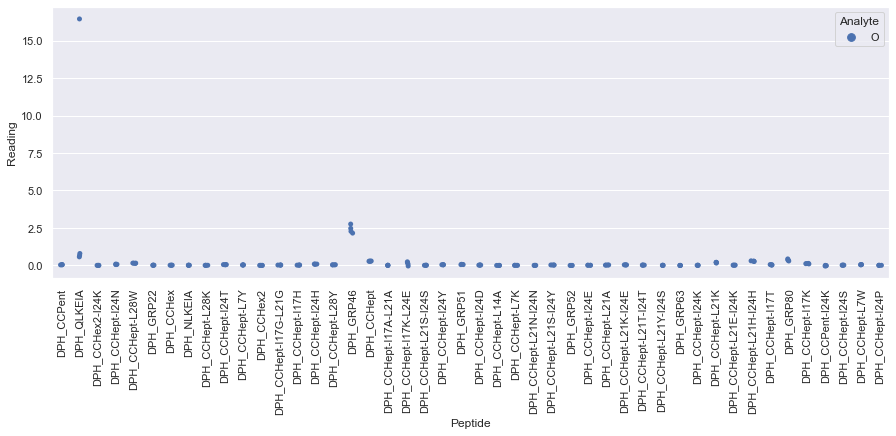

Drawing scatter plot of data spread for P_repeat_10 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

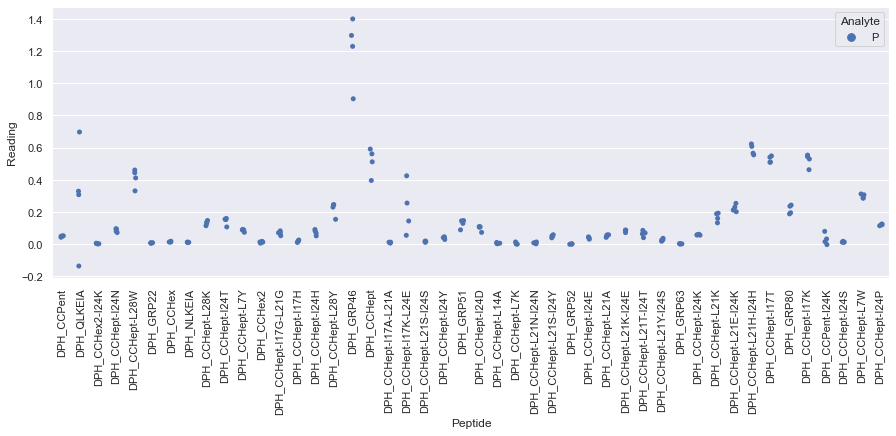



Outliers on the same plate:

/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_1.xlsx: blank, DPH_CCHept-L28Y, 14387.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_1.xlsx: blank, DPH_CCHept-I17K-L24E, 858.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_1.xlsx: B, DPH_CCHept-L7Y, 5924.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_1.xlsx: B, DPH_GRP51, 17187.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_1.xlsx: blank, DPH_GRP52, 48839.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_1.xlsx: blank, DPH_CCHept-L21T-I24T, 8211.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatte

In [6]:
fa_fluor_data.xlsx_to_scaled_df(
    no_pep={'DPH': 'No Pep'}, scale_method='analyte_fluorophore', draw_plot=True, plot_dir_name='FA'
)

At a glance:
- Plate O_repeat_9.xlsx looks anomalous - looks like there might have been a mix up between samples, as the signal looks more like that of a solution of D (or possibly B) rather than O. Repeat plate parsing excluding this plate. There is also an unusually high reading on P_repeat_7.xlsx, but this will be discarded when averaging the data by calculating the median, and the other readings on the plate look OK. Otherwise, there are no other plates that by eye are obviously anomalous.
- The fluorescence of peptides GRP35, QLKEIA and CCHept-I17K-L24E in the presence of DPH is very similar to that of DPH on its own (which is reassuring, given that this is a comparison of the interaction of the fluorophore with the peptide in the absence of analyte).
- The fluorescence of GRP46 with DPH is slightly higher as compared to these three peptides, but still pretty low (like a few other peptides in the dataset). What marks it out as unusual though is that the addition of the shorter-tailed FAs often causes the net fluorescence signal with this peptide to increase. So, in spite of the fact that this causes the resultant scaled readings to be large, this is not necessarily a problem provided that these readings are consistent (and in fact they could prove very useful in discriminating between the fatty acids). Will make an assessment based upon the variation observed aross repeats in the box plots below. 
- The FAs, especially those with longer tails and/or cis C=C bonds, cause a large decrease in DPH signal. Accordingly, sveral warnings are raised, because in many cases the analyte effectively completely displaces DPH from interacting with the peptide => the signal of (analyte + peptide + DPH) will be similar to that of (analyte + DPH). Hence in some cases (analyte + peptide + DPH) will be smaller than (analyte + DPH). These warnings can therefore be safely ignored.

Directory /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_analysis_large_array/FAs/FA_plate_parsing_plots/ already found in /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/array_sensing
Overwrite /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_analysis_large_array/FAs/FA_plate_parsing_plots/?
y
Successfully removed O_repeat_9.xlsx
Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_1.xlsx
Drawing scatter plot of data spread for B_repeat_1 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

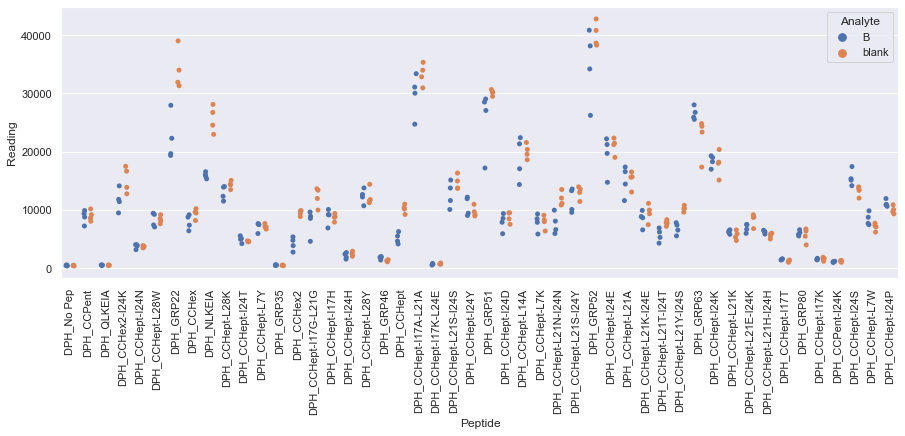

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_1.xlsx
Drawing scatter plot of data spread for D_repeat_1 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

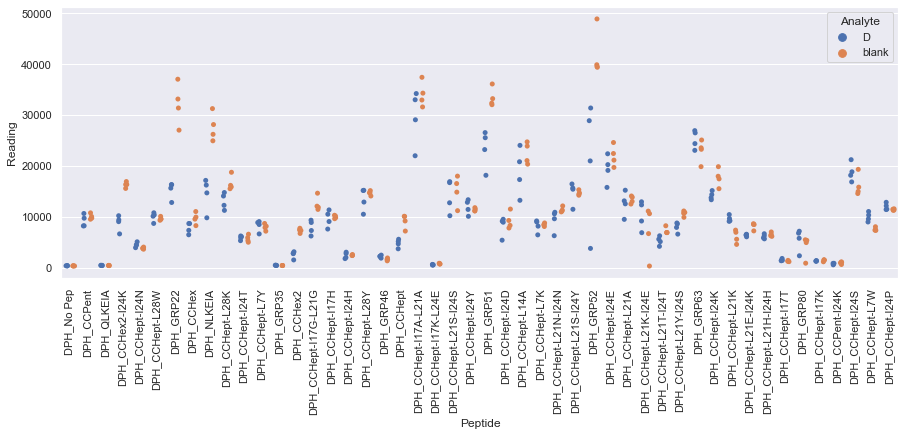

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_1.xlsx
Drawing scatter plot of data spread for N_repeat_1 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

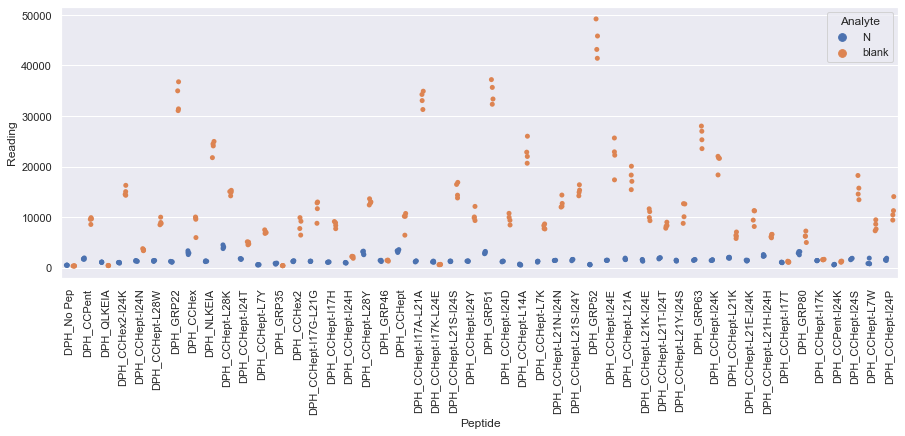

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_1.xlsx
Drawing scatter plot of data spread for O_repeat_1 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

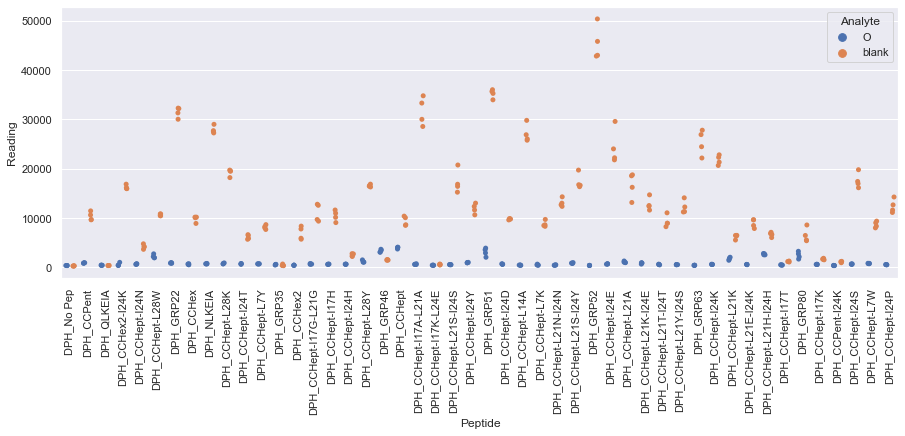

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_1.xlsx
Drawing scatter plot of data spread for P_repeat_1 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

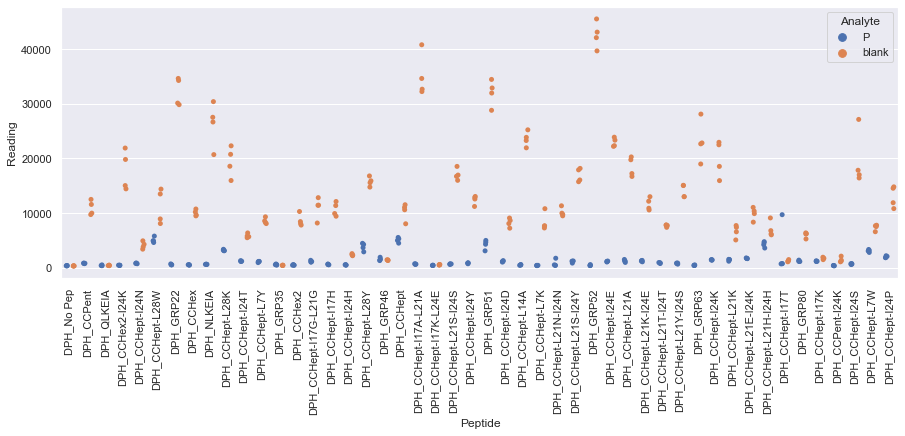

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_2.xlsx
Drawing scatter plot of data spread for B_repeat_2 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

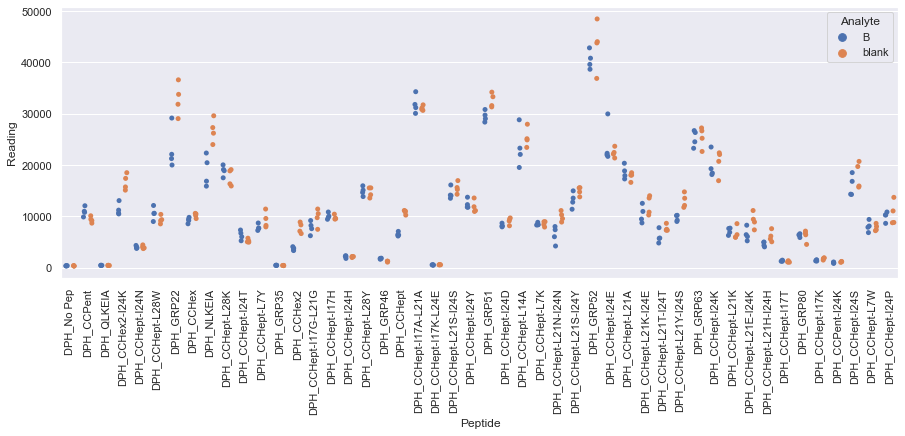

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_2.xlsx
Drawing scatter plot of data spread for D_repeat_2 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

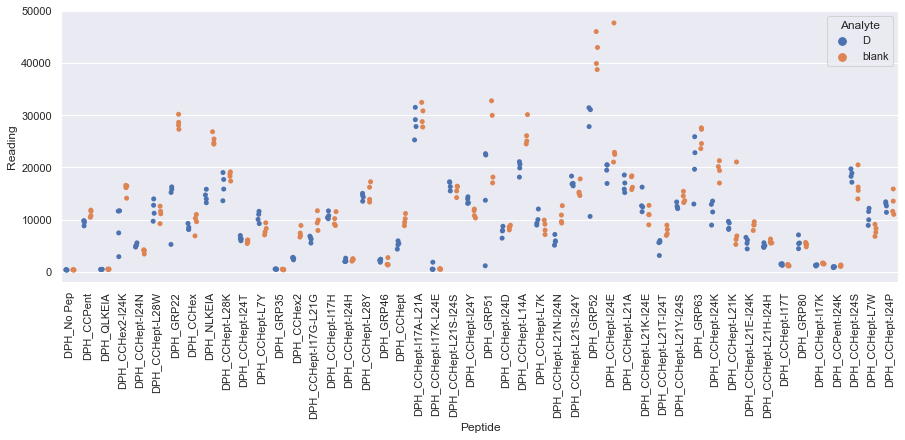

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_2.xlsx
Drawing scatter plot of data spread for N_repeat_2 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

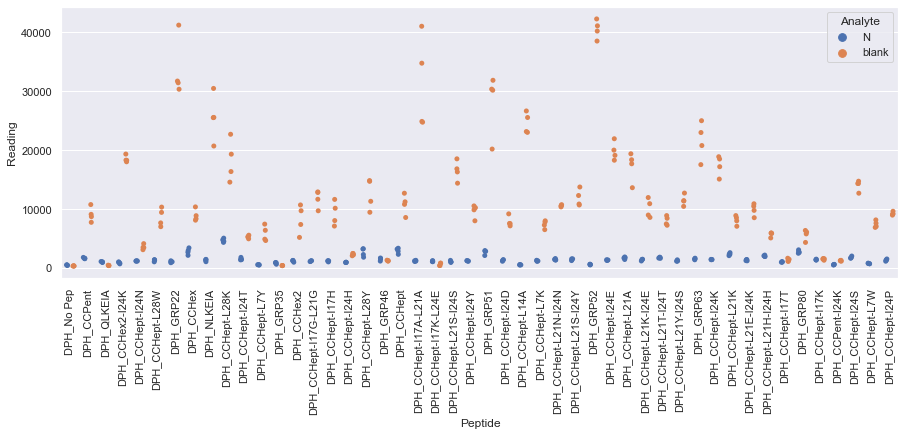

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_2.xlsx
Drawing scatter plot of data spread for O_repeat_2 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

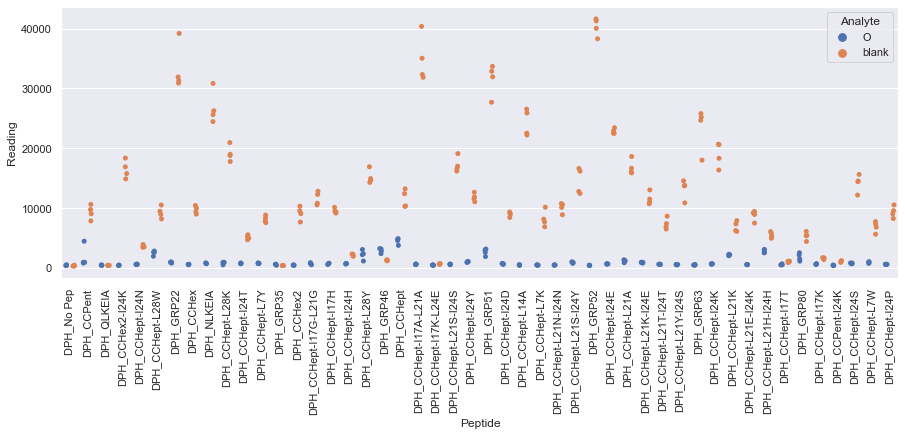

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_2.xlsx
Drawing scatter plot of data spread for P_repeat_2 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

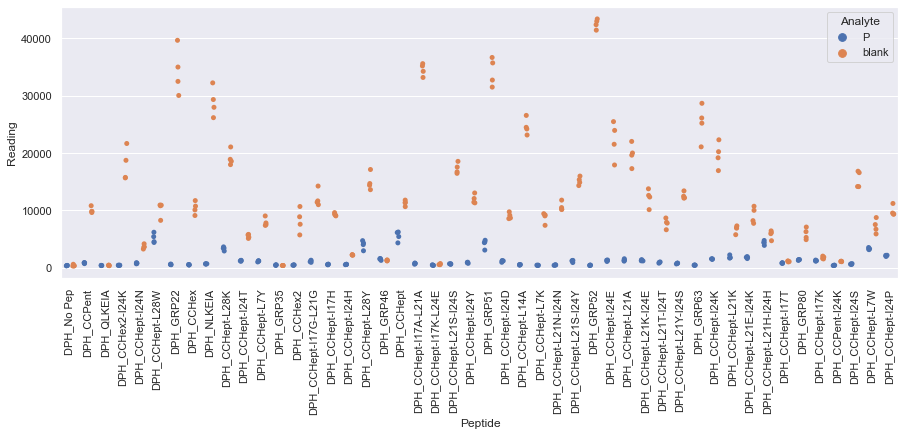

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_3.xlsx
Drawing scatter plot of data spread for B_repeat_3 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

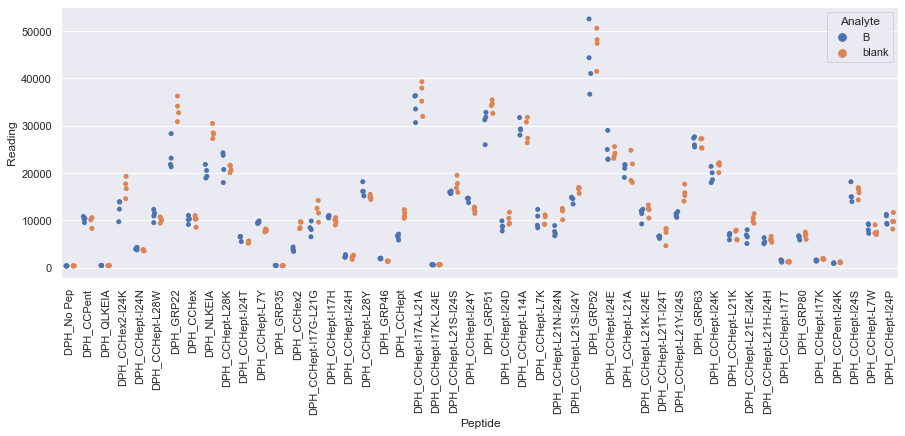

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_3.xlsx
Drawing scatter plot of data spread for D_repeat_3 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

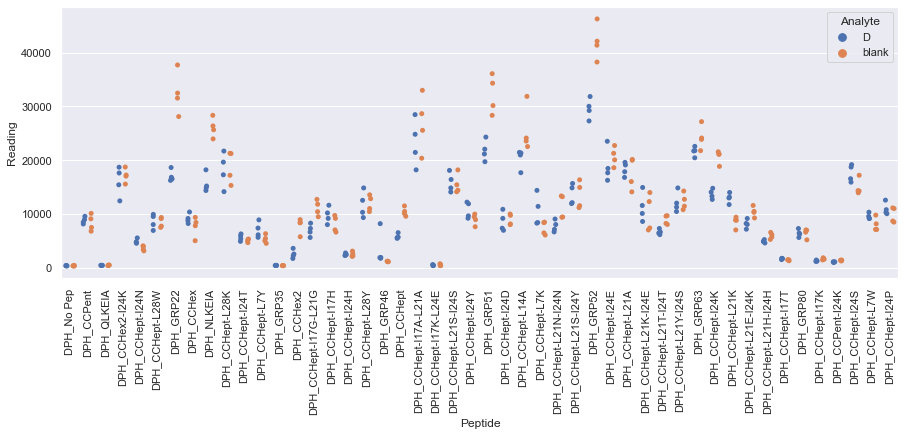

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_3.xlsx
Drawing scatter plot of data spread for N_repeat_3 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

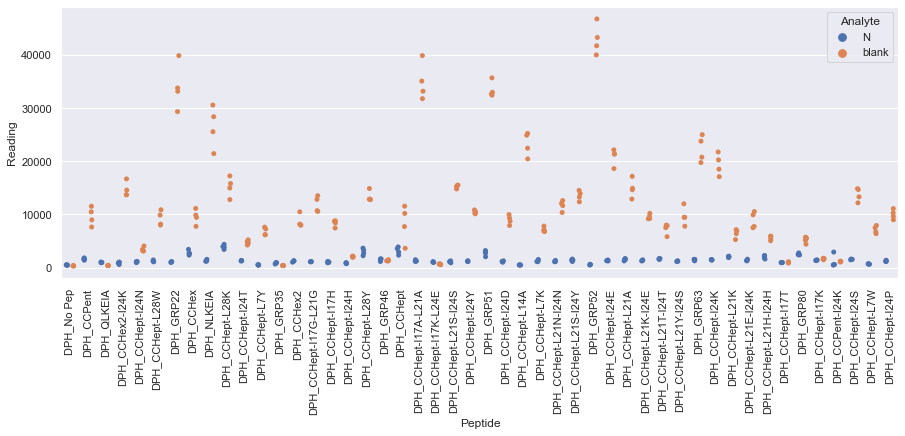

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_3.xlsx
Drawing scatter plot of data spread for O_repeat_3 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

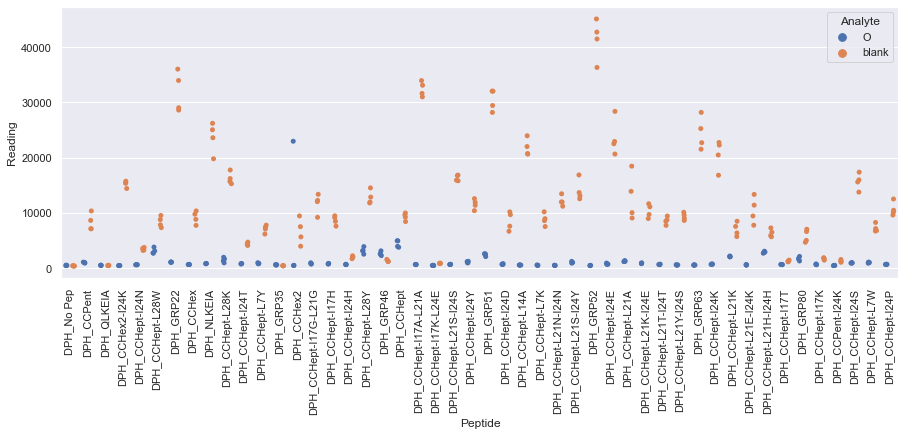

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_3.xlsx
Drawing scatter plot of data spread for P_repeat_3 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

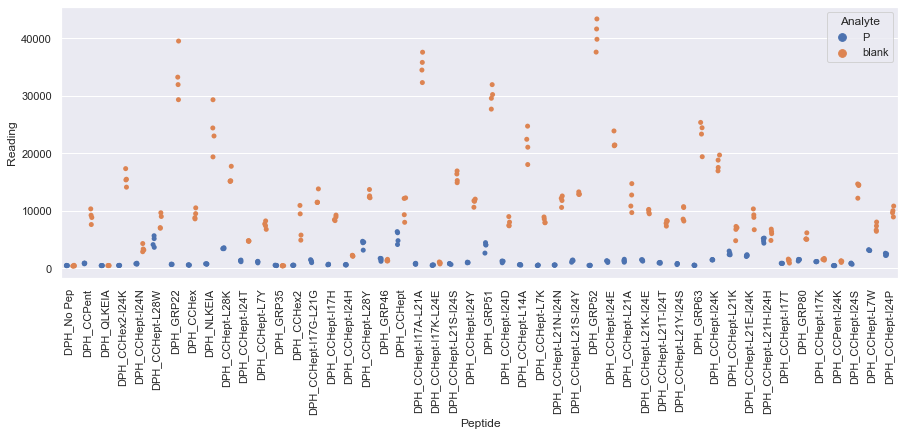

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_4.xlsx
Drawing scatter plot of data spread for B_repeat_4 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

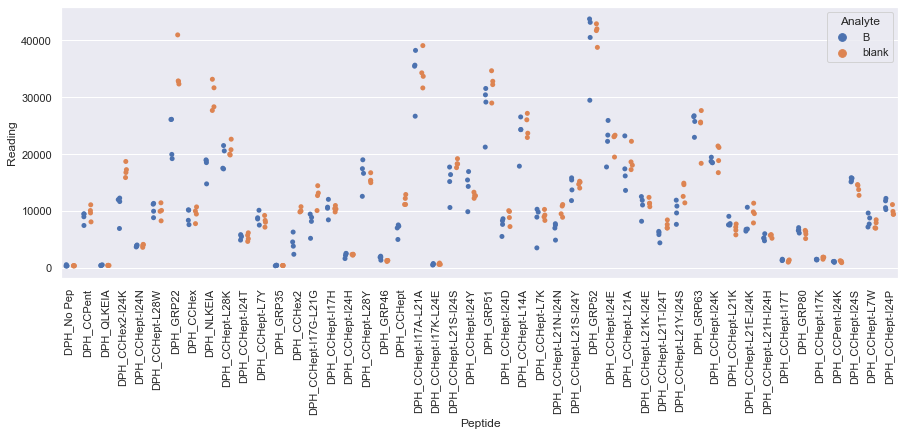

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_4.xlsx
Drawing scatter plot of data spread for D_repeat_4 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

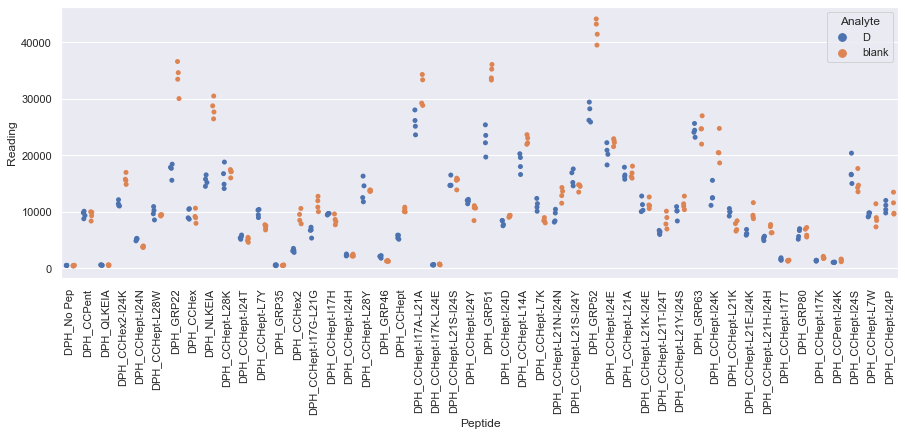

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_4.xlsx
Drawing scatter plot of data spread for N_repeat_4 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

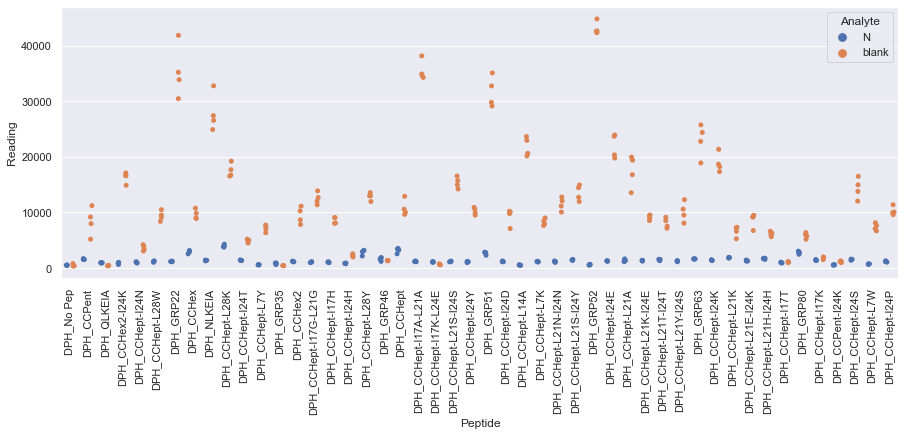

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_4.xlsx
Drawing scatter plot of data spread for O_repeat_4 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

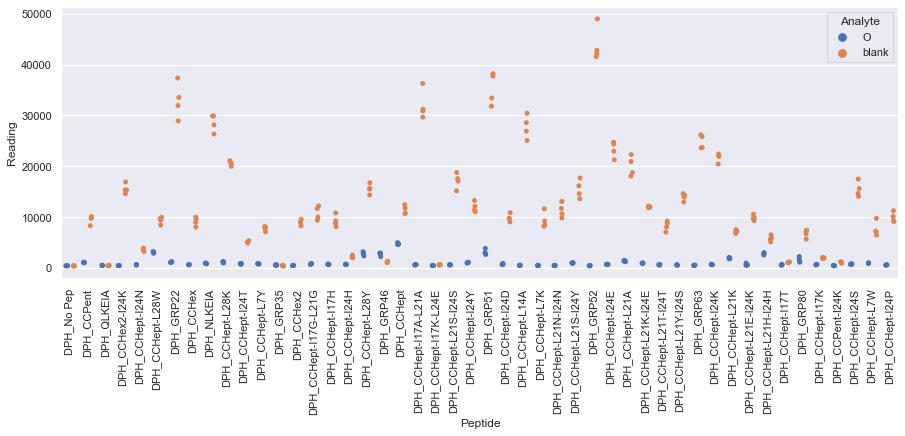

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_4.xlsx
Drawing scatter plot of data spread for P_repeat_4 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

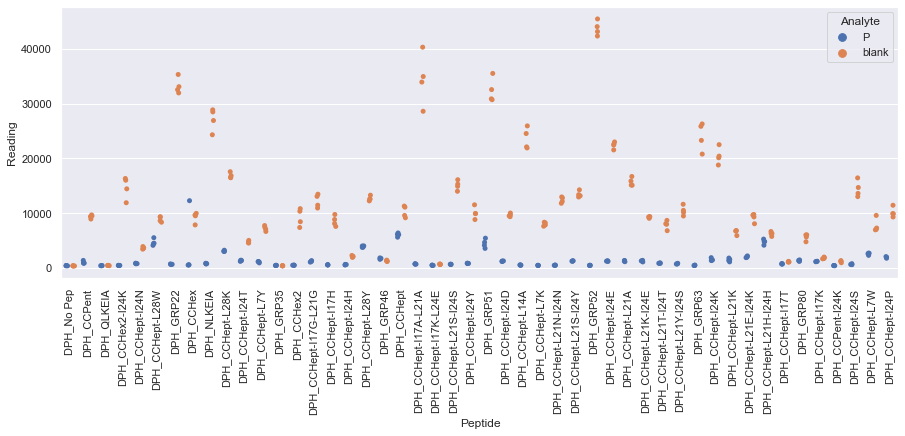

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_5.xlsx
Drawing scatter plot of data spread for B_repeat_5 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

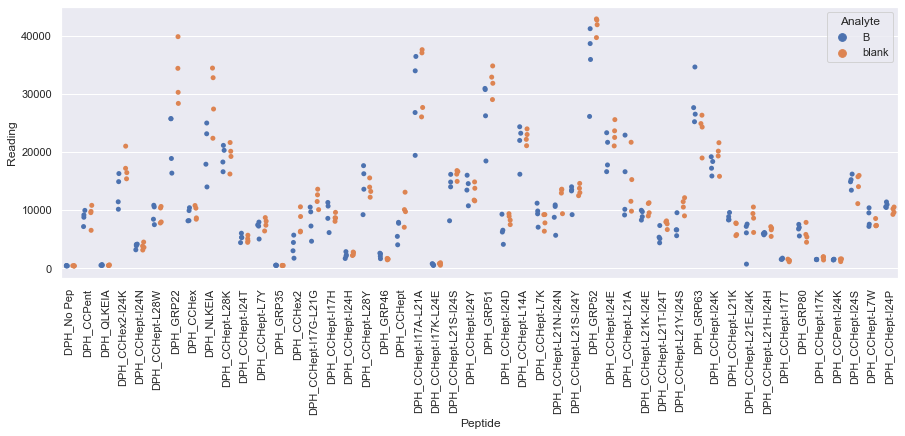

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_5.xlsx
Drawing scatter plot of data spread for D_repeat_5 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

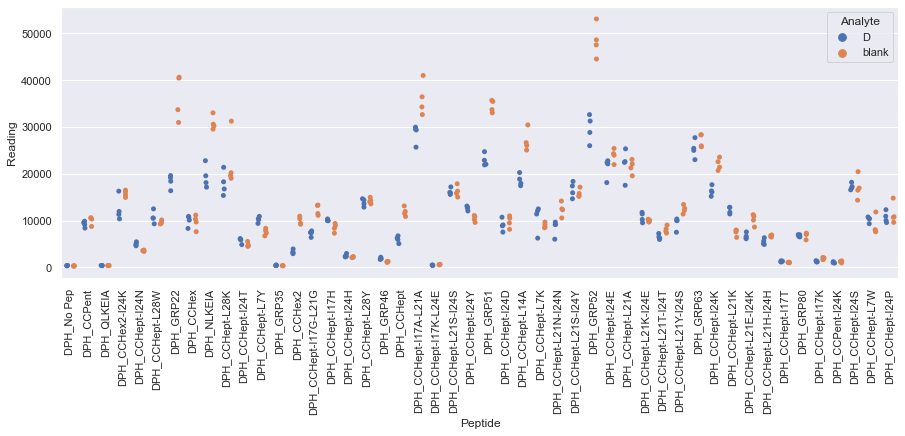

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_5.xlsx
Drawing scatter plot of data spread for N_repeat_5 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

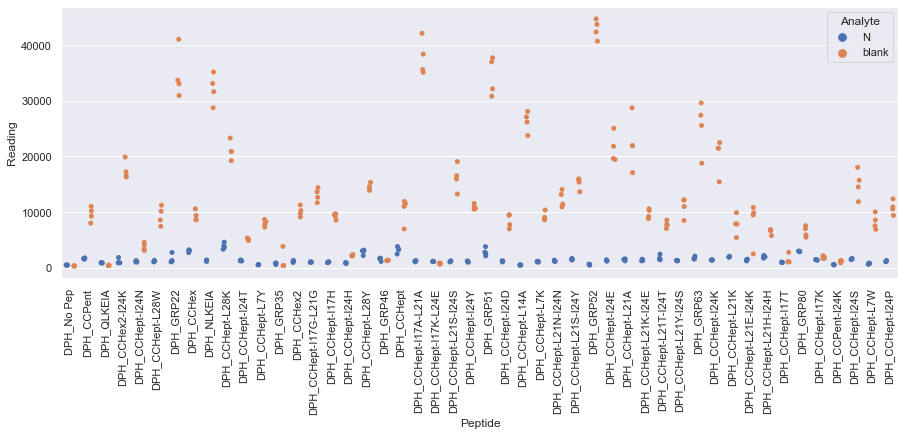

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_5.xlsx
Drawing scatter plot of data spread for O_repeat_5 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

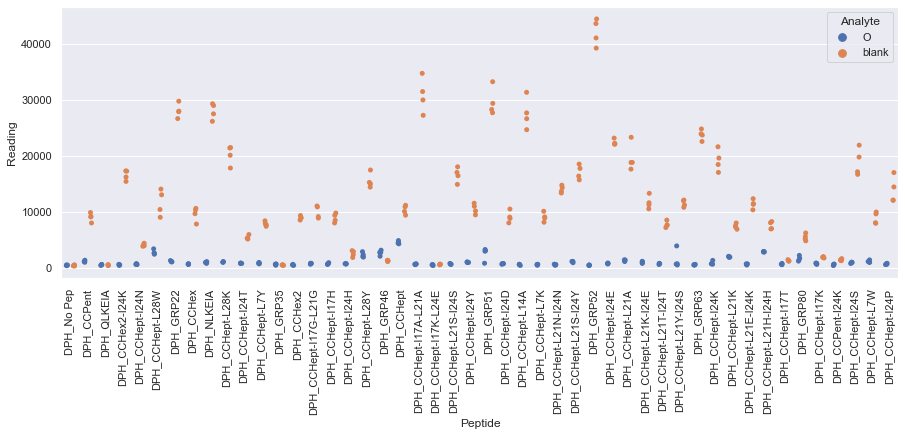

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_5.xlsx
Drawing scatter plot of data spread for P_repeat_5 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

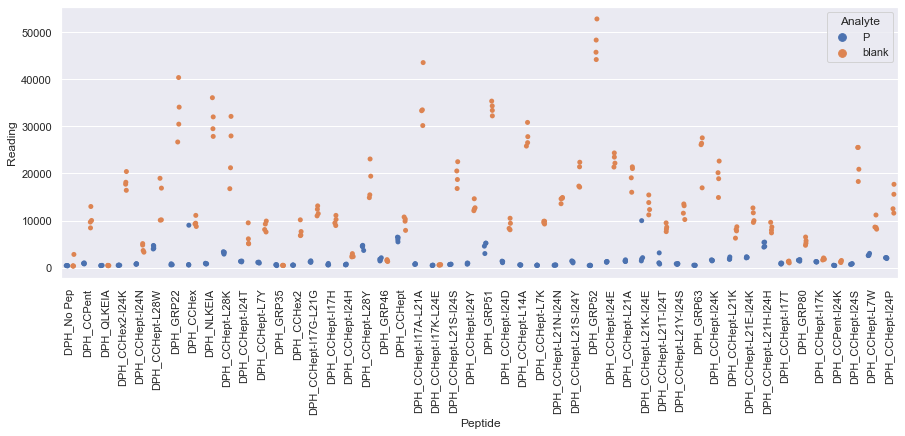

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_6.xlsx
Drawing scatter plot of data spread for B_repeat_6 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

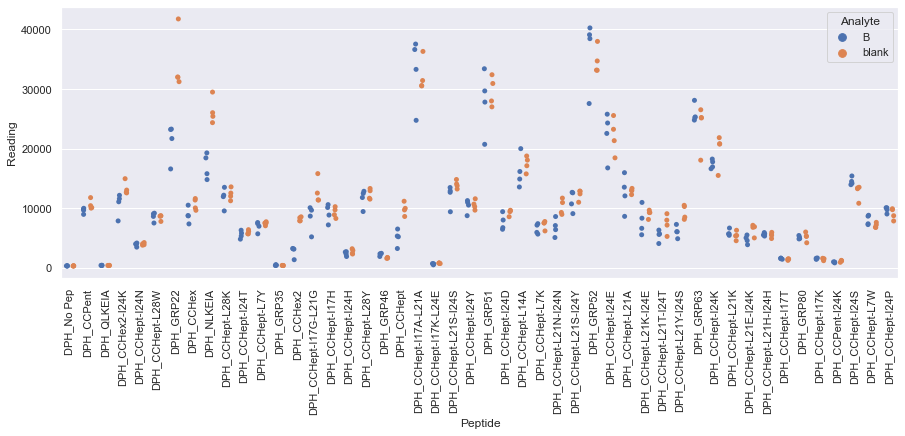

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_6.xlsx
Drawing scatter plot of data spread for D_repeat_6 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

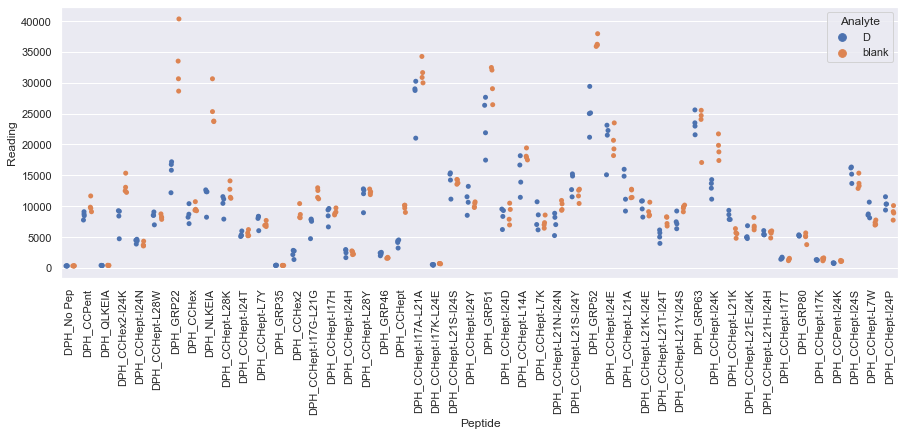

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_6.xlsx
Drawing scatter plot of data spread for N_repeat_6 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

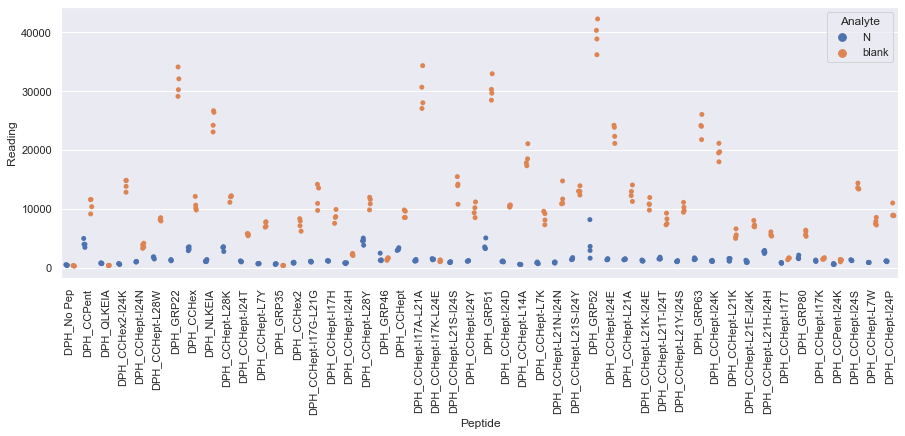

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_6.xlsx
Drawing scatter plot of data spread for O_repeat_6 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

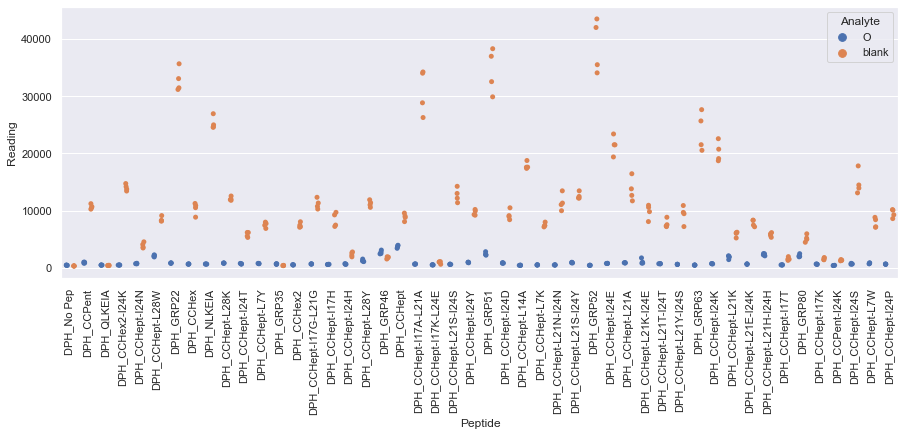

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_6.xlsx
Drawing scatter plot of data spread for P_repeat_6 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

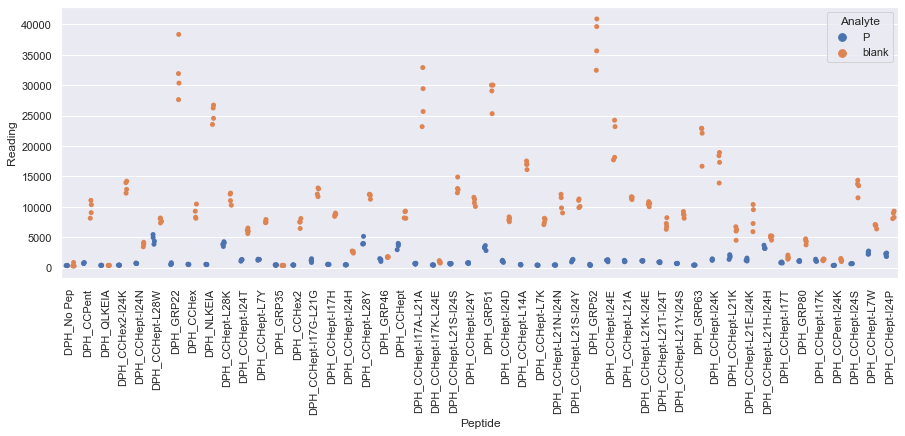

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_7.xlsx
Drawing scatter plot of data spread for B_repeat_7 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

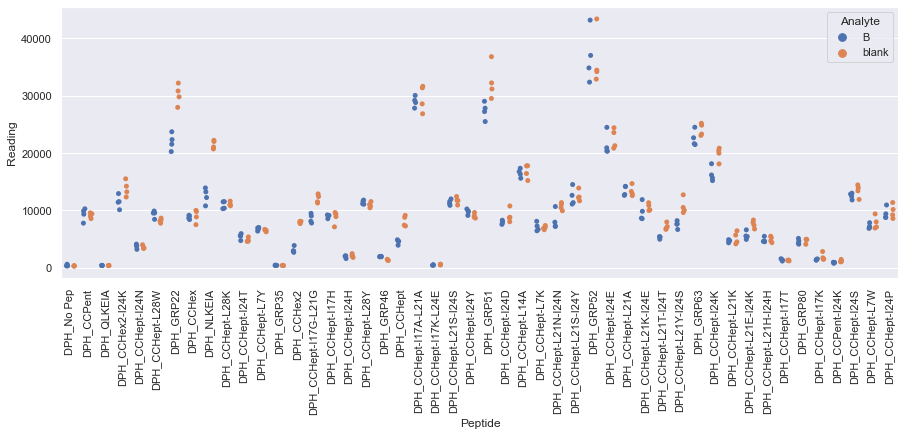

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_7.xlsx
Drawing scatter plot of data spread for D_repeat_7 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

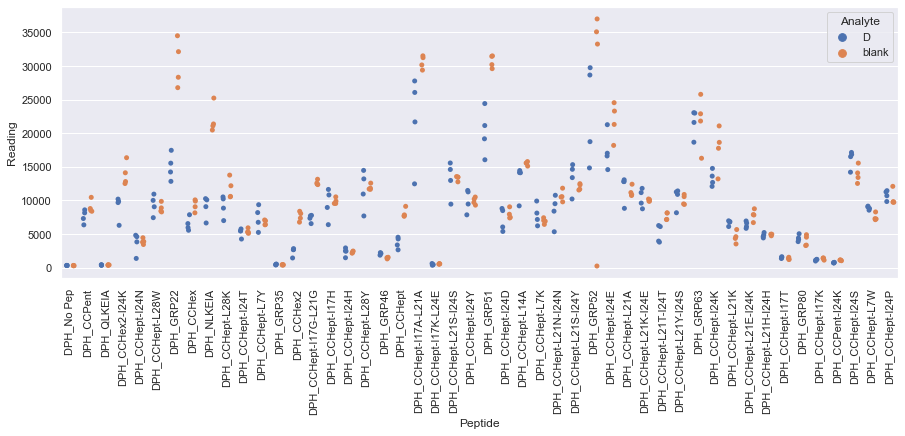

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_7.xlsx
Drawing scatter plot of data spread for N_repeat_7 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

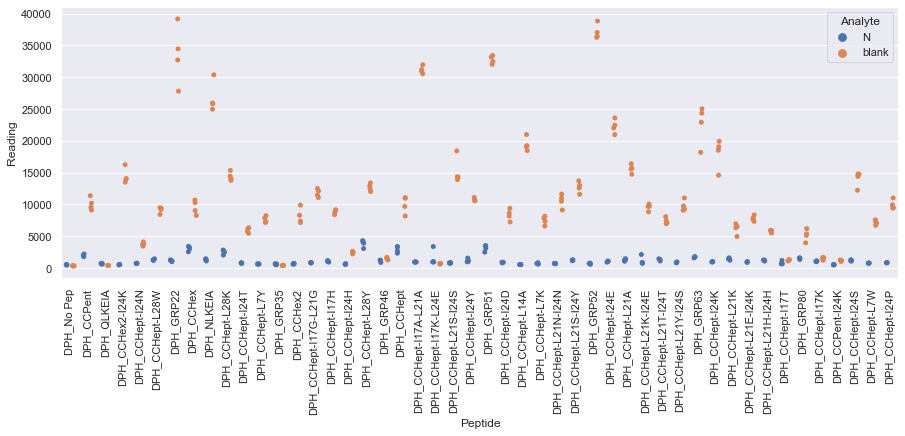

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_7.xlsx
Drawing scatter plot of data spread for O_repeat_7 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

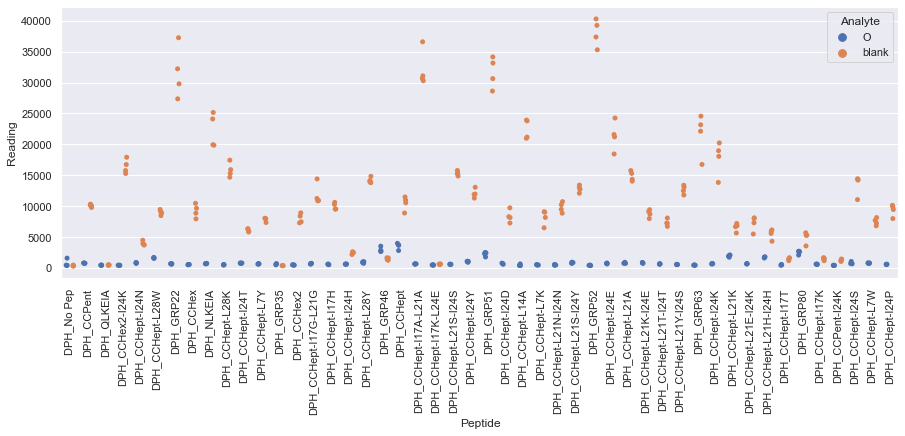

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_7.xlsx
Drawing scatter plot of data spread for P_repeat_7 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

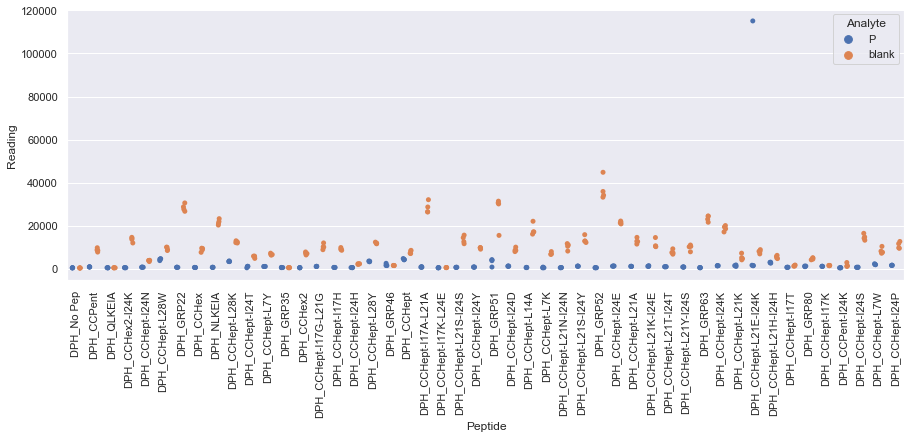

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_8.xlsx
Drawing scatter plot of data spread for B_repeat_8 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

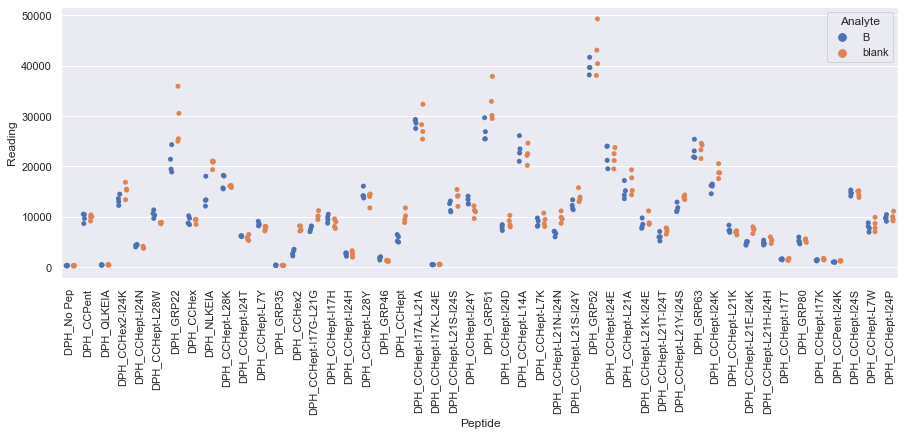

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_8.xlsx
Drawing scatter plot of data spread for D_repeat_8 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

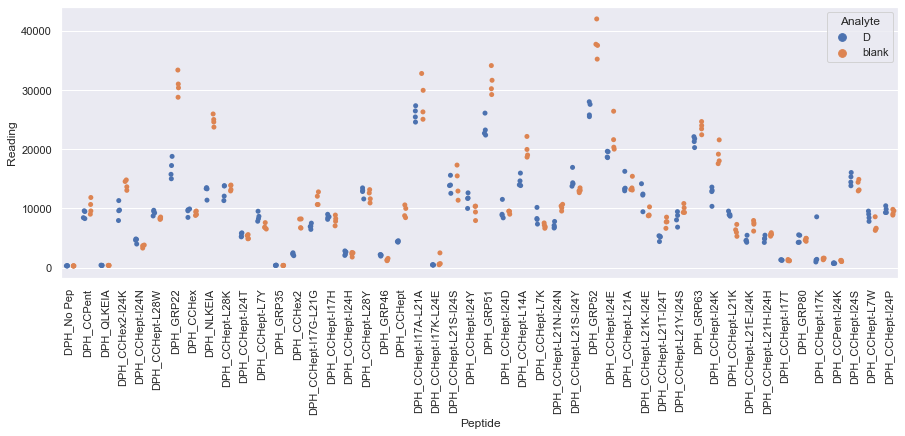

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_8.xlsx
Drawing scatter plot of data spread for N_repeat_8 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

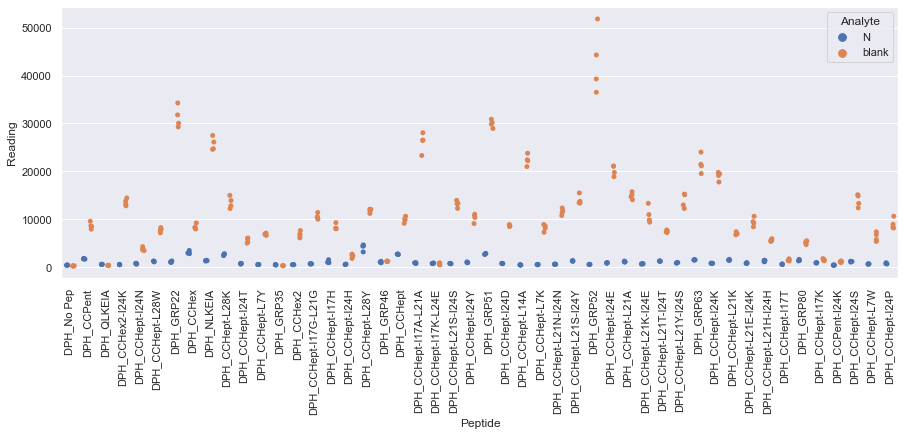

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_8.xlsx
Drawing scatter plot of data spread for O_repeat_8 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

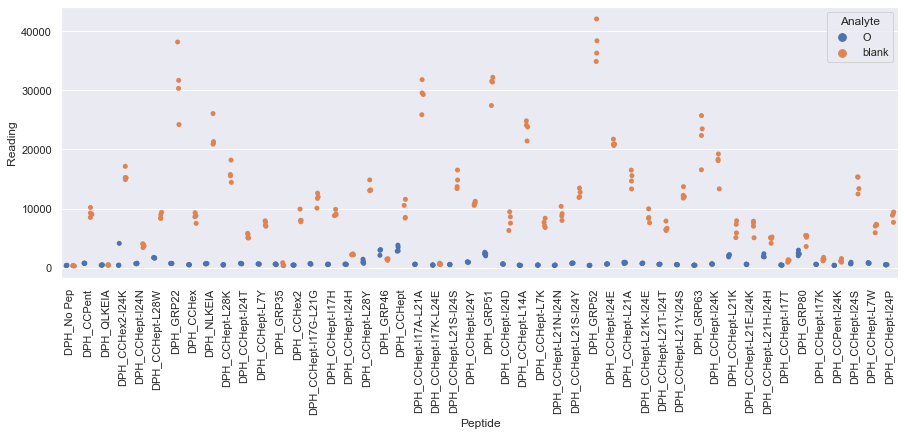

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_8.xlsx
Drawing scatter plot of data spread for P_repeat_8 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

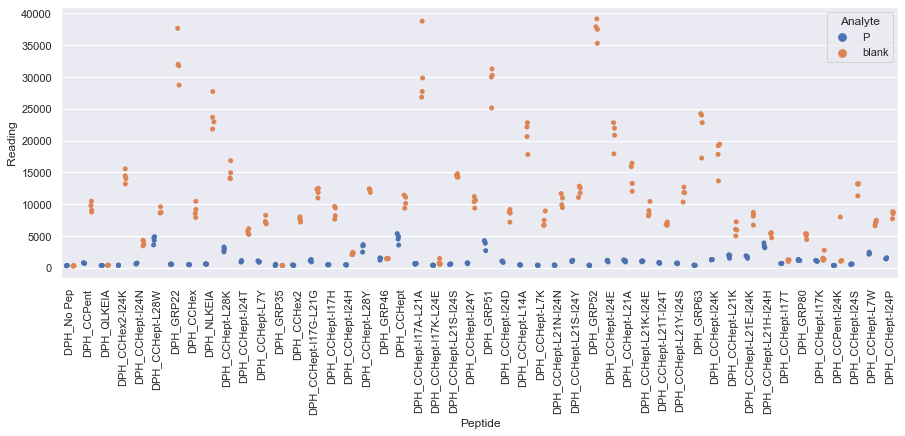

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_9.xlsx
Drawing scatter plot of data spread for B_repeat_9 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

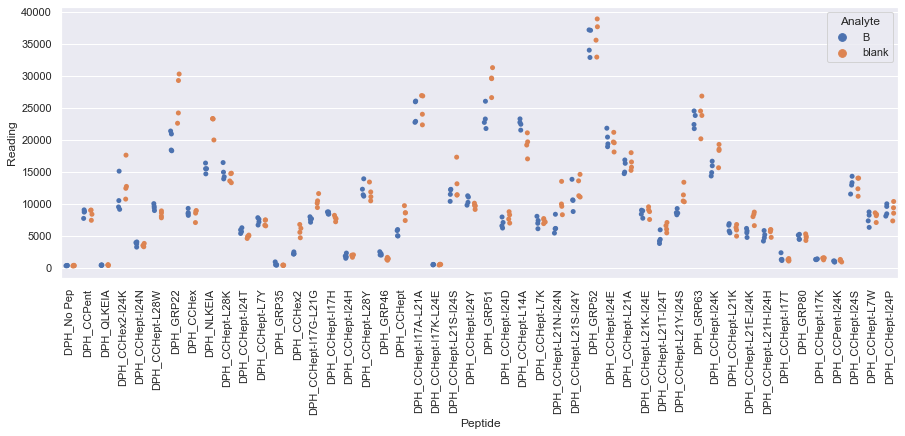

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_9.xlsx
Drawing scatter plot of data spread for D_repeat_9 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

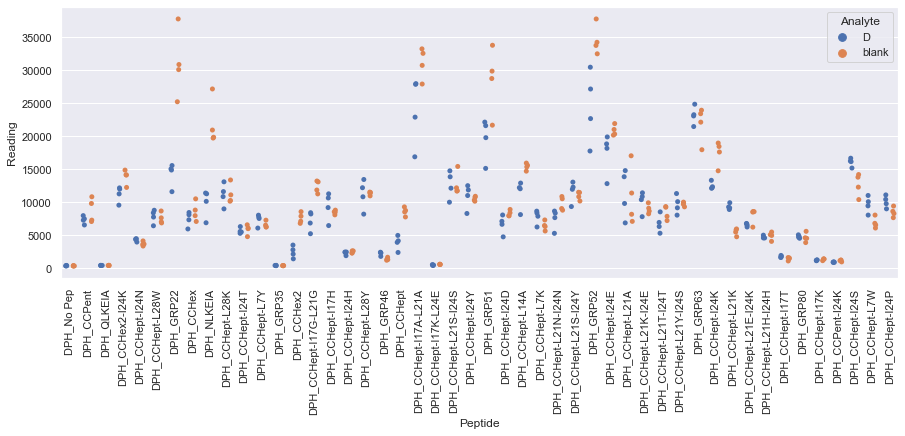

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_9.xlsx
Drawing scatter plot of data spread for N_repeat_9 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

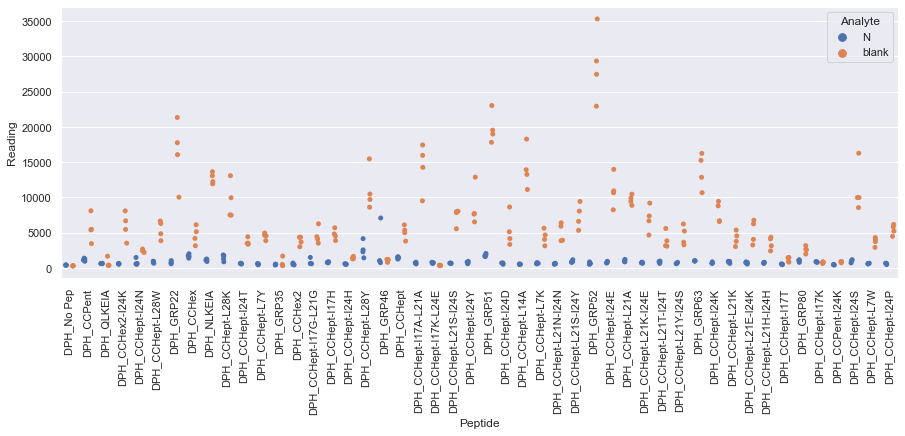

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_9.xlsx
Drawing scatter plot of data spread for P_repeat_9 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

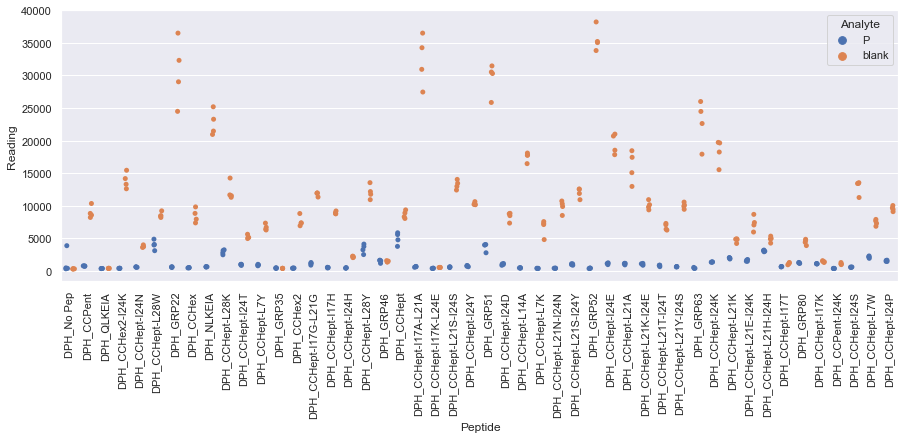

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_10.xlsx
Drawing scatter plot of data spread for B_repeat_10 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

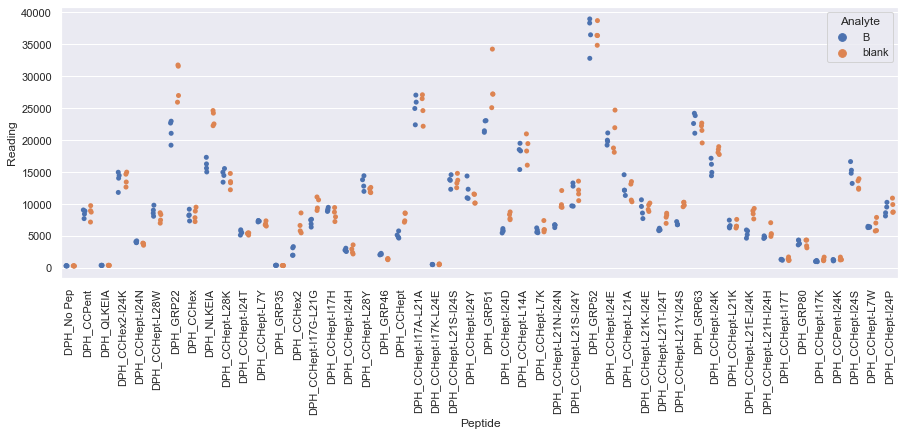

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_10.xlsx
Drawing scatter plot of data spread for D_repeat_10 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

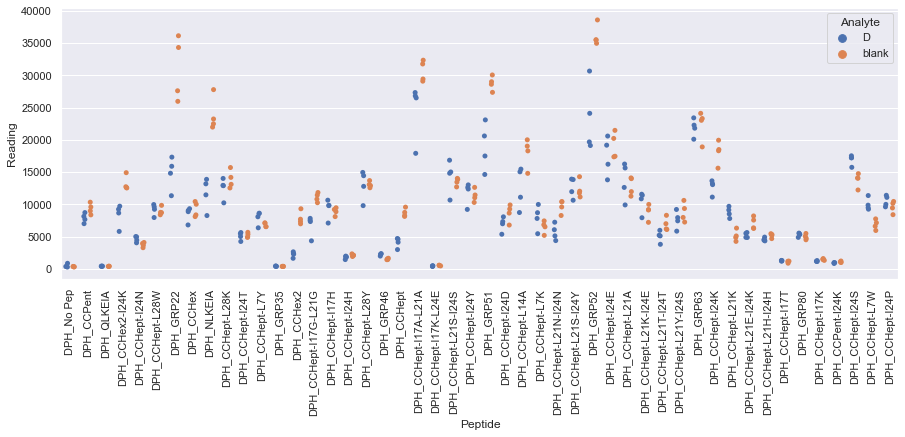

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_10.xlsx
Drawing scatter plot of data spread for N_repeat_10 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

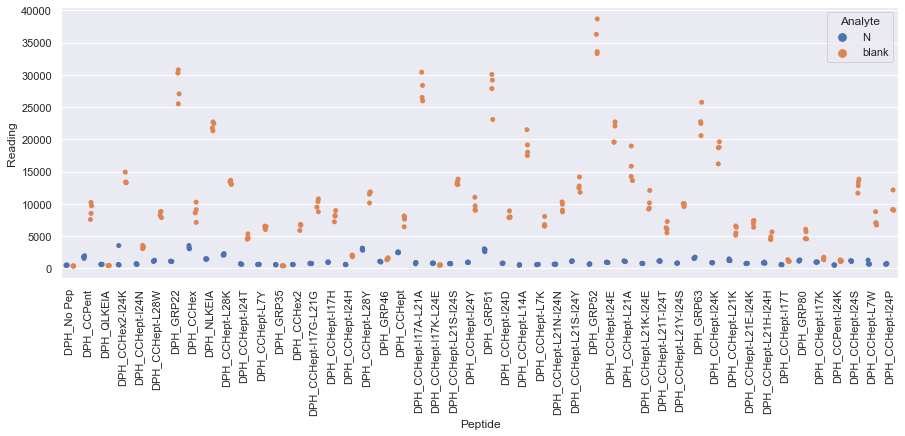

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_10.xlsx
Drawing scatter plot of data spread for O_repeat_10 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

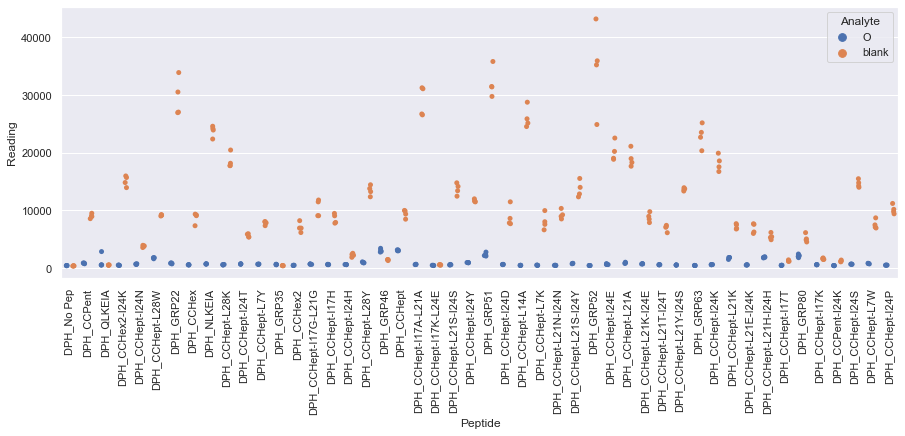

Parsing plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_10.xlsx
Drawing scatter plot of data spread for P_repeat_10 in FA_unscaled_data


<Figure size 720x720 with 0 Axes>

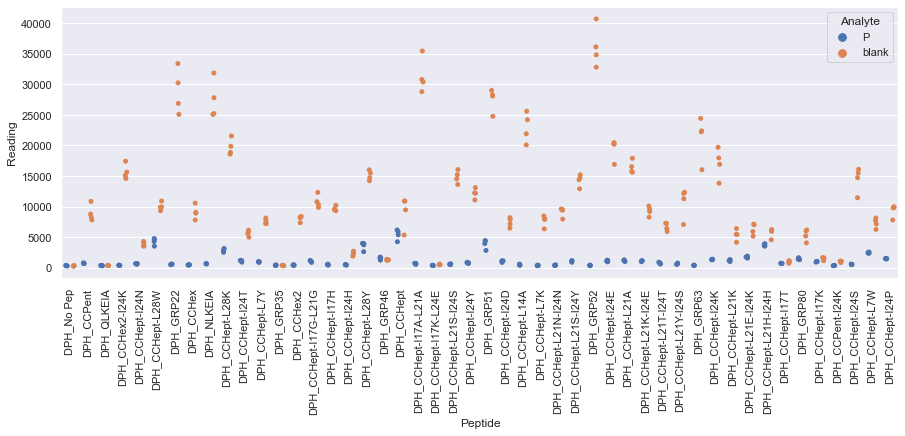

Drawing scatter plot of data spread for B_repeat_1 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

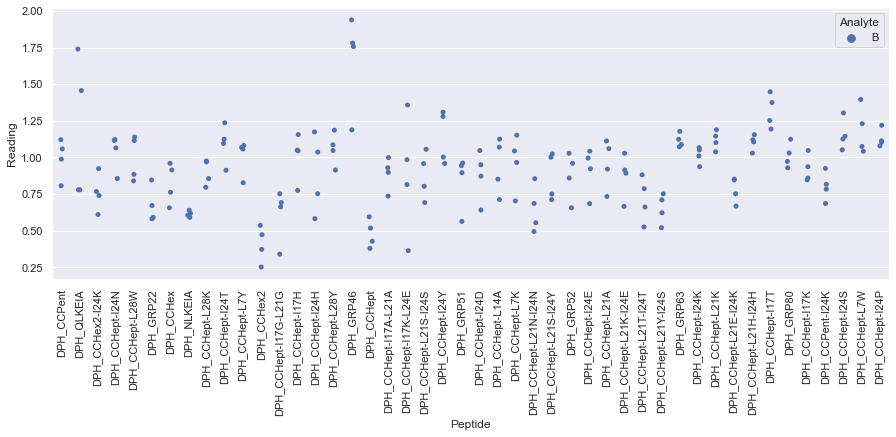

Drawing scatter plot of data spread for D_repeat_1 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

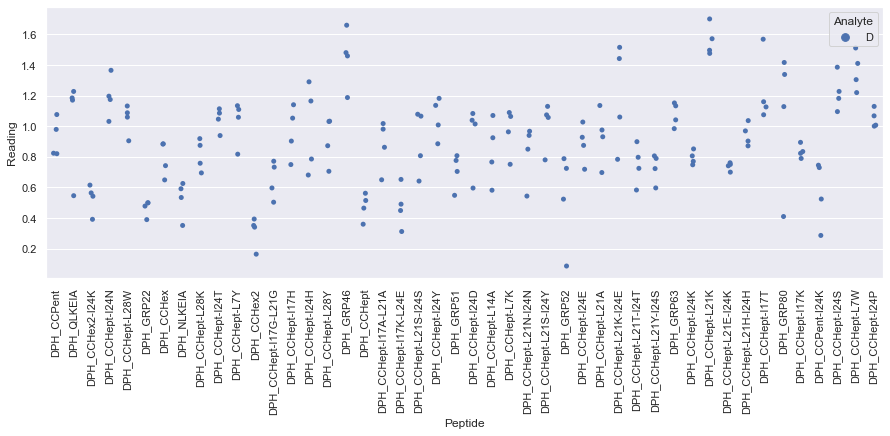

Drawing scatter plot of data spread for N_repeat_1 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

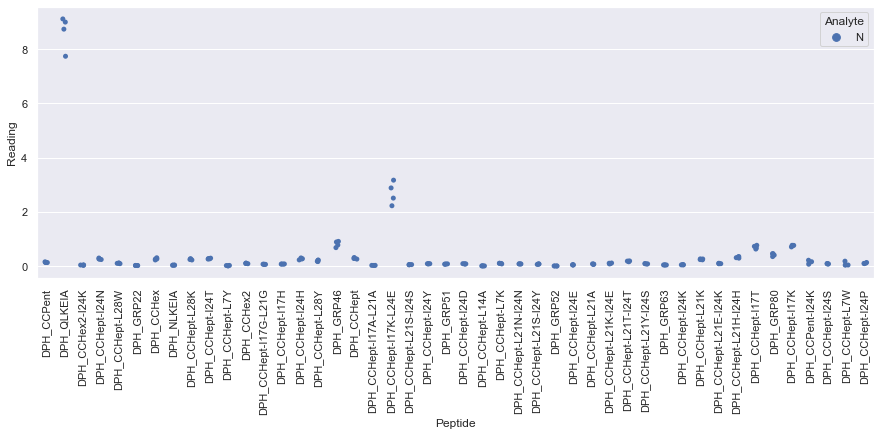

 WARNING - median fluorescence of (O + DPH_CCPent-I24K + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_1.xlsx. Analysis will continue but please CHECK YOUR DATA. 
Drawing scatter plot of data spread for O_repeat_1 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

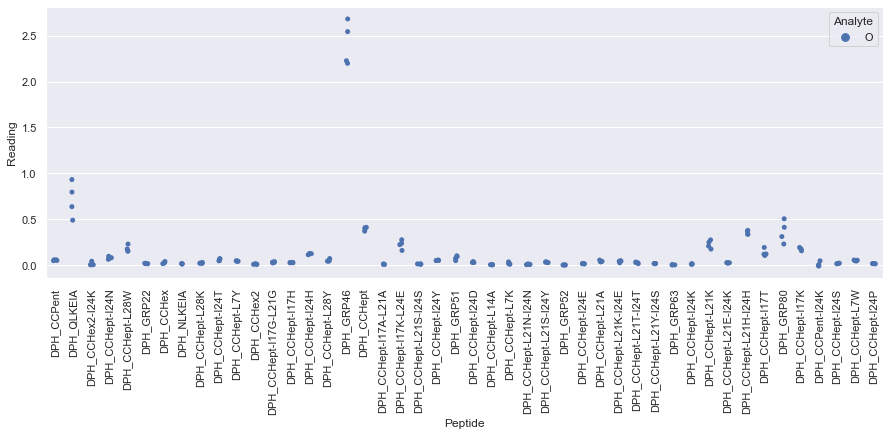

Drawing scatter plot of data spread for P_repeat_1 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

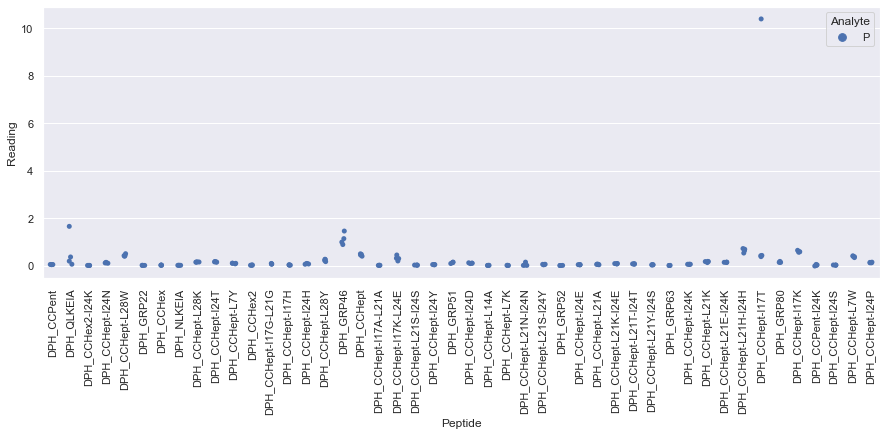

Drawing scatter plot of data spread for B_repeat_2 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

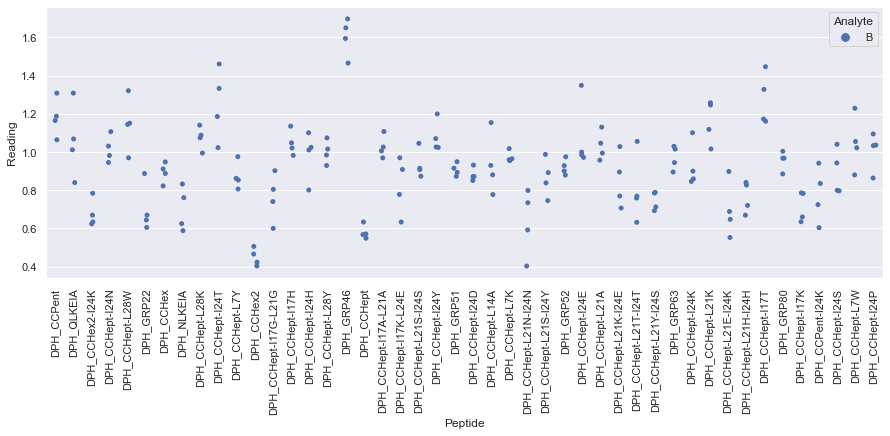

Drawing scatter plot of data spread for D_repeat_2 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

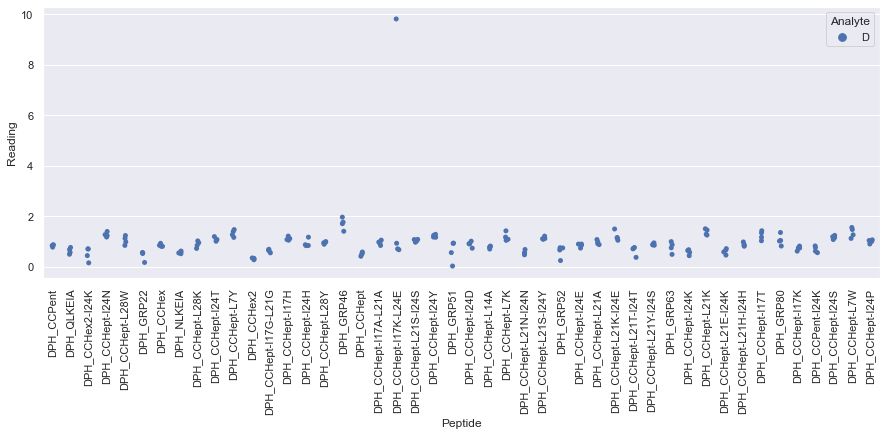

Drawing scatter plot of data spread for N_repeat_2 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

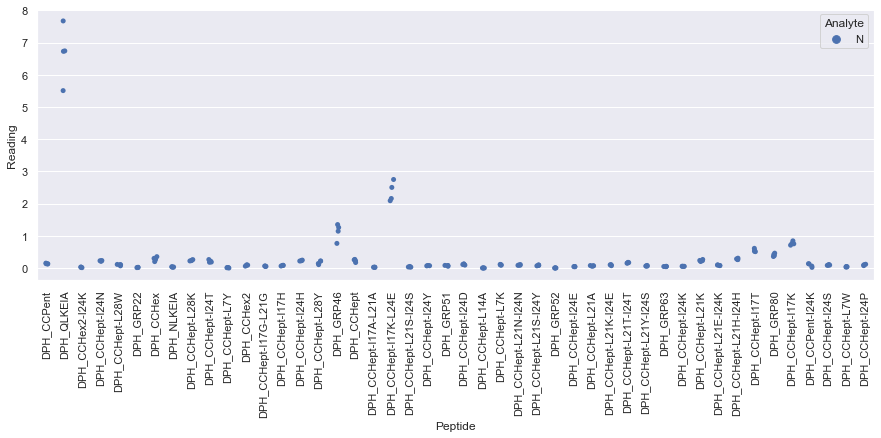

Drawing scatter plot of data spread for O_repeat_2 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

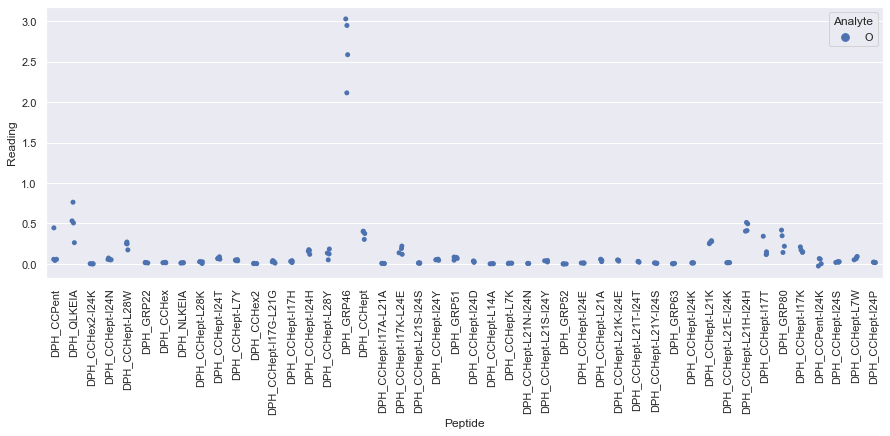

Drawing scatter plot of data spread for P_repeat_2 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

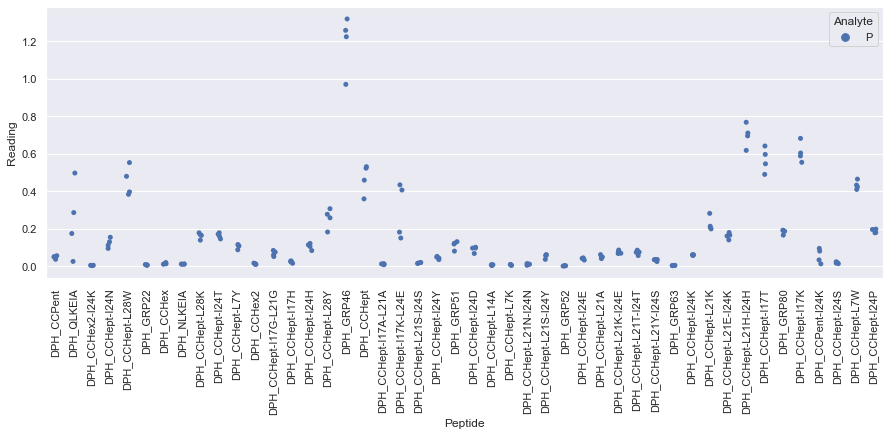

Drawing scatter plot of data spread for B_repeat_3 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

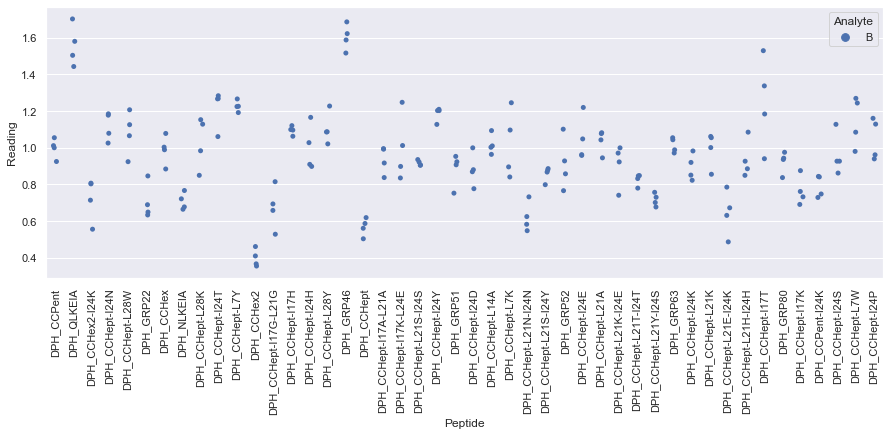

Drawing scatter plot of data spread for D_repeat_3 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

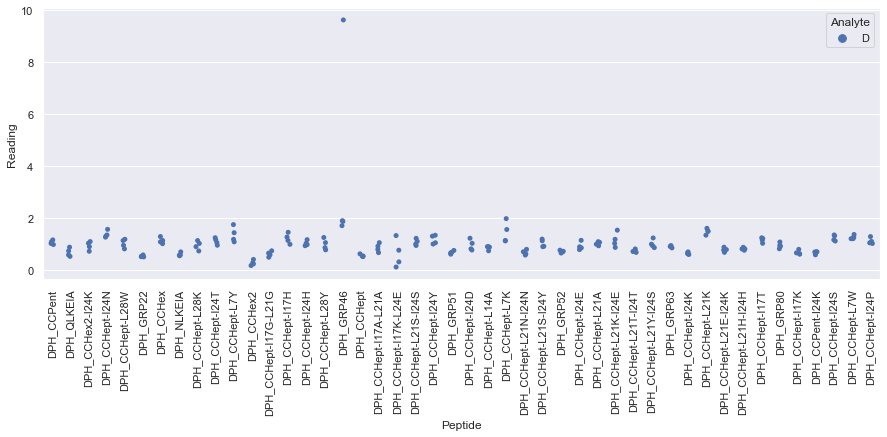

 WARNING - median fluorescence of (N + DPH_CCHept-L14A + fluorophore) is less than fluorescence of (N + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/N_repeat_3.xlsx. Analysis will continue but please CHECK YOUR DATA. 
Drawing scatter plot of data spread for N_repeat_3 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

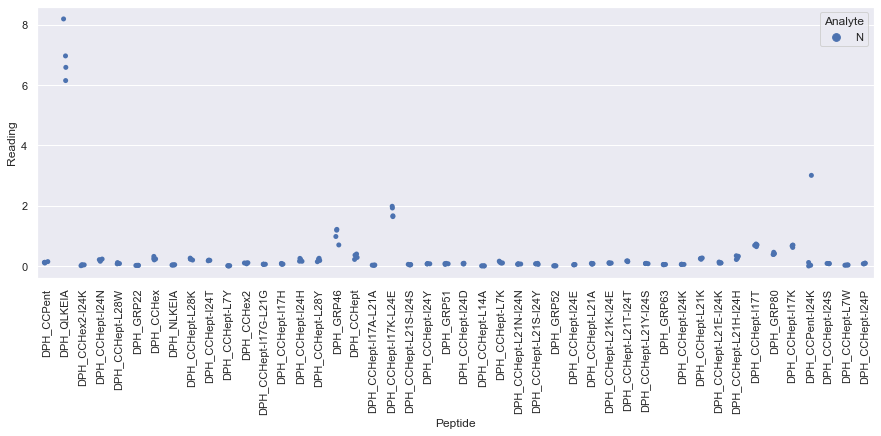

 WARNING - median fluorescence of (O + DPH_CCHex2-I24K + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_3.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (O + DPH_CCHex2 + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_3.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (O + DPH_GRP52 + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_3.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (O + DPH_CCPent-I24K + fluorophore) is less than fluorescence of (O + fluo

<Figure size 720x720 with 0 Axes>

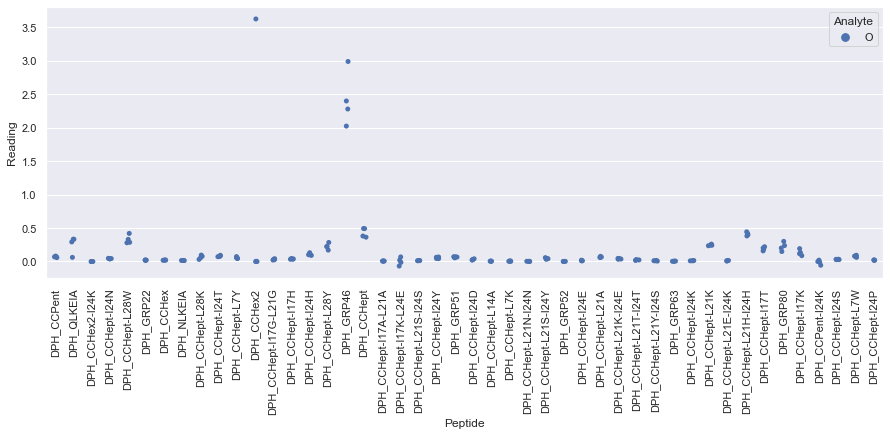

 WARNING - median fluorescence of (P + DPH_QLKEIA + fluorophore) is less than fluorescence of (P + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_3.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (P + DPH_CCPent-I24K + fluorophore) is less than fluorescence of (P + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_3.xlsx. Analysis will continue but please CHECK YOUR DATA. 
Drawing scatter plot of data spread for P_repeat_3 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

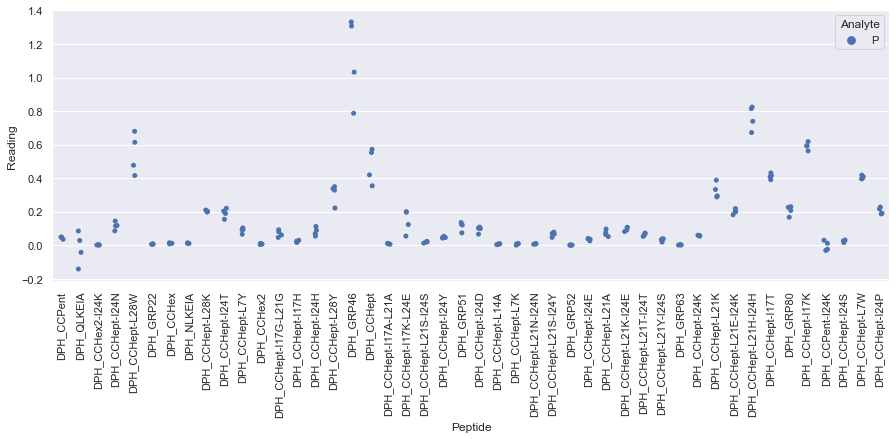

Drawing scatter plot of data spread for B_repeat_4 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

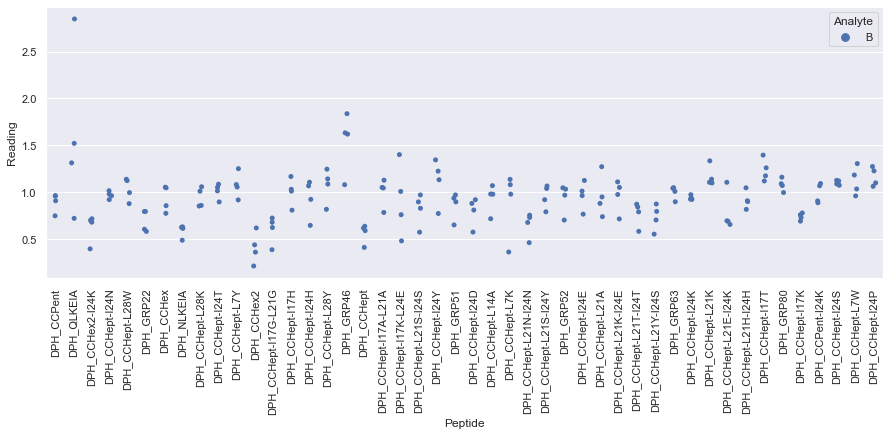

Drawing scatter plot of data spread for D_repeat_4 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

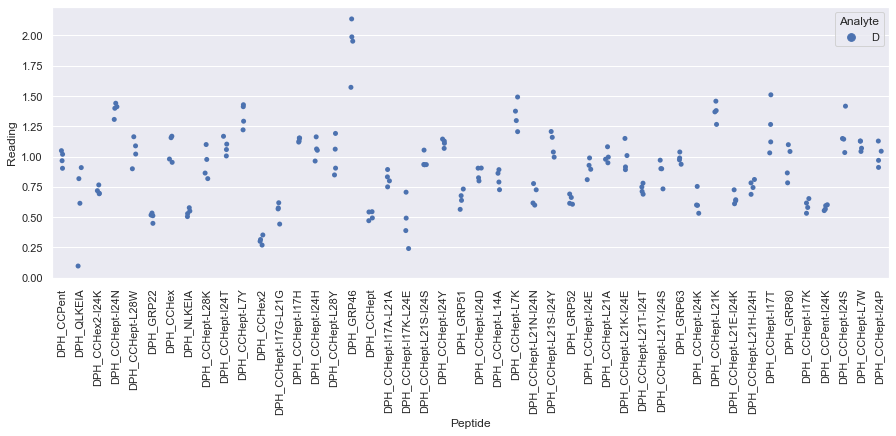

Drawing scatter plot of data spread for N_repeat_4 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

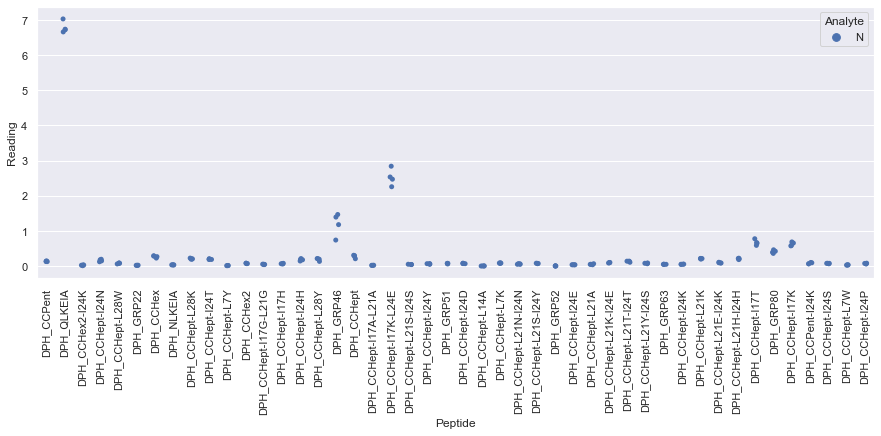

Drawing scatter plot of data spread for O_repeat_4 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

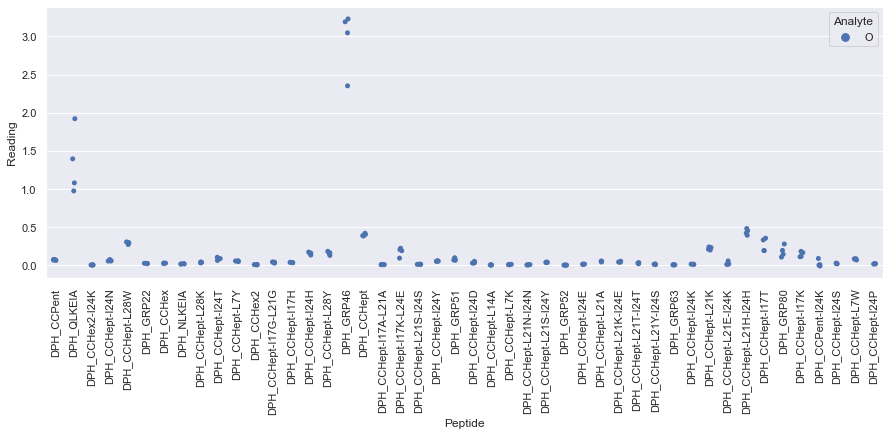

Drawing scatter plot of data spread for P_repeat_4 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

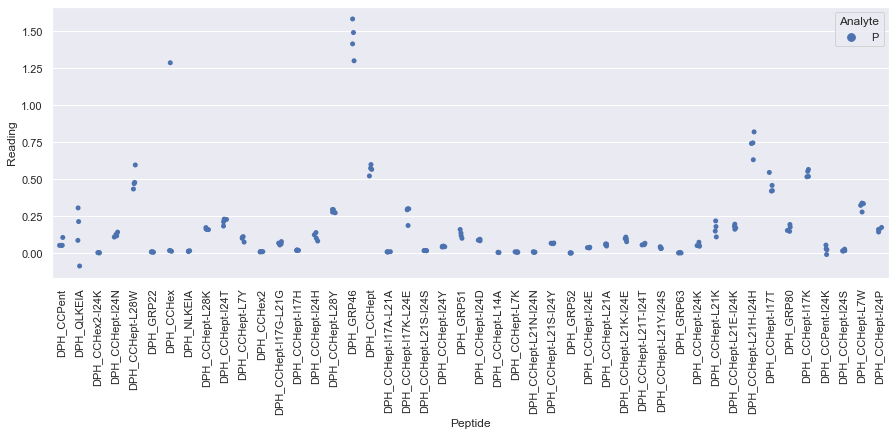

Drawing scatter plot of data spread for B_repeat_5 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

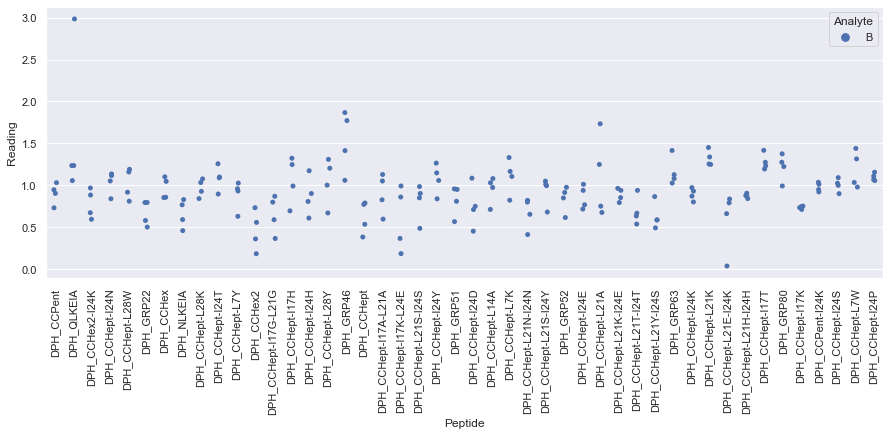

Drawing scatter plot of data spread for D_repeat_5 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

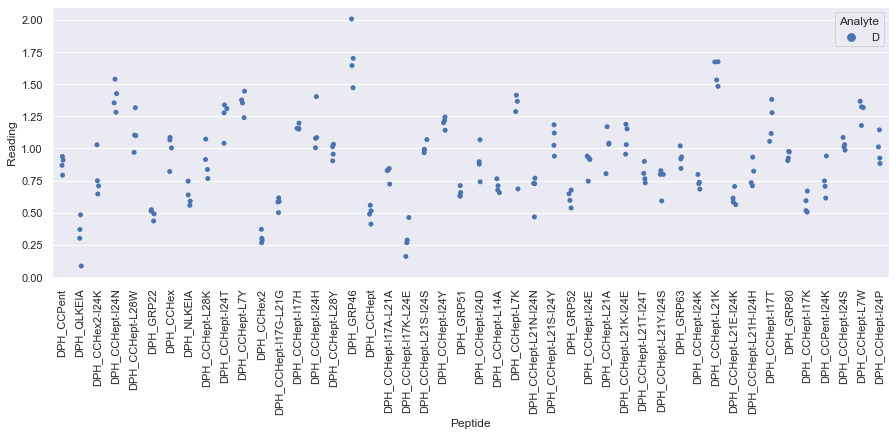

Drawing scatter plot of data spread for N_repeat_5 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

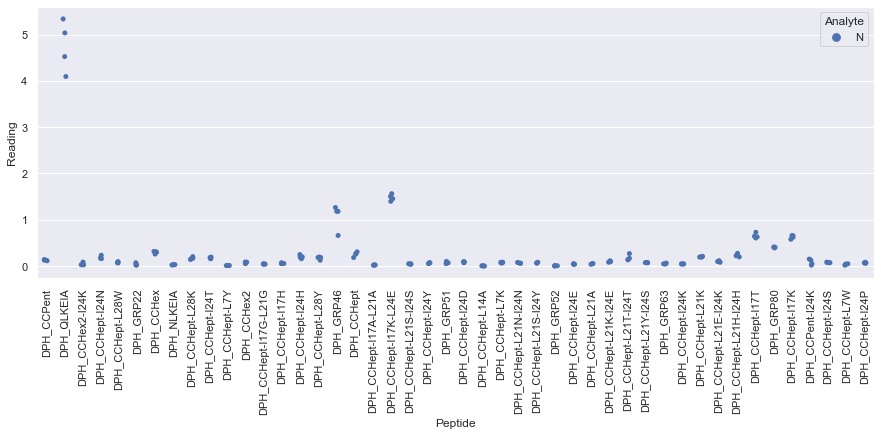

Drawing scatter plot of data spread for O_repeat_5 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

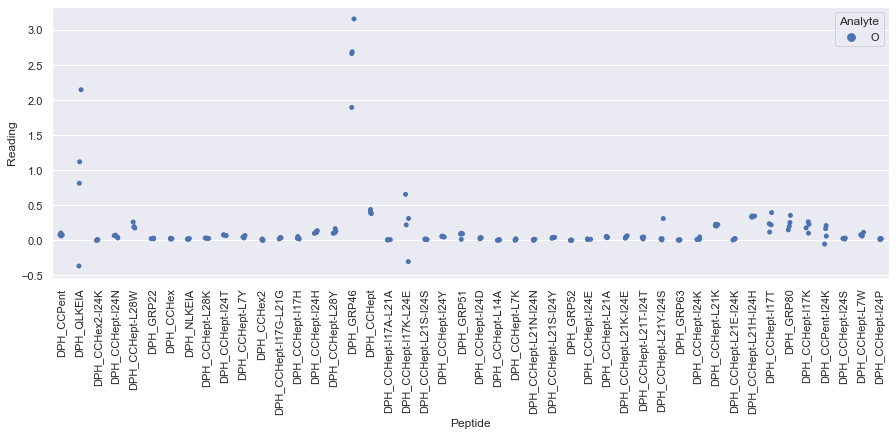

Drawing scatter plot of data spread for P_repeat_5 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

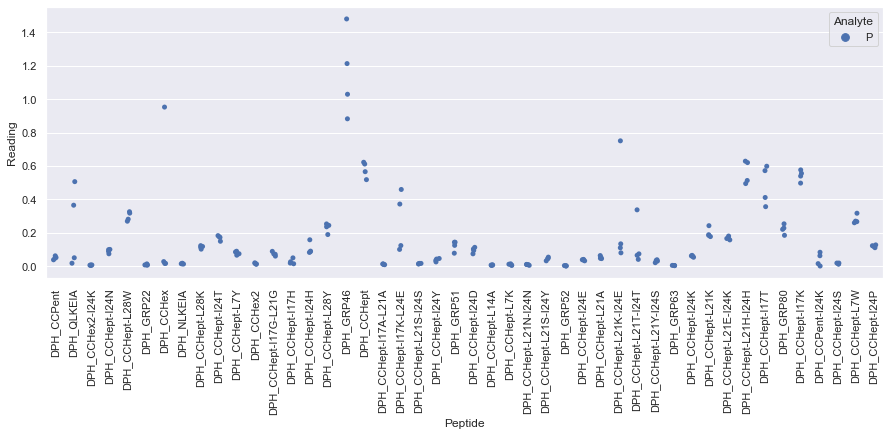

Drawing scatter plot of data spread for B_repeat_6 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

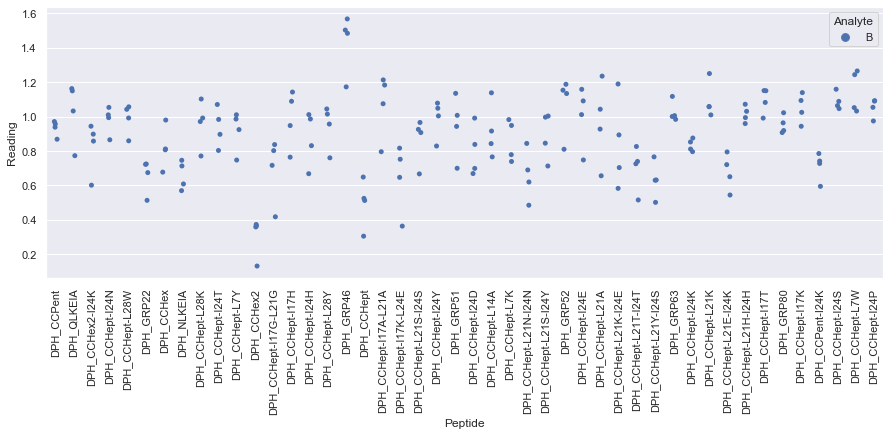

Drawing scatter plot of data spread for D_repeat_6 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

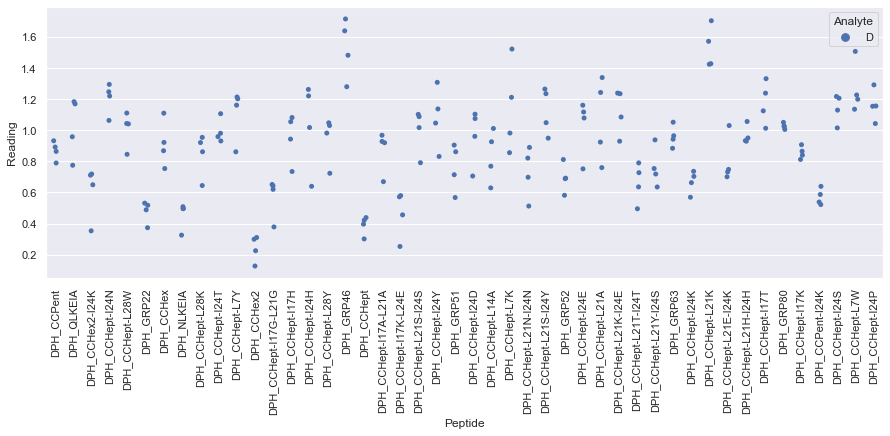

Drawing scatter plot of data spread for N_repeat_6 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

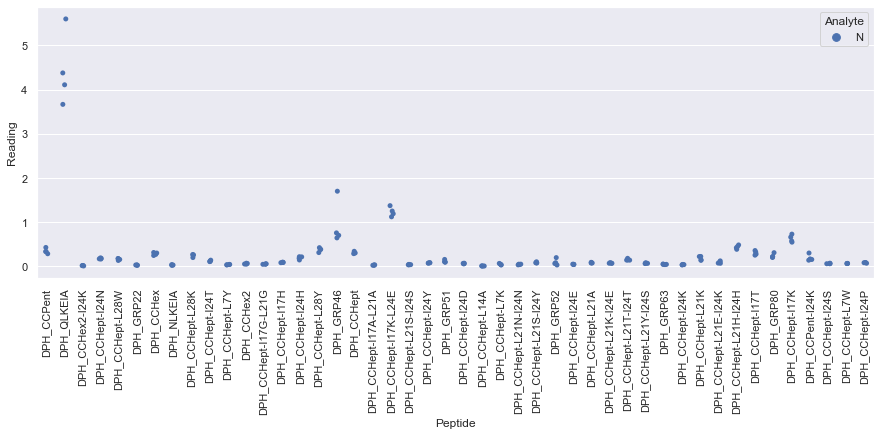

 WARNING - median fluorescence of (O + DPH_CCHept-L14A + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_6.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (O + DPH_GRP52 + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_6.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (O + DPH_CCPent-I24K + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_6.xlsx. Analysis will continue but please CHECK YOUR DATA. 
Drawing scatter plot of data spread for O_repeat_6 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

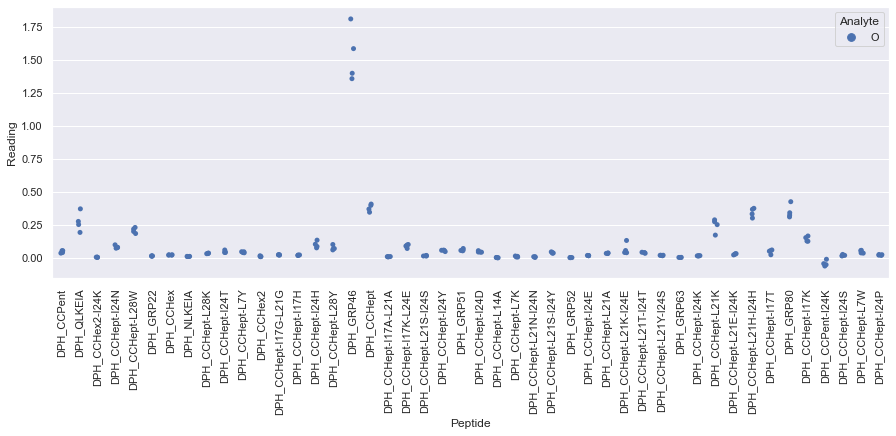

Drawing scatter plot of data spread for P_repeat_6 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

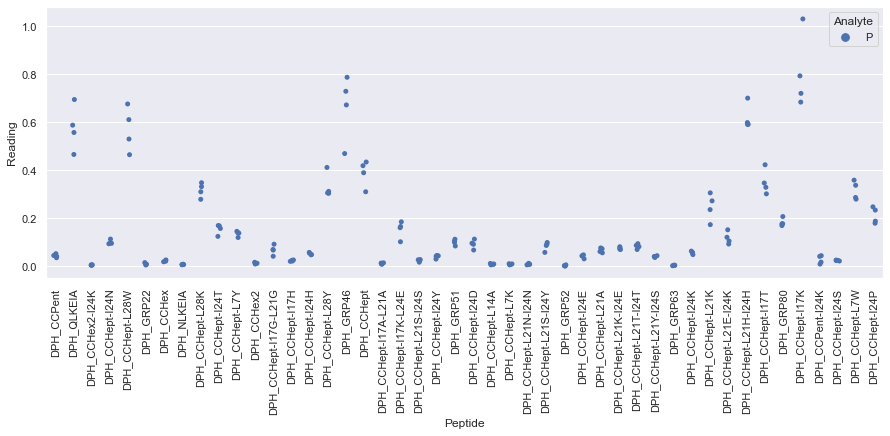

Drawing scatter plot of data spread for B_repeat_7 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

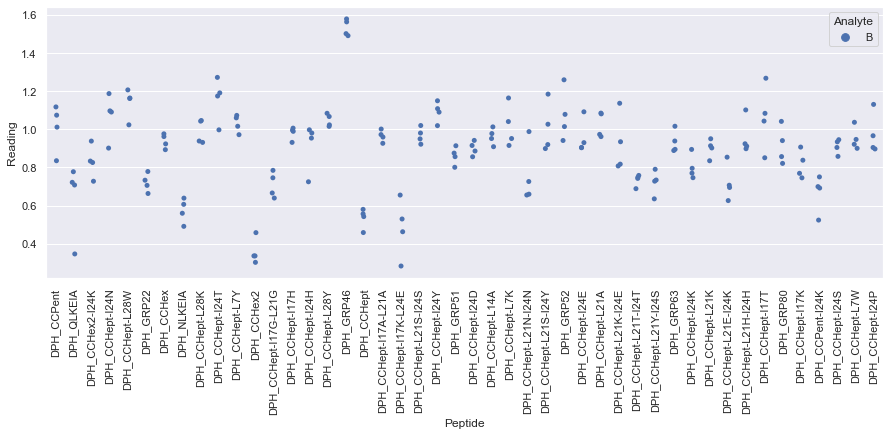

Drawing scatter plot of data spread for D_repeat_7 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

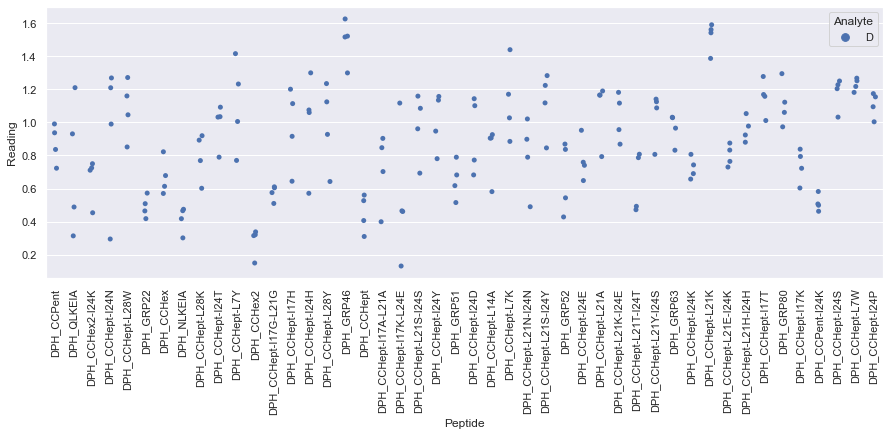

Drawing scatter plot of data spread for N_repeat_7 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

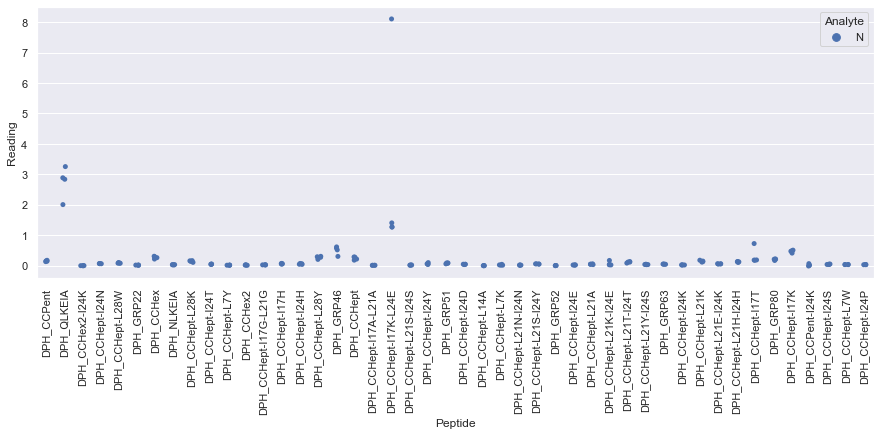

 WARNING - median fluorescence of (O + DPH_CCHex2-I24K + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_7.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (O + DPH_CCHept-L14A + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_7.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (O + DPH_GRP52 + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_7.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (O + DPH_CCPent-I24K + fluorophore) is less than fluorescence of (O +

<Figure size 720x720 with 0 Axes>

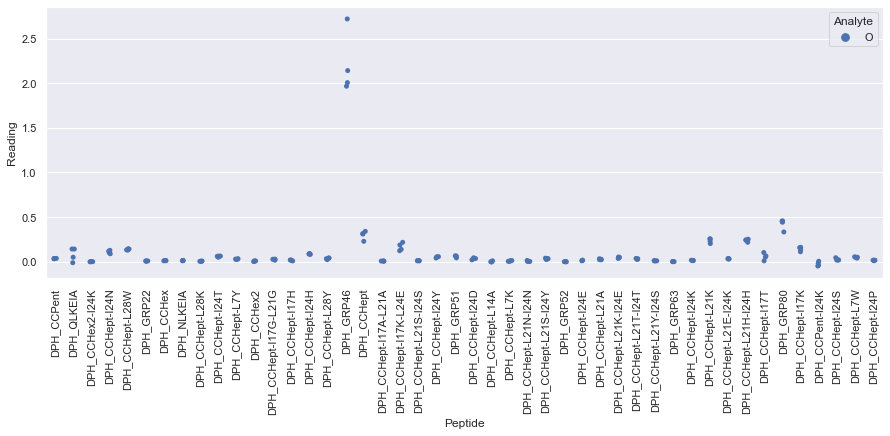

Drawing scatter plot of data spread for P_repeat_7 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

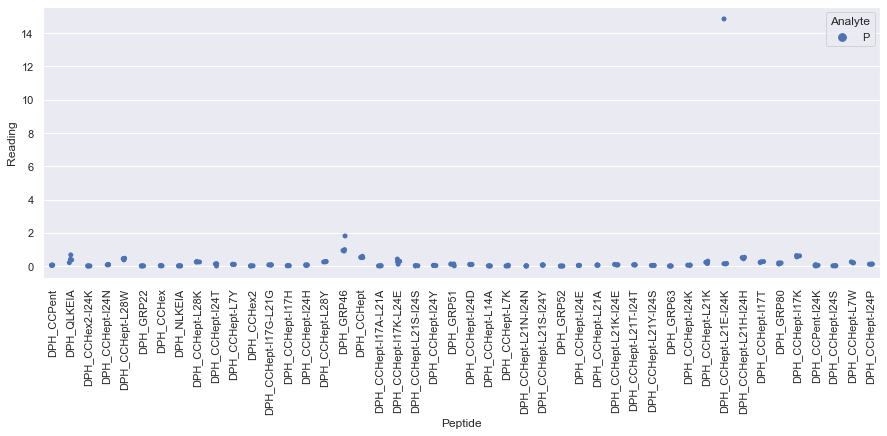

Drawing scatter plot of data spread for B_repeat_8 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

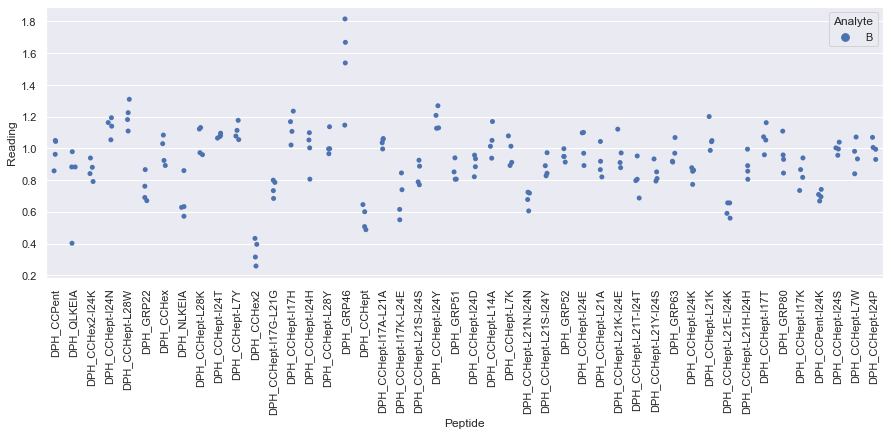

Drawing scatter plot of data spread for D_repeat_8 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

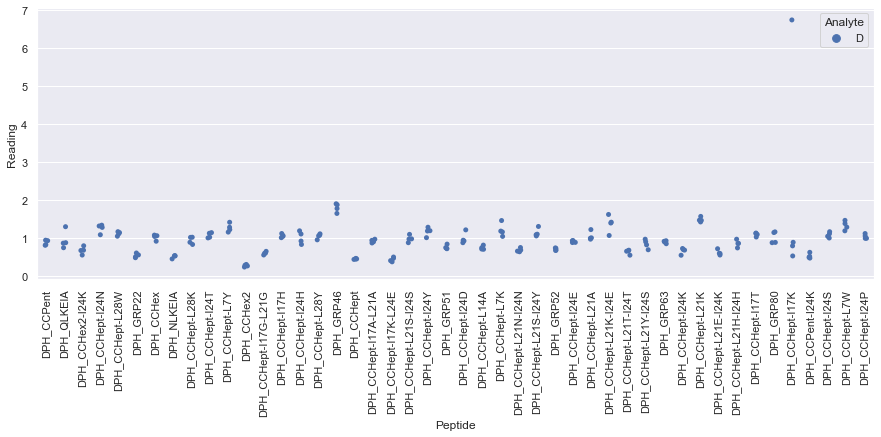

Drawing scatter plot of data spread for N_repeat_8 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

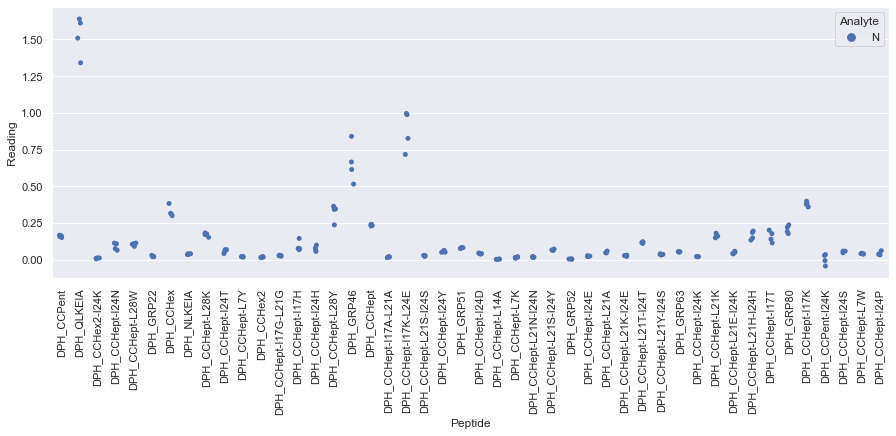

Drawing scatter plot of data spread for O_repeat_8 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

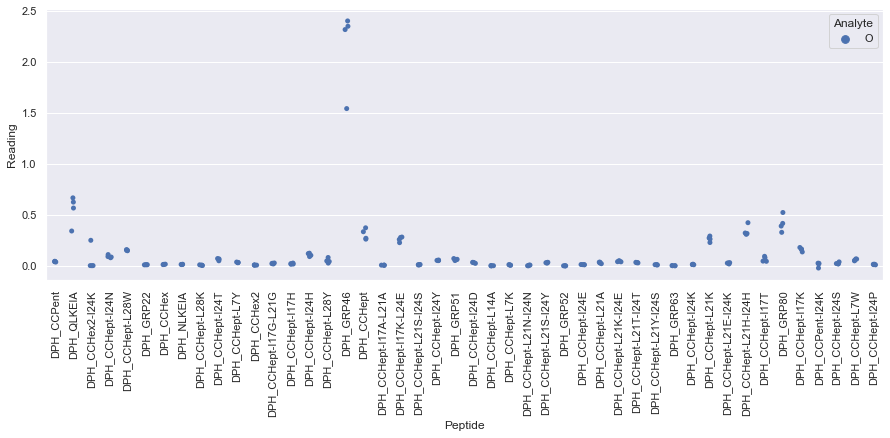

Drawing scatter plot of data spread for P_repeat_8 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

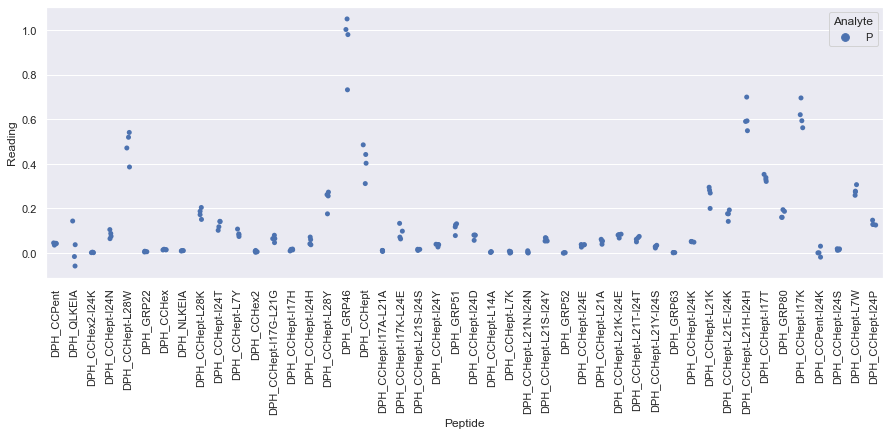

Drawing scatter plot of data spread for B_repeat_9 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

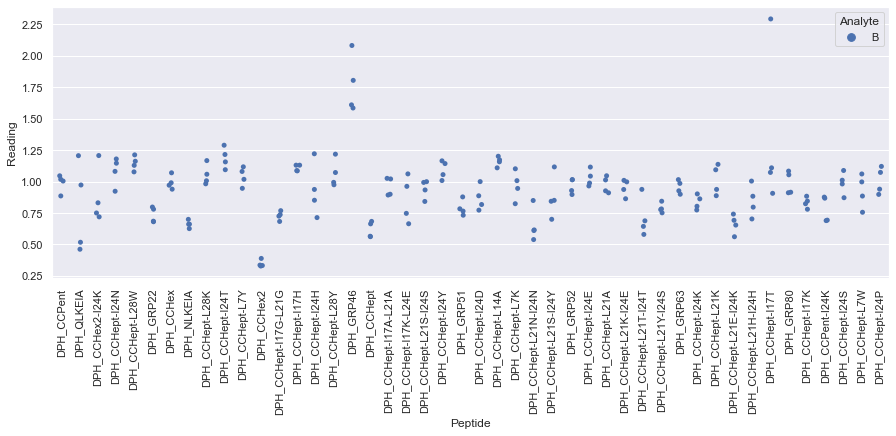

Drawing scatter plot of data spread for D_repeat_9 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

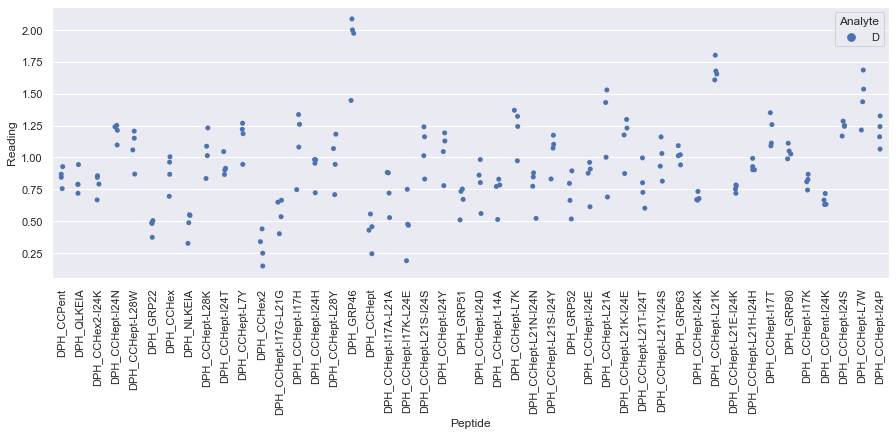

Drawing scatter plot of data spread for N_repeat_9 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

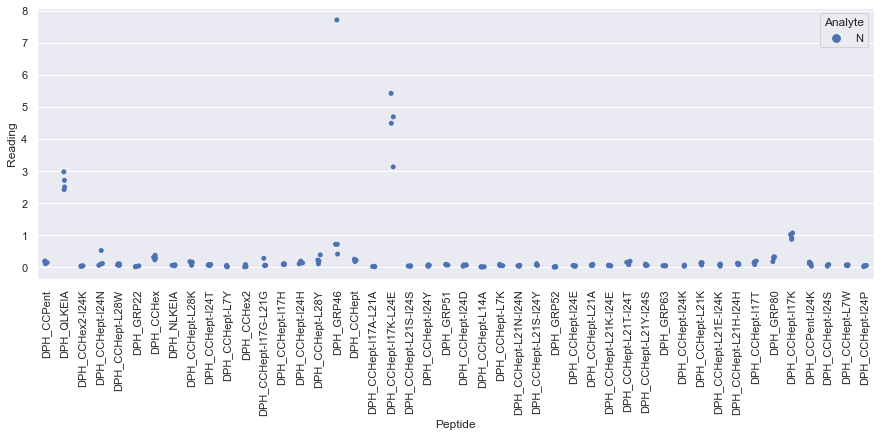

 WARNING - median fluorescence of (P + DPH_QLKEIA + fluorophore) is less than fluorescence of (P + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_9.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (P + DPH_CCHex2-I24K + fluorophore) is less than fluorescence of (P + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_9.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (P + DPH_CCHex2 + fluorophore) is less than fluorescence of (P + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/P_repeat_9.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (P + DPH_CCHept-I17K-L24E + fluorophore) is less than fluorescence of (P 

<Figure size 720x720 with 0 Axes>

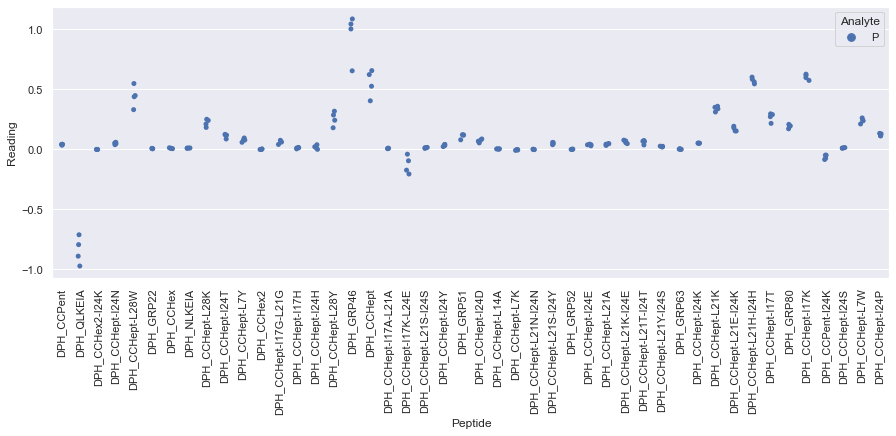

Drawing scatter plot of data spread for B_repeat_10 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

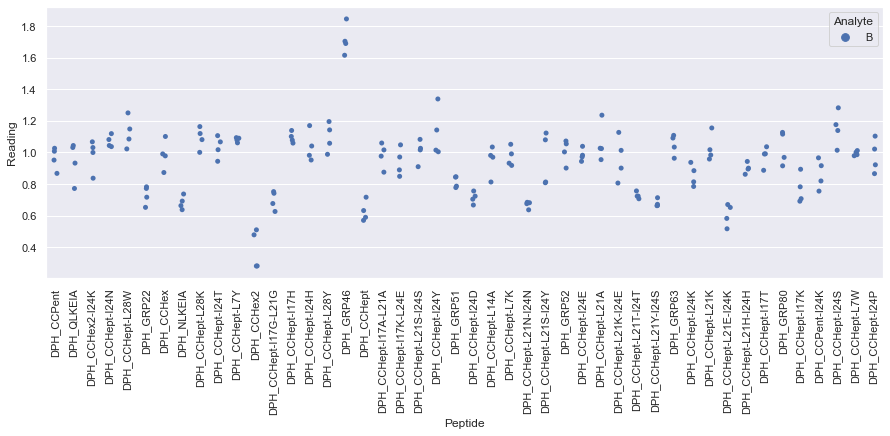

Drawing scatter plot of data spread for D_repeat_10 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

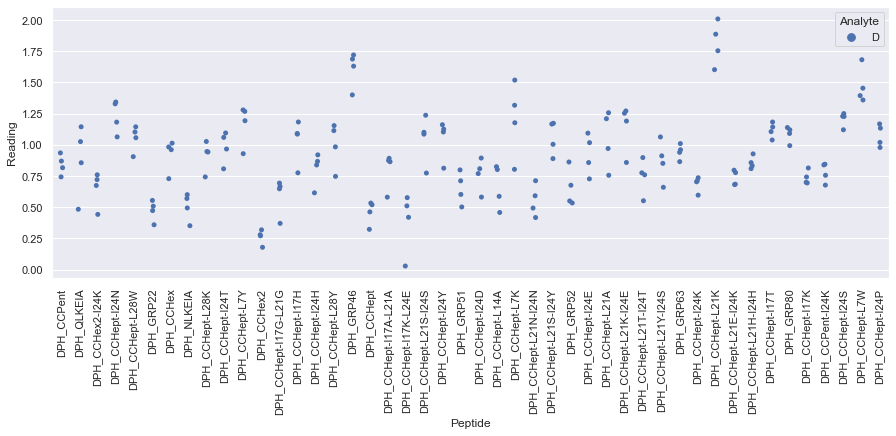

Drawing scatter plot of data spread for N_repeat_10 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

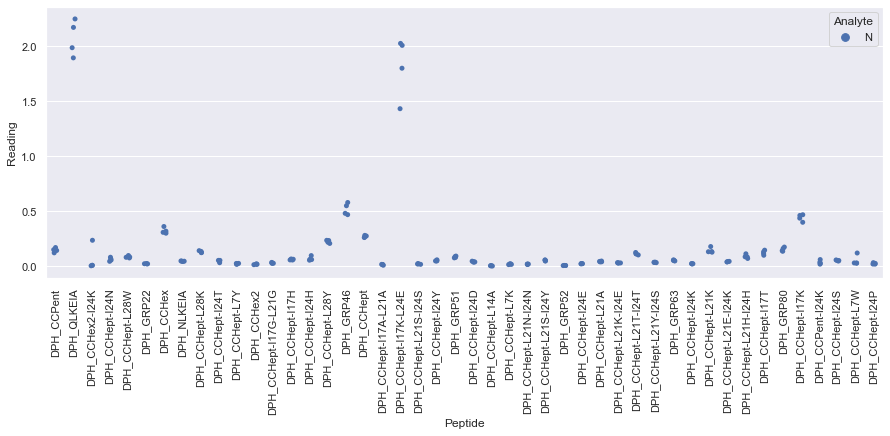

 WARNING - median fluorescence of (O + DPH_GRP52 + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_10.xlsx. Analysis will continue but please CHECK YOUR DATA. 
 WARNING - median fluorescence of (O + DPH_CCPent-I24K + fluorophore) is less than fluorescence of (O + fluorophore) alone on plate /Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/O_repeat_10.xlsx. Analysis will continue but please CHECK YOUR DATA. 
Drawing scatter plot of data spread for O_repeat_10 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

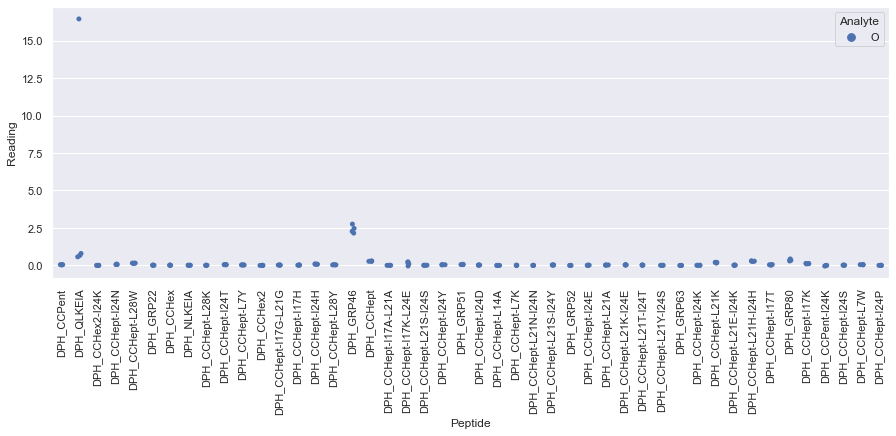

Drawing scatter plot of data spread for P_repeat_10 in FA_scaled_data


<Figure size 720x720 with 0 Axes>

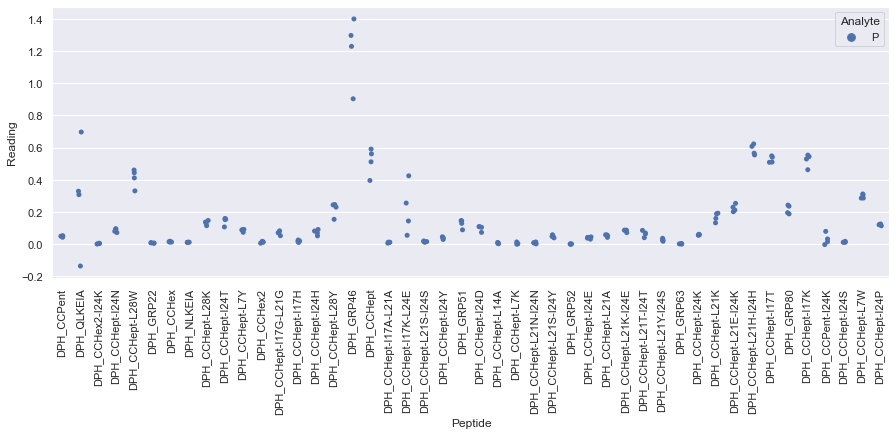



Outliers on the same plate:

/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_1.xlsx: blank, DPH_CCHept-L28Y, 14387.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_1.xlsx: blank, DPH_CCHept-I17K-L24E, 858.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_1.xlsx: B, DPH_CCHept-L7Y, 5924.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/B_repeat_1.xlsx: B, DPH_GRP51, 17187.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_1.xlsx: blank, DPH_GRP52, 48839.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatted_FA_csvs/D_repeat_1.xlsx: blank, DPH_CCHept-L21T-I24T, 8211.0
/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/FAs/Reformatte

In [7]:
fa_fluor_data = ParseArrayData(
    data_dirs_dict={'DPH': '/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_data_large_array/'
                           'FAs/Reformatted_FA_csvs/'},
    results_dir='/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_analysis_large_array/'
                'FAs/FA_plate_parsing_plots/',
    repeat_labels_list=['repeat_1', 'repeat_2', 'repeat_3', 'repeat_4', 'repeat_5', 'repeat_6', 'repeat_7',
                        'repeat_8', 'repeat_9', 'repeat_10'],
    peptide_dict = {'DPH': ['No Pep', 'CCPent', 'QLKEIA', 'CCHex2-I24K', 'CCHept-I24N', 'CCHept-L28W',
                            'GRP22', 'CCHex', 'NLKEIA', 'CCHept-L28K', 'CCHept-I24T', 'CCHept-L7Y',
                            'GRP35', 'CCHex2', 'CCHept-I17G-L21G', 'CCHept-I17H', 'CCHept-I24H', 'CCHept-L28Y',
                            'GRP46', 'CCHept', 'CCHept-I17A-L21A', 'CCHept-I17K-L24E', 'CCHept-L21S-I24S',
                            'CCHept-I24Y', 'GRP51', 'CCHept-I24D', 'CCHept-L14A', 'CCHept-L7K',
                            'CCHept-L21N-I24N', 'CCHept-L21S-I24Y', 'GRP52', 'CCHept-I24E', 'CCHept-L21A',
                            'CCHept-L21K-I24E', 'CCHept-L21T-I24T', 'CCHept-L21Y-I24S', 'GRP63', 'CCHept-I24K',
                            'CCHept-L21K', 'CCHept-L21E-I24K', 'CCHept-L21H-I24H', 'CCHept-I17T', 'GRP80',
                            'CCHept-I17K', 'CCPent-I24K', 'CCHept-I24S', 'CCHept-L7W', 'CCHept-I24P']},
    control_peptides={'DPH': ['GRP35']},
    control_analytes=[]
)
fa_fluor_data.group_xlsx_repeats(ignore_files={'DPH': ['O_repeat_9.xlsx']})
fa_fluor_data.xlsx_to_scaled_df(
    no_pep={'DPH': 'No Pep'}, scale_method='analyte_fluorophore', draw_plot=True, plot_dir_name='FA'
)

Combines readings of the same analyte solution across different plates, then calculates the median reading of non-independent repeats of the same analyte. Runs generalised ESD test, discards samples with more than two outlier readings (p=0.05 threshold).

In [8]:
fa_fluor_data.combine_plate_readings(outlier_excl_thresh=0.05, drop_thresh=2)



Outliers across plates:

repeat_1_B: B, DPH_CCHept-L7Y, 0.8274386123000675
repeat_1_B: B, DPH_GRP51, 0.5635826010987719
repeat_1_D: D, DPH_QLKEIA, 0.5460992907801419
repeat_1_D: D, DPH_CCHept-I24D, 0.595922479701298
repeat_1_D: D, DPH_CCHept-I17T, 1.568082788671024
repeat_1_N: N, DPH_CCHept-L7W, 0.18032154340836012
repeat_1_O: O, DPH_CCHex2-I24K, 0.041086770440351264
repeat_1_O: O, DPH_CCHept-I24H, 0.11178180192264699
repeat_1_O: O, DPH_CCHept-I24Y, 0.05511407331453474
repeat_1_O: O, DPH_CCHept-L21E-I24K, 0.019499401334169567
repeat_1_P: P, DPH_CCHex2, 0.02642726180691661
repeat_1_P: P, DPH_CCHept-L21N-I24N, 0.1434275506987496
repeat_1_P: P, DPH_CCHept-L21S-I24Y, 0.028805099524926332
repeat_1_P: P, DPH_GRP52, 0.004831375521030693
repeat_1_P: P, DPH_CCHept-L21K, 0.12369114877589454
repeat_1_P: P, DPH_CCHept-I17T, 10.388857938718663
repeat_2_B: B, DPH_CCHept-L7K, 1.0179321098716565
repeat_2_B: B, DPH_CCHept-I24E, 1.3488673875924873
repeat_2_D: D, DPH_GRP22, 0.17400696242078015
repeat_2

 Outlier excluded from final output dataset: 5, P
DPH_CCPent                                  0.042743
DPH_QLKEIA                                  0.572519
DPH_CCHex2-I24K                             0.004646
DPH_CCHept-I24N                             0.096477
DPH_CCHept-L28W                             0.570444
DPH_GRP22                                   0.007994
DPH_CCHex                                   0.021852
DPH_NLKEIA                                  0.006769
DPH_CCHept-L28K                             0.320872
DPH_CCHept-I24T                             0.162466
DPH_CCHept-L7Y          Outlier: 0.13876591034864416
DPH_CCHex2                                    0.0113
DPH_CCHept-I17G-L21G                        0.068303
DPH_CCHept-I17H                             0.022928
DPH_CCHept-I24H                              0.05142
DPH_CCHept-L28Y                             0.308707
DPH_GRP46                                   0.700555
DPH_CCHept                                  0.404

Display range of data points across repeats for the different analytes




Original_data:


B


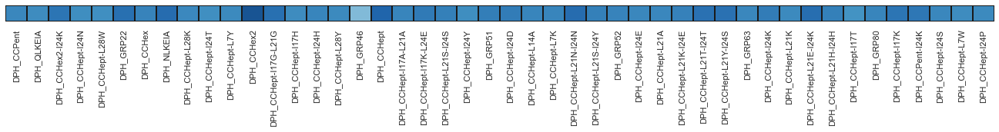


D


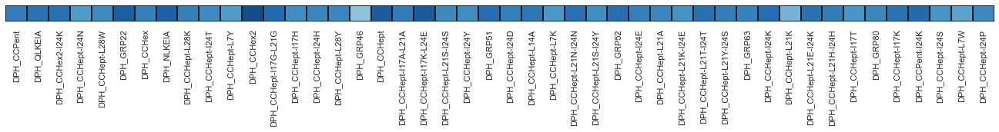


N


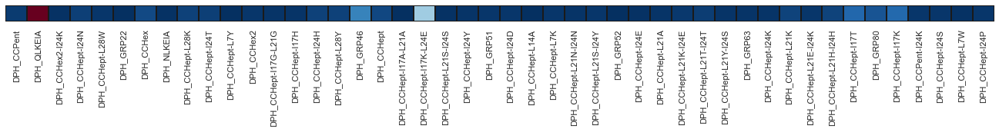


O


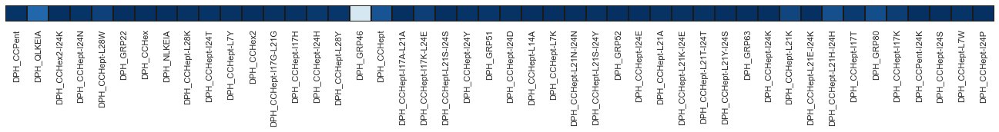


P


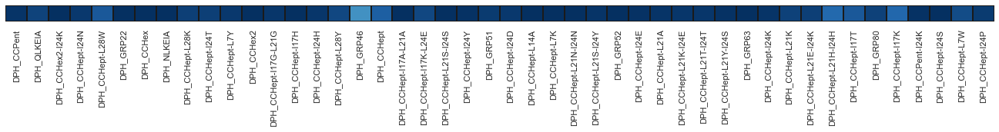




Scaled_data:


B


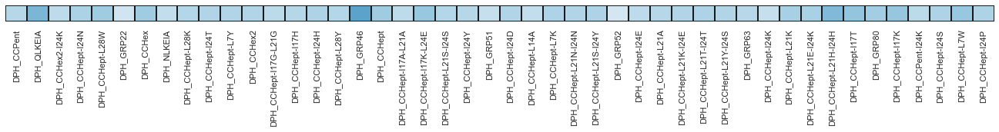


D


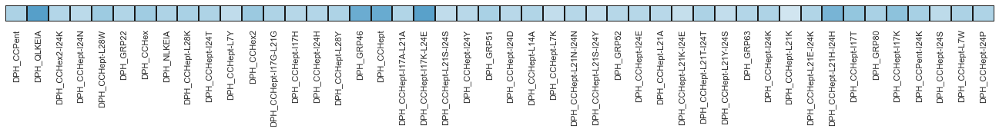


N


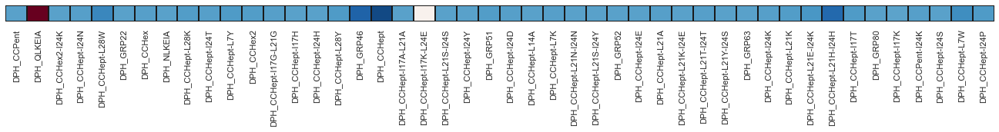


O


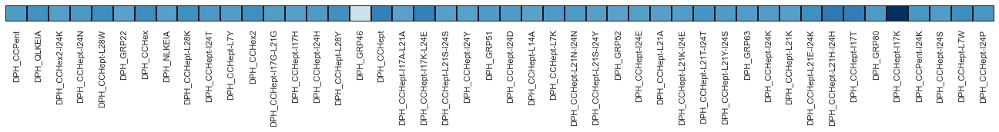


P


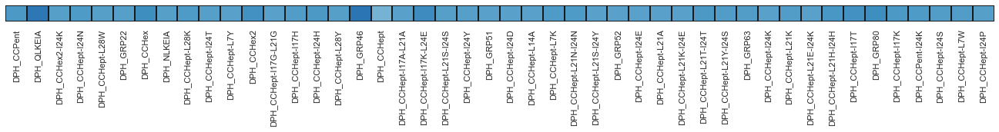




Original_data:



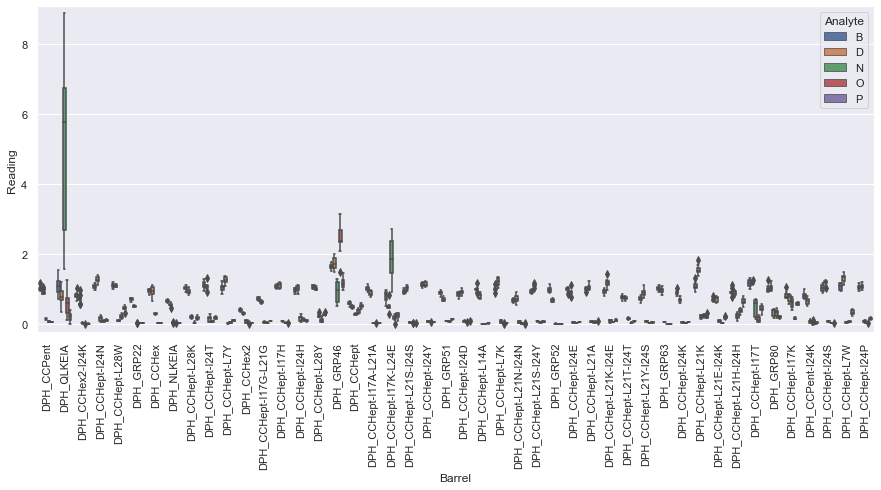

B


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 50.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 30.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 60.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 40.0% of the points

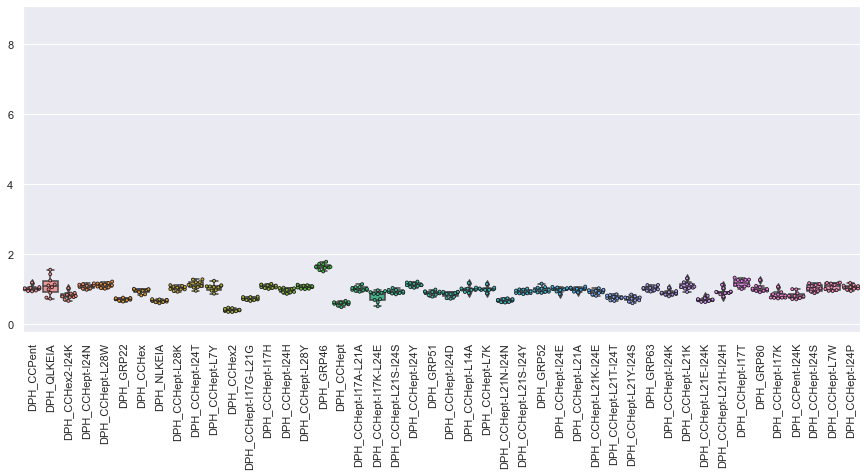

D


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 50.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 30.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 70.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 20.0% of the points

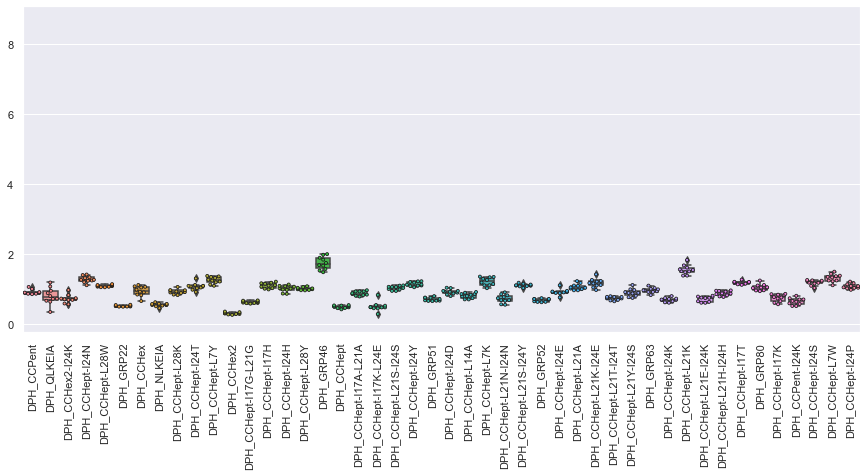

N


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 62.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 50.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 12.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 37.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 25.0% of the points

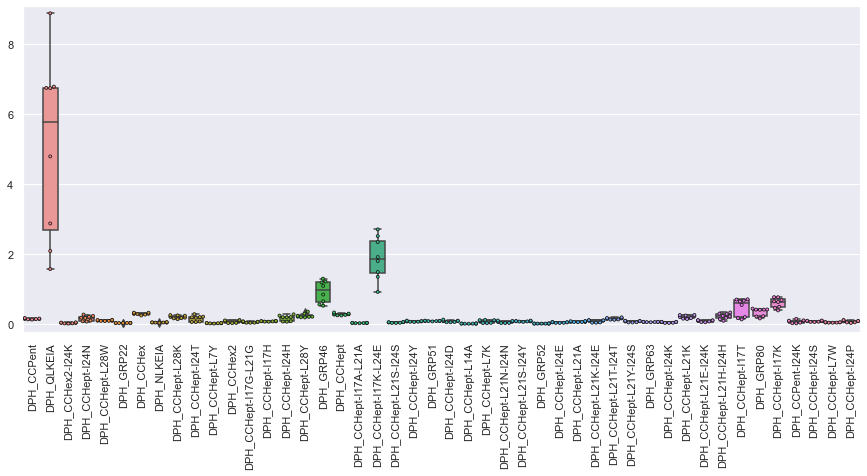

O


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 66.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 33.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 44.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 22.2% of the points

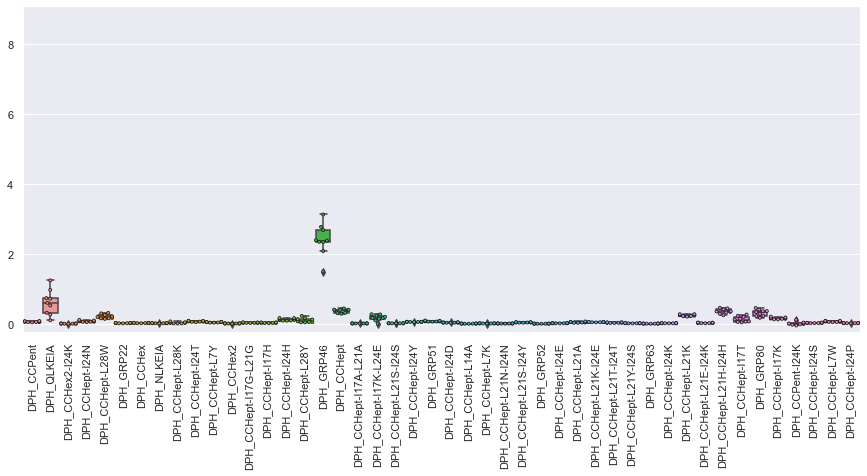

P


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 62.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 37.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 50.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 12.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 25.0% of the points

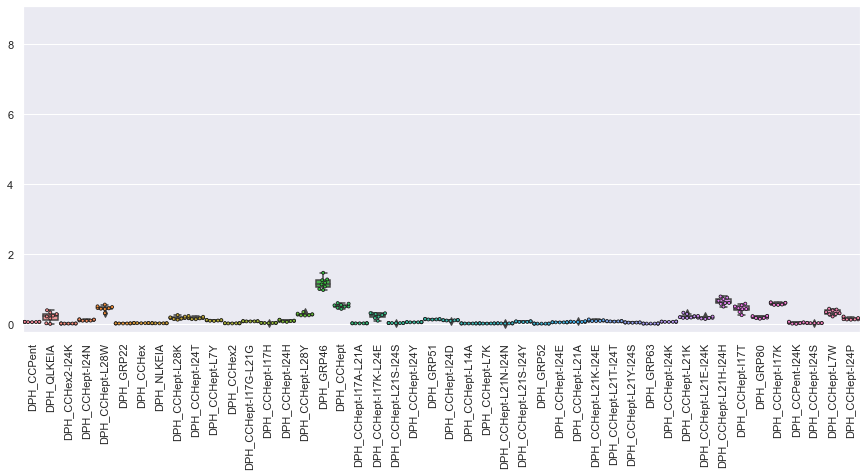




Scaled_data:



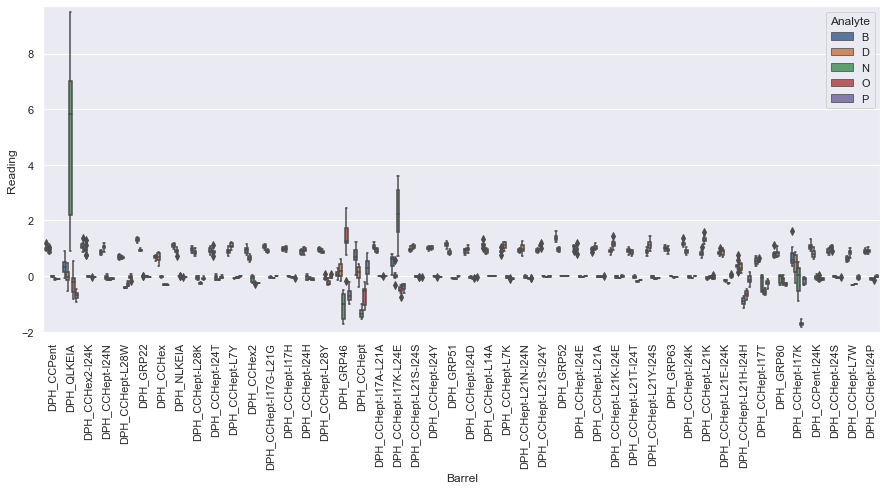

B


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 50.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 40.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 30.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 10.0% of the points

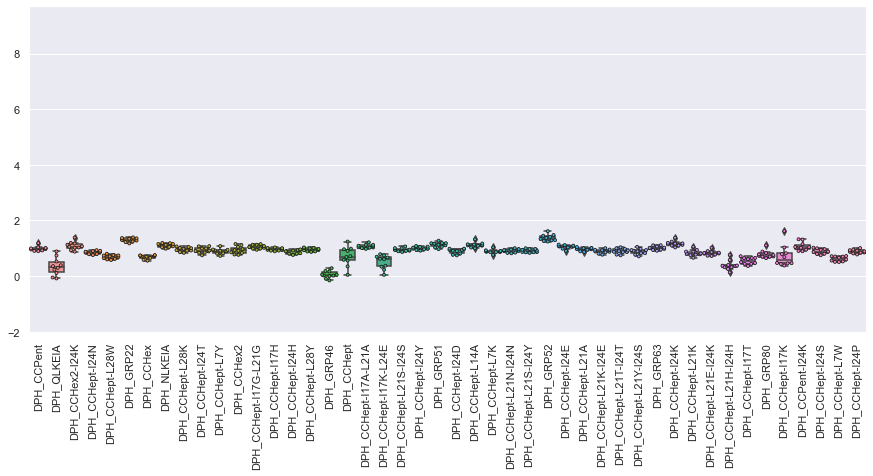

D


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 50.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 30.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 70.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 40.0% of the points

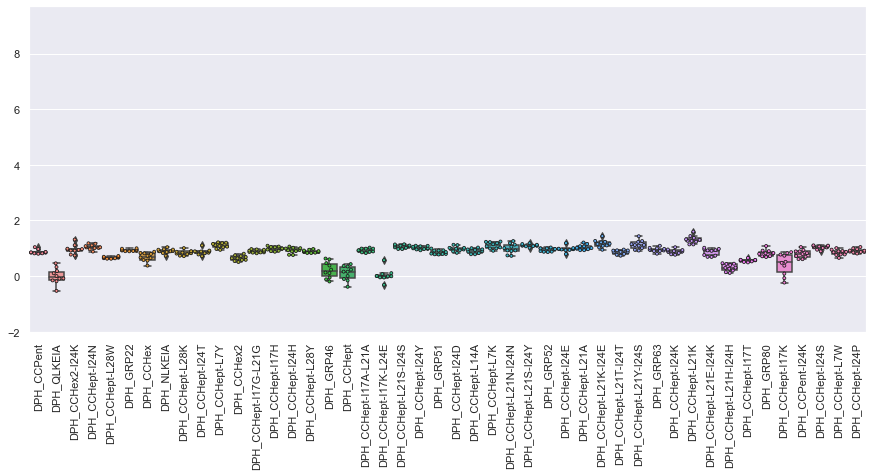

N


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 62.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 12.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 50.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 25.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 37.5% of the points

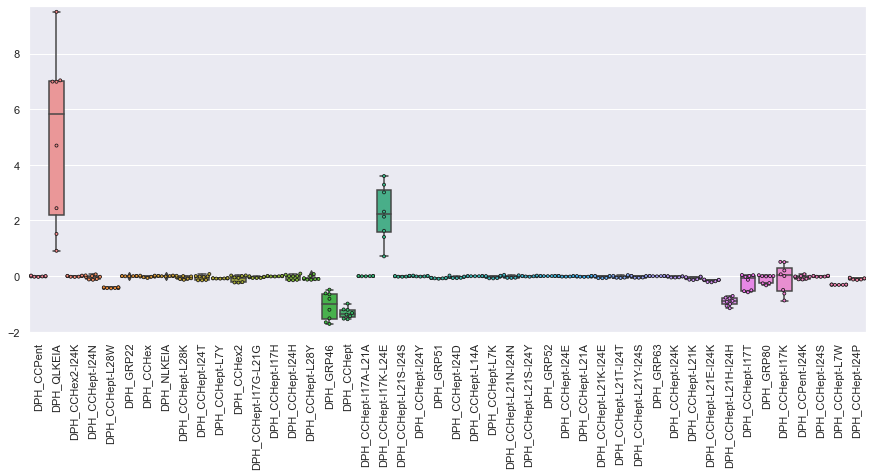

O


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 66.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 44.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 33.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 22.2% of the points

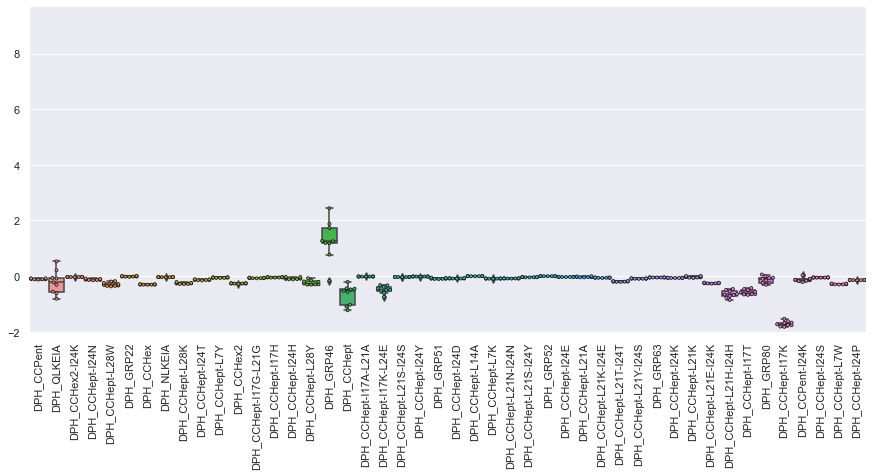

P


/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 62.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 25.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 50.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 12.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


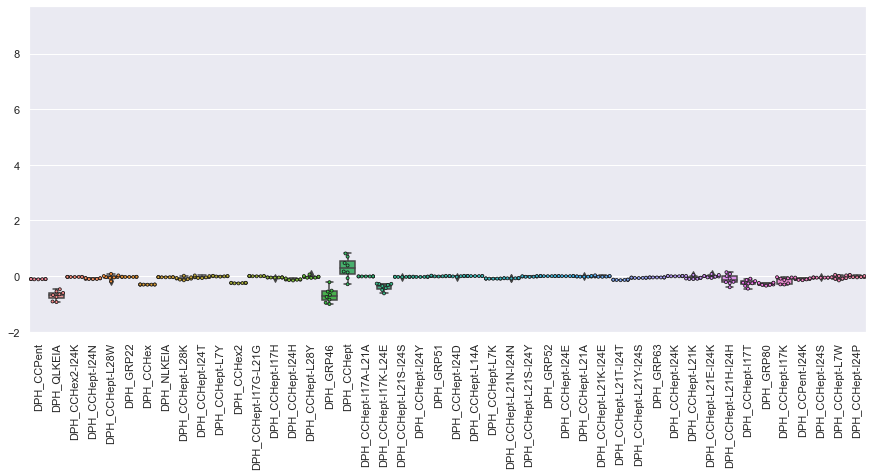

In [9]:
fa_fluor_data.display_data_distribution()

- Although the ranges of readings obtained with CCHept-I17K-L24E, GRP46 and (especially) QLKEIA are very large, there isn't much overlap between the ranges obtained for different analytes => they are providing useful signal when distinguishing between these subclasses.

Consequently, I will not discard any of the peptides from the initial dataset used for ML training.

In [10]:
fa_fluor_data.ml_fluor_data

,DPH_CCPent,DPH_QLKEIA,DPH_CCHex2-I24K,DPH_CCHept-I24N,DPH_CCHept-L28W,DPH_GRP22,DPH_CCHex,DPH_NLKEIA,DPH_CCHept-L28K,DPH_CCHept-I24T,...,DPH_CCHept-L21E-I24K,DPH_CCHept-L21H-I24H,DPH_CCHept-I17T,DPH_GRP80,DPH_CCHept-I17K,DPH_CCPent-I24K,DPH_CCHept-I24S,DPH_CCHept-L7W,DPH_CCHept-I24P,Analyte
0,1.023815,1.118110,0.754224,1.091023,1.000000,0.631851,0.838841,0.612530,0.913015,1.110212,...,0.799253,1.113330,1.313932,1.002100,0.898441,0.800250,1.135116,1.153071,1.109400,B
1,1.176017,1.040000,0.651792,1.006400,1.147716,0.656773,0.899203,0.692953,1.081371,1.259465,...,0.667876,0.773788,1.250326,0.967690,0.721541,0.780227,0.871173,1.038386,1.034988,B
2,1.005394,1.541985,0.758220,1.128030,1.095430,0.668936,0.995861,0.699115,1.055767,1.267305,...,0.651446,0.905731,1.260460,0.939336,0.746685,0.794058,0.926527,1.164184,1.044868,B
3,0.933102,1.416000,0.688626,0.969718,1.058668,0.698003,0.950435,0.618271,0.933694,1.032468,...,0.691039,0.903220,1.216427,1.079714,0.743049,0.986778,1.103498,1.107882,1.162466,B
4,0.923828,1.234483,0.776929,1.083207,1.037086,0.685776,0.950957,0.677345,0.979182,1.092526,...,0.724585,0.874715,1.252276,1.248290,0.737926,0.979461,1.011143,1.173271,1.087395,B
5,0.947699,1.090909,0.877685,1.001786,1.016905,0.698449,0.809425,0.660837,0.981239,0.940045,...,0.685703,1.012174,1.116020,0.941129,1.059001,0.734706,1.075857,1.147624,1.071844,B
6,1.042685,0.715278,0.829850,1.093504,1.162554,0.719836,0.942800,0.583652,0.990682,1.182490,...,0.701222,0.917795,1.063377,0.898983,0.803817,0.696085,0.919617,0.934237,0.935491,B
7,1.003189,0.882883,0.860887,1.151163,1.203092,0.726150,0.976632,0.630901,1.047360,1.077837,...,0.623422,0.873781,1.062473,0.944521,0.841939,0.702405,0.999619,0.957570,1.000053,B
8,1.010617,0.744444,0.790121,1.113111,1.144841,0.731933,0.980152,0.660311,1.031715,1.185479,...,0.672418,0.839465,1.090547,0.984060,0.833684,0.779988,0.995406,0.940545,1.005856,B
9,0.979174,0.981481,1.014783,1.062214,1.116195,0.744128,0.983977,0.677394,1.099882,1.041593,...,0.616931,0.897338,0.990380,1.041864,0.744580,0.867446,1.156847,0.992969,0.971107,B


#### ML analysis

In [11]:
plt.rcParams['figure.figsize'] = (10, 10)  # Sets default figure size
ml = RunML(
    results_dir='/Users/ks17361/Lab_work_Dek_Woolfson/BADASS/Small_molecule_analysis_large_array/'
                'FAs/FA_ML_plots',
    fluor_data=fa_fluor_data.ml_fluor_data.drop(['Analyte'], axis=1),
    classes=fa_fluor_data.ml_fluor_data['Analyte'].tolist(),
    subclasses=None, shuffle=False
)

- Calculate feature correlations

In [12]:
plt.rcParams['figure.figsize'] = (30, 30)  # Sets figure size

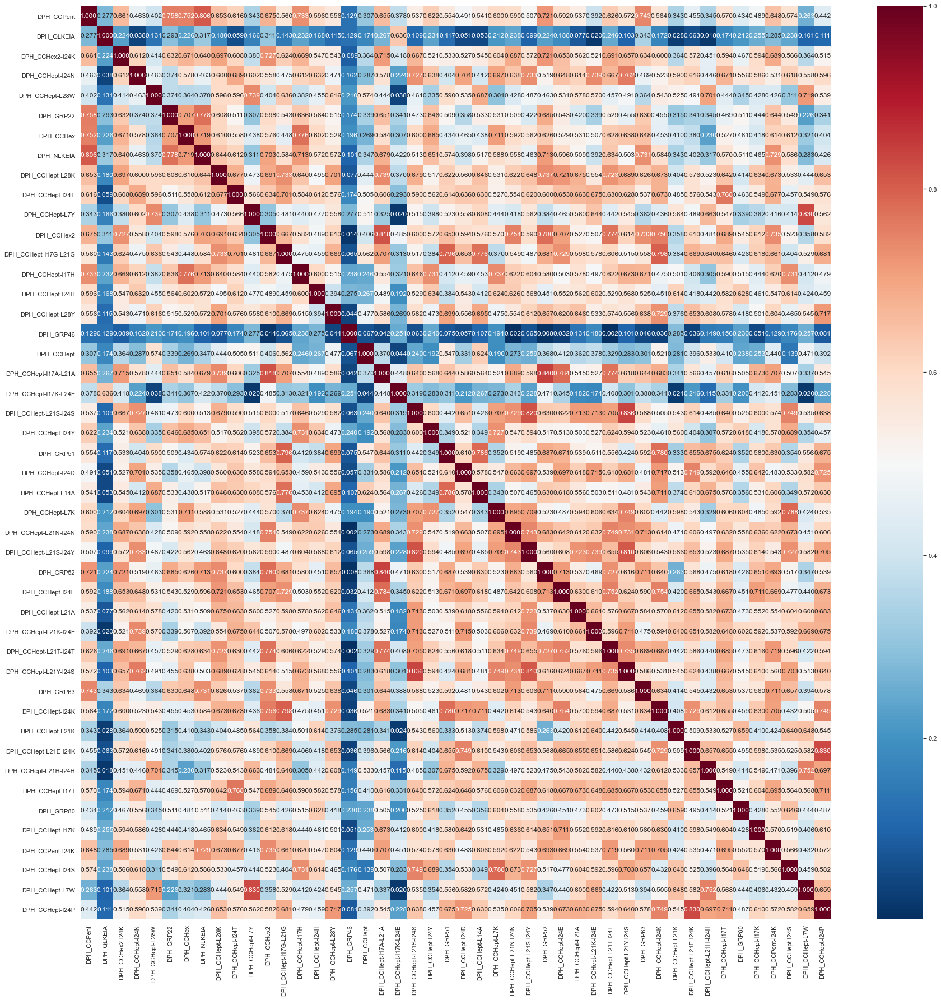

In [13]:
kendall_tau_correlation_matrix = ml.calc_feature_correlations(
    fluor_data=ml.fluor_data, correlation_coeff='kendall', plt_name='', abs_vals=True
)

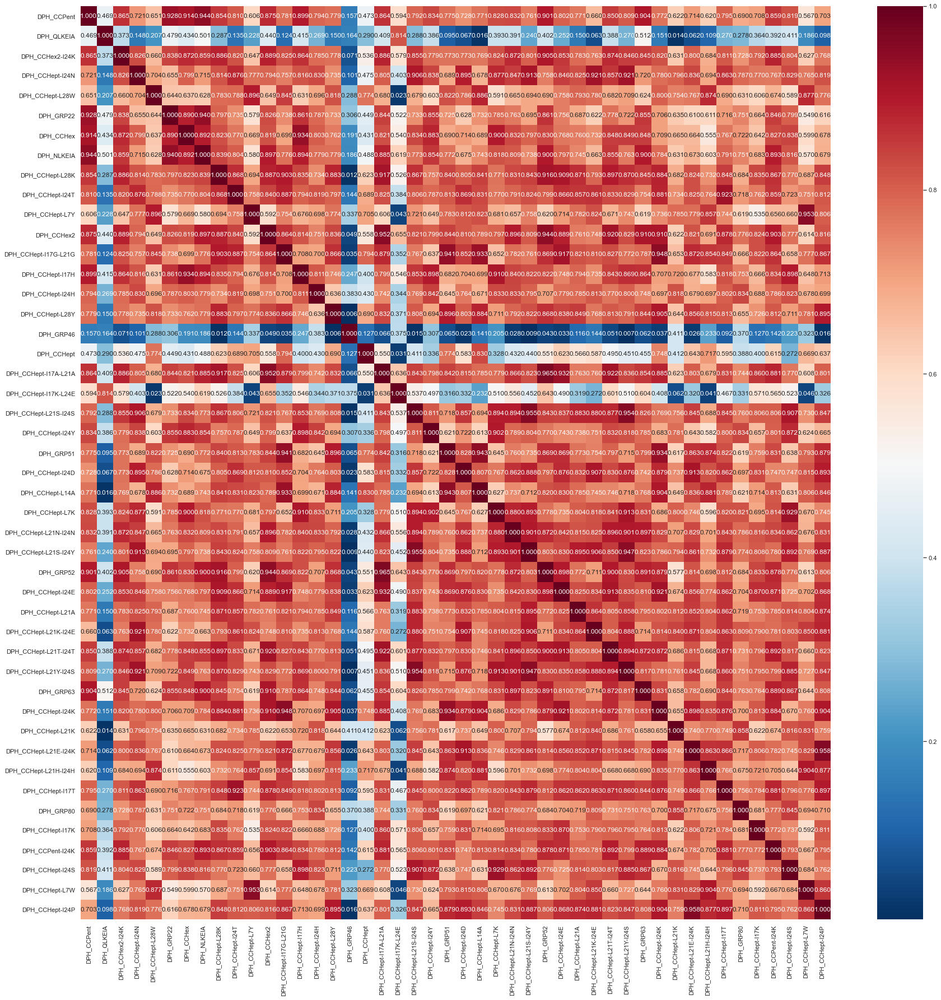

In [14]:
spearman_correlation_matrix = ml.calc_feature_correlations(
    fluor_data=ml.fluor_data, correlation_coeff='spearman', plt_name='', abs_vals=True
)

In [15]:
plt.rcParams['figure.figsize'] = (10, 10)  # Resets default figure size

- Measure the relative importances of the peptides with KBest using one-way ANOVA

<Figure size 720x720 with 0 Axes>

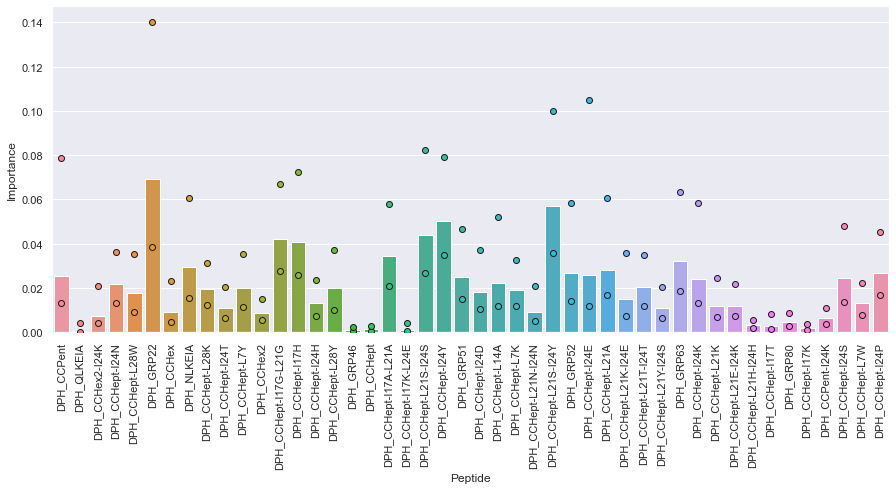

<Figure size 720x720 with 0 Axes>

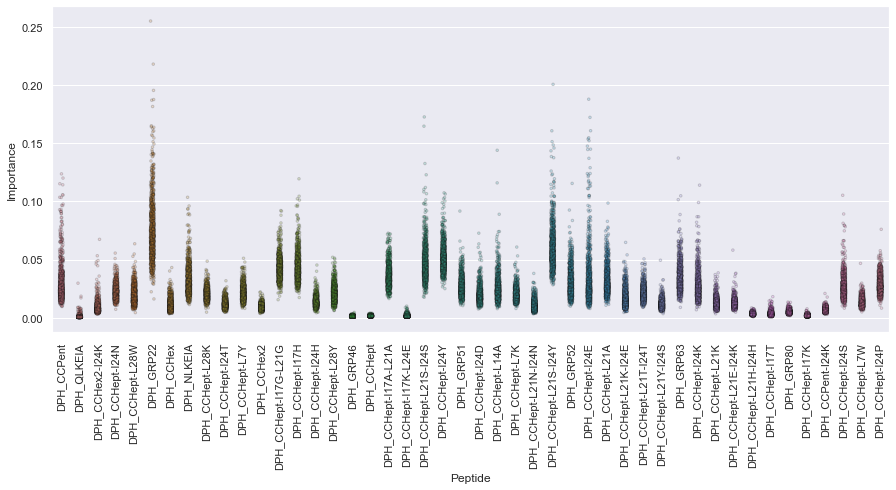

In [16]:
kbest_feat_importances_df, kbest_feat_importances_dict = ml.calc_feature_importances_kbest(
    x=ml.x, y=ml.y, features=None, method_classif='f_classif', num_repeats=1000, scale=True, plt_name=''
)

In [17]:
print('Peptides ordered by F-score:')
kbest_feat_importances_df

Peptides ordered by F-score:


,Feature,Score
0,DPH_GRP22,0.069373
1,DPH_CCHept-L21S-I24Y,0.057030
2,DPH_CCHept-I24Y,0.050462
3,DPH_CCHept-L21S-I24S,0.044135
4,DPH_CCHept-I17G-L21G,0.041947
5,DPH_CCHept-I17H,0.040865
6,DPH_CCHept-I17A-L21A,0.034491
7,DPH_GRP63,0.032017
8,DPH_NLKEIA,0.029614
9,DPH_CCHept-L21A,0.028356


KBest analysis is a univariate feature selection method, and hence assumes that the features are independent of one another (the importance scores calculated here are the F-scores from running one-way ANOVA). Consequently, the output importance scores do not reflect correlations between features - the scores represent the information provided by a feature about the output class, rather than the unique information provided by that feature alone. Therefore the most important features highlighted by this method could be providing the same information as one another.

From this analysis, unsurprisingly the two peptides identified earlier as having minimal effect upon the fluorescence of DPH (QLKEIA and CCHept-I17K-L24E), are found to be the least important, as well as GRP46 (which only has a slightly larger effect upon DPH fluorescence). In general, there is a negative correlation between a peptide's importance score and intra-class variance of its fluorescence readings. Peptides GRP22 and CCHept-L21S-I24Y have the highest importance scores.

- Measure the relative importances of the peptides with decision tree analysis

<Figure size 720x720 with 0 Axes>

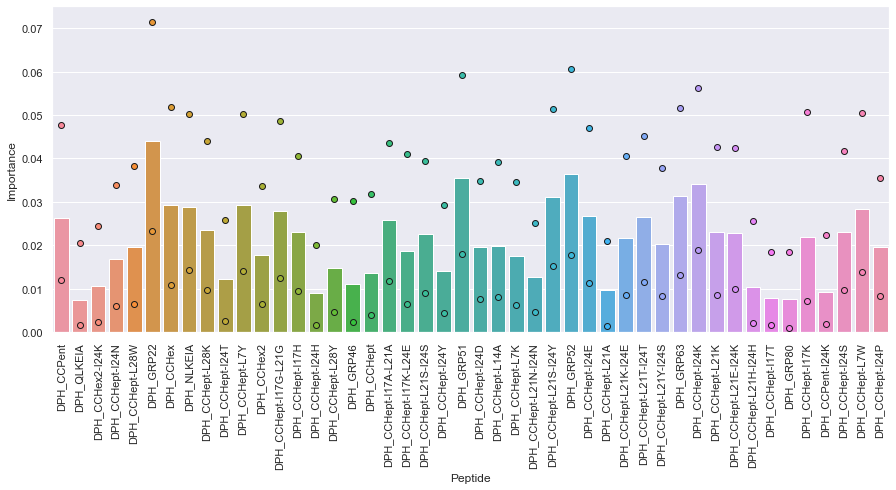

<Figure size 720x720 with 0 Axes>

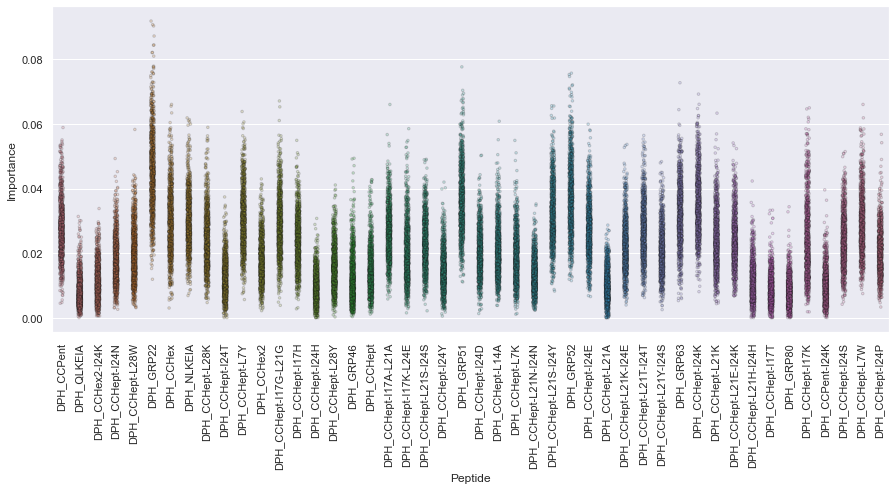

In [18]:
tree_feat_importances_df, tree_feat_importances_dict = ml.calc_feature_importances_tree(
    x=ml.x, y=ml.y, features=None, num_repeats=1000, scale=True, plt_name=''
)

In [19]:
print('Peptides ordered by importance:')
tree_feat_importances_df

Peptides ordered by importance:


,Feature,Score
0,DPH_GRP22,0.044082
1,DPH_GRP52,0.036516
2,DPH_GRP51,0.035590
3,DPH_CCHept-I24K,0.034115
4,DPH_GRP63,0.031445
5,DPH_CCHept-L21S-I24Y,0.031027
6,DPH_CCHept-L7Y,0.029381
7,DPH_CCHex,0.029369
8,DPH_NLKEIA,0.028878
9,DPH_CCHept-L7W,0.028341


In this method, an ExtraTrees classifier is used to calculate importance scores. The ExtraTrees classifier trains multiple decision trees on the data. Each tree is trained with a random subset of features on a random subset of dataset, the results of these trees are then averaged to make a prediction. Importance scores are calculated as the 
average increase in purity achieved when using a particular feature to split the data across all trees in which that feature is included (i.e. the Gini importance score of the feature). When looking at the Gini importance scores of features in individual trees, correlations between the included features are reflected in the scores. However, as more and more trees, incorporating different subsets of features, are included in the average, feature correlations have less of an effect upon the importance scores. The  number of trees (plus bootstrap repeats) included here means that the correlation between features will have little effect upon the importance scores.

Whilst the results obtained using the two different methods are not identical, there is good agreement between the barrels identified as most important by the ExtraTrees classifier and the KBest analysis above. There is some variation in the relative order of the less important barrels, but this is not unexpected as the scores are all fairly low and similar to one another (=> small changes in score can lead to larger changes in relative order).

- Measure the relative importances of the peptides with permutation analysis

<Figure size 720x720 with 0 Axes>

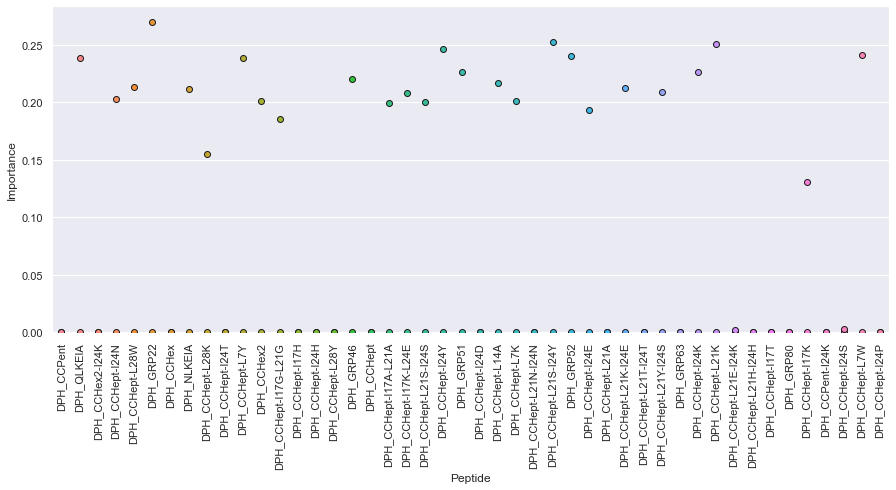

<Figure size 720x720 with 0 Axes>

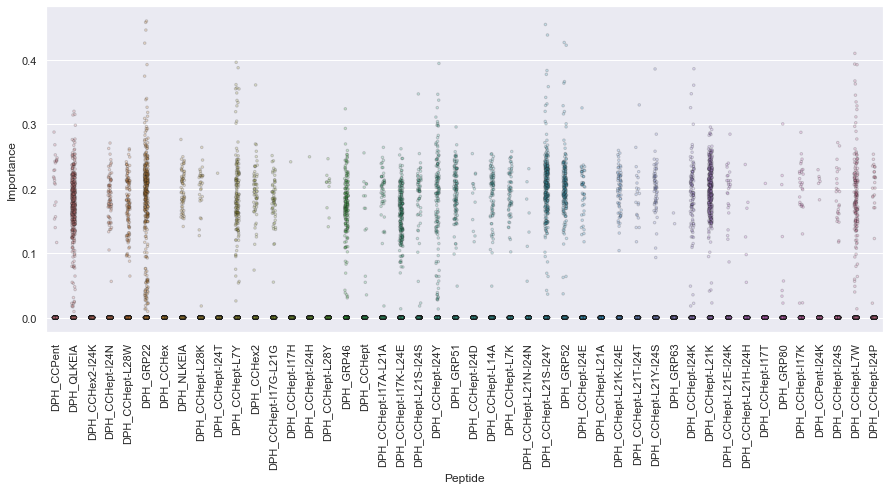

In [20]:
f1 = make_scorer(f1_score, average='weighted')
permut_feat_importances_df, permut_feat_importances_dict = ml.calc_feature_importances_permutation(
    x=ml.x, y=ml.y, features=None, classifier=AdaBoostClassifier,
    parameters={'n_estimators': np.array([10, 30, 100, 300, 1000])}, model_metric=f1, num_repeats=1000,
    scale=True, plt_name=''
)

In [21]:
print('Peptides ordered by median importance:')
permut_feat_importances_df

Peptides ordered by median importance:


,Feature,Score
0,DPH_CCPent,0.0
1,DPH_GRP63,0.0
2,DPH_CCHept-L7K,0.0
3,DPH_CCHept-L21N-I24N,0.0
4,DPH_CCHept-L21S-I24Y,0.0
5,DPH_GRP52,0.0
6,DPH_CCHept-I24E,0.0
7,DPH_CCHept-L21A,0.0
8,DPH_CCHept-L21K-I24E,0.0
9,DPH_CCHept-L21T-I24T,0.0


In [22]:
mean_permut_feat_importances_df = OrderedDict({})
for feat, score_list in permut_feat_importances_dict.items():
    mean_permut_feat_importances_df[feat] = np.mean(score_list)
mean_permut_feat_importances_df = pd.DataFrame({'Feature': list(mean_permut_feat_importances_df.keys()),
                                                'Score': list(mean_permut_feat_importances_df.values())})
mean_permut_feat_importances_df = mean_permut_feat_importances_df.sort_values(
    by=['Score'], axis=0, ascending=False
).reset_index(drop=True)

In [23]:
print('Peptides ordered by mean importance:')
mean_permut_feat_importances_df

Peptides ordered by mean importance:


,Feature,Score
0,DPH_QLKEIA,0.074065
1,DPH_CCHept-L21K,0.070798
2,DPH_GRP22,0.066732
3,DPH_CCHept-L21S-I24Y,0.060564
4,DPH_GRP52,0.039426
5,DPH_CCHept-I17K-L24E,0.034076
6,DPH_CCHept-L7Y,0.031185
7,DPH_GRP46,0.030731
8,DPH_CCHept-L7W,0.030620
9,DPH_CCHept-I24Y,0.025834


In permutation analysis, importance scores are calculated by training two ML models (in this case I have selected LinearSVC classifiers). The first model is trained using all features, the second is trained with one of the features randomly scrambled: the importance score of the feature is then calculated as the difference in performance (in this case measured via model F1 score) between the two models. Hence this method does take into account correlations between features, and the output importance scores represent the unique information that a feature provides about the output class label.

None of the peptides are identified as providing much unique information. Interestingly, the peptides identified as being the least important by the previous two methods are identified as two of the peptides that provide the most unique information via permutation analysis. However, the peptides identified as being important by KBest and ExtraTrees classifier also have some of the highest importance scores by permutation analysis. If you look at the box plots above, this result is perhaps not so surprising as it initially appears - the box plots for most of the peptides look fairly similar to one another, but those of QLKEIA, CCHept-I17K-L24E, CCHept and GRP46 are visibly different. This result therefore clearly highlights the difference of the first two feature importance methods, that calculate the information which each individual feature provides about the output class labels (i.e. these methods do not take account of feature correlation), from permutation analysis, which measures the unique information provided by a feature (and of course that unique information is often, but not necessarily, the most useful information for distinguishing class labels).

- What percentage of the signal in the data can be measured by N principal components?

(Can only run PCA if the number of features is less than or equal to the number of samples. So, need to discard a barrel - have arbitrarily selected CCHept-L28Y, as it is not identified as an especially important barrel by any of the three methods.)

/opt/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


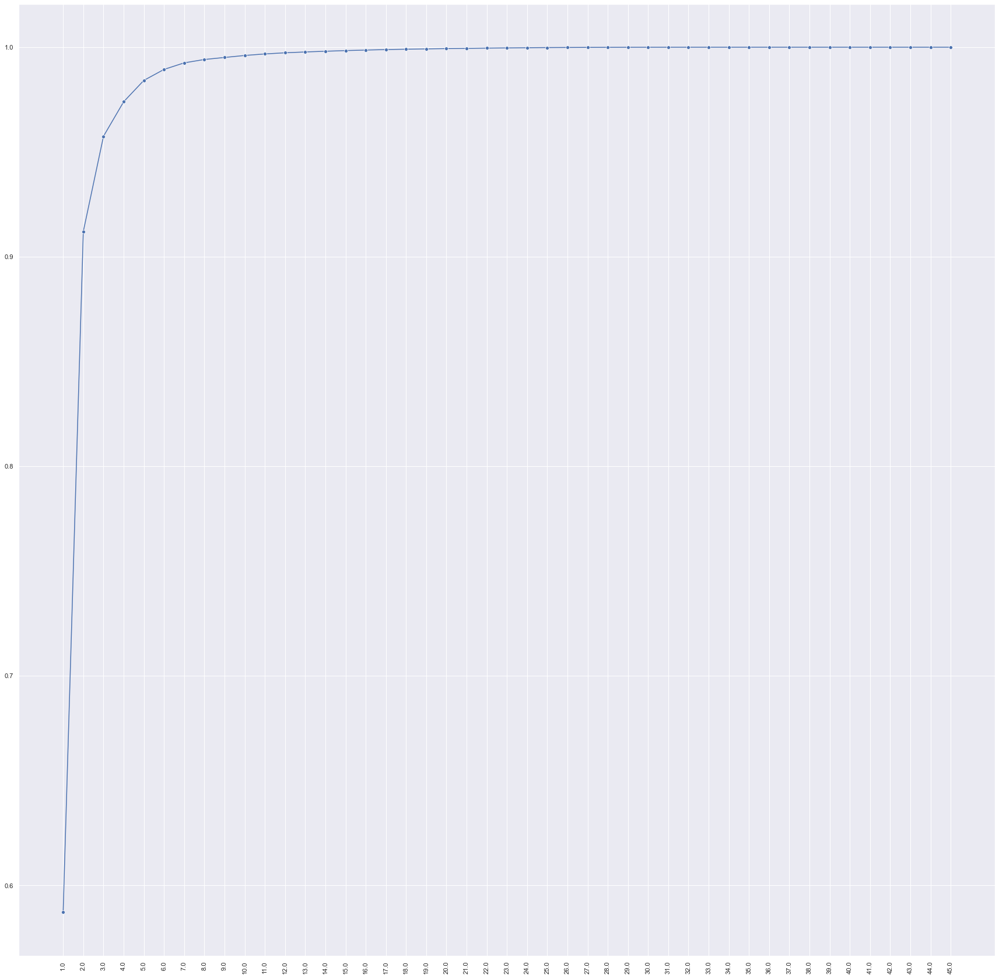

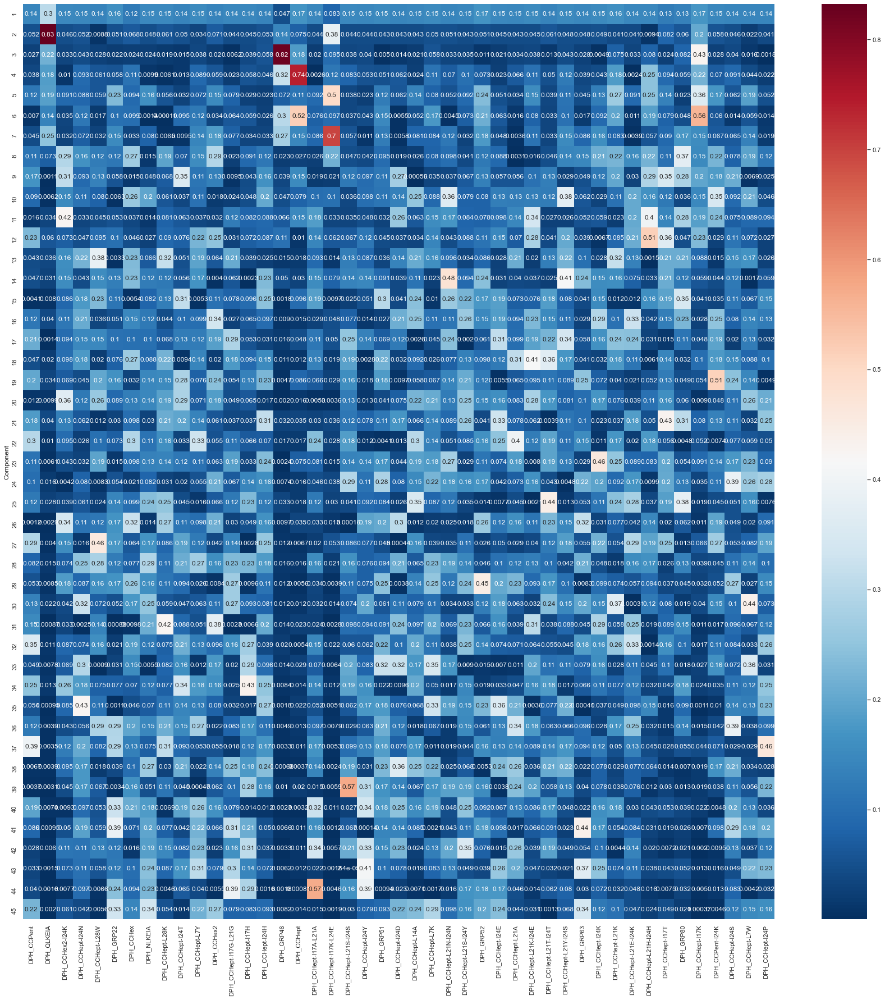

In [24]:
plt.rcParams['figure.figsize'] = (30, 30)  # Sets figure size
pca_model, pca_components = ml.run_pca(
    fluor_data=ml.fluor_data.drop(['DPH_CCHept-L28Y'], axis=1), scale=True, plt_name=''
)
plt.rcParams['figure.figsize'] = (10, 10)  # Resets default figure size

~95% of the variance in the data can be represented by just three principal components. Lots of different peptides make a contribution to the first principal component; whereas barrels QLKEIA and CCHept-I17K-L24E make the largest contributions to component 2. 

Scatter plots of data transformed to PCA dimensions

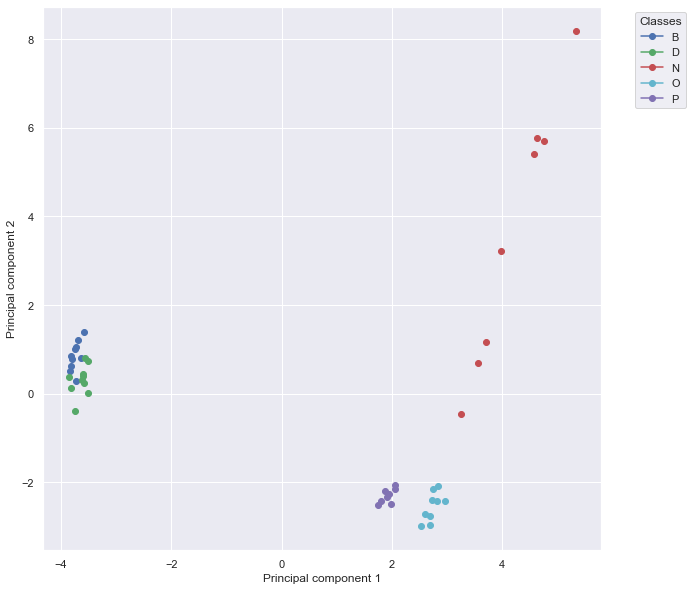

In [25]:
ml.plot_scatter_on_pca_axes(
    x=ml.fluor_data.drop(['DPH_CCHept-L28Y'], axis=1).to_numpy(), y=ml.y, subclasses=None,
    num_dimensions=2, scale=True, plt_name=''
)

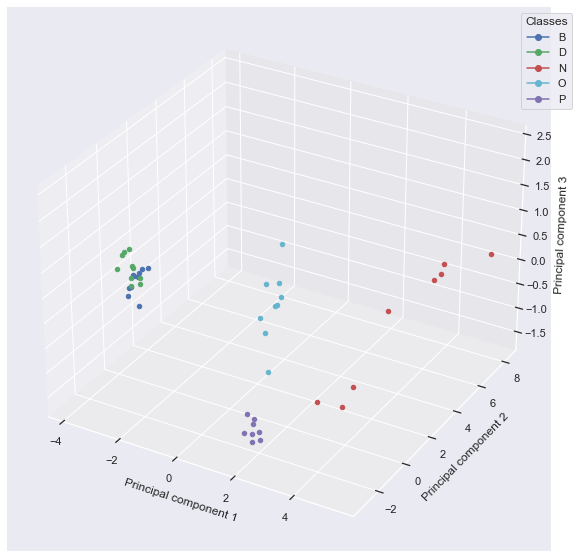

In [26]:
ml.plot_scatter_on_pca_axes(
    x=ml.fluor_data.drop(['DPH_CCHept-L28Y'], axis=1).to_numpy(), y=ml.y, subclasses=None,
    num_dimensions=3, scale=True, plt_name=''
)

As expected based from the earlier scatter and box plots of fluorescence readings, the fatty acid classes are readily distinguishable from one another by eye => expect the trained models to achieve close to 100% accuracy.

#### How well does a model trained with all features perform?

Runs grid search with nested cross-validation to spot check 5 different ML algorithms. Inner loop identifies the optimal parameter values to use with the ML algorithm; outer loop measures the performance of a model trained using these parameter values.

In [27]:
algorithms = [KNeighborsClassifier, GaussianNB, LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.

n_components_pca = None
inner_splits = None
outer_splits = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 3
cv_folds_outer_loop = 5
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs={accuracy_score: {},
                    recall_score: {'average': 'weighted',
                                   'zero_division': 0},
                    precision_score: {'average': 'weighted',
                                      'zero_division': 0},
                    f1_score: {'average': 'weighted',
                               'zero_division': 0}}

all_feat_searches = OrderedDict({})
all_feat_score_dict = OrderedDict({'Algorithm': [],
                                   'Resampling_method': [],
                                   'Average_accuracy': [],
                                   'Std_dev_accuracy': [],
                                   'Average_recall': [],
                                   'Std_dev_recall': [],
                                   'Average_precision': [],
                                   'Std_dev_precision': [],
                                   'Average_f1': [],
                                   'Std_dev_f1': [],})
for algorithm in algorithms:
    for resampling_method in resampling_methods:
        fixed_params = ml.define_fixed_model_params(classifier=algorithm())
        if algorithm.__name__ in ['LinearSVC', 'SVC', 'AdaBoostClassifier']:
            fixed_params['random_state'] = 1
        tuned_params = ml.define_tuned_model_params(
            classifier=algorithm(), x_train=ml.x[int(math.floor(0.64*ml.x.shape[0])),:],
            n_folds=cv_folds_inner_loop
        )
        nested_cv_search = ml.run_nested_CV(
            clf=algorithm, x=ml.x, y=ml.y, groups=None, selected_features=list(ml.features),
            inner_splits=inner_splits, outer_splits=outer_splits, const_split=True,
            resampling_method=resampling_method, n_components_pca=n_components_pca, run=run,
            fixed_params=fixed_params, tuned_params=tuned_params, train_scoring_metric=train_scoring_metric,
            test_scoring_funcs=test_scoring_funcs, n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
            cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
        )

        all_feat_searches[
            '{}__{}'.format(algorithm.__name__, resampling_method)
        ] = copy.deepcopy(nested_cv_search)

        all_feat_score_dict['Algorithm'].append(algorithm.__name__)
        all_feat_score_dict['Resampling_method'].append(resampling_method)
        all_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
        all_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
        all_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
        all_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
        all_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
        all_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
        all_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
        all_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])

        for index, params in enumerate(nested_cv_search['outer_loop_params']):
            print('\n\n\n')
            print('{}: {}'.format(algorithm.__name__, resampling_method))
            print('Parameters: {}'.format(params))
            print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][index]))
            print('F1: {}'.format(nested_cv_search['test_scores']['f1'][index]))





KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'uniform')])
Accuracy: 1.0
F1: 1.0




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'uniform')])
Accuracy: 1.0
F1: 1.0




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'uniform')])
Accuracy: 1.0
F1: 1.0




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'uniform')])
Accuracy: 1.0
F1: 1.0




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'uniform')])
Accuracy: 1.0
F1: 1.0




GaussianNB: no_balancing
Parameters: OrderedDict()
Accuracy: 1.0
F1: 1.0




GaussianN

In [28]:
all_feat_score_df = pd.DataFrame(all_feat_score_dict)

In [29]:
all_feat_score_df

,Algorithm,Resampling_method,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,KNeighborsClassifier,no_balancing,1.000000,0.000000,1.000000,0.000000,1.0,0.000000,1.000000,0.000000
1,GaussianNB,no_balancing,1.000000,0.000000,1.000000,0.000000,1.0,0.000000,1.000000,0.000000
2,LinearSVC,no_balancing,1.000000,0.000000,1.000000,0.000000,1.0,0.000000,1.000000,0.000000
3,SVC,no_balancing,1.000000,0.000000,1.000000,0.000000,1.0,0.000000,1.000000,0.000000
4,AdaBoostClassifier,no_balancing,0.888889,0.070273,0.888889,0.070273,0.9,0.101835,0.874815,0.088592


In [30]:
with open('{}/All_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((all_feat_searches, all_feat_score_df), f)

As might be predicted given that the classes can be readily separated by eye on PCA plots, almost all of the models make 100% correct predictions (consequently, in spite of the small dataset size, the standard deviations of the metrics used to measure model performance are small/0). Take GaussianNB model forwards as it is the simplest of those best-performing models (no parameter optimisation was performed for GaussianNB).

In [31]:
all_feat_searches['GaussianNB__no_balancing']['outer_loop_params']

[OrderedDict(), OrderedDict(), OrderedDict(), OrderedDict(), OrderedDict()]

In [32]:
all_feat_searches['GaussianNB__no_balancing']['best_outer_loop_params']

OrderedDict([('accuracy', OrderedDict()),
             ('recall', OrderedDict()),
             ('precision', OrderedDict()),
             ('f1', OrderedDict())])

In [33]:
all_feat_searches['GaussianNB__no_balancing']['test_scores']['accuracy']

[1.0, 1.0, 1.0, 1.0, 1.0]

In [34]:
all_feat_nested_pred = all_feat_searches['GaussianNB__no_balancing']['predictions']
all_feat_nested_y_true = all_feat_searches['GaussianNB__no_balancing']['y_true']
all_feat_nested_x_true = all_feat_searches['GaussianNB__no_balancing']['x_true']

all_feat_flat_pred = np.array([pred for pred_array in all_feat_nested_pred for pred in pred_array])
all_feat_flat_y_true = np.array([y for y_array in all_feat_nested_y_true for y in y_array])
all_feat_flat_x_true = np.array([x for x_array in all_feat_nested_x_true for x in x_array])

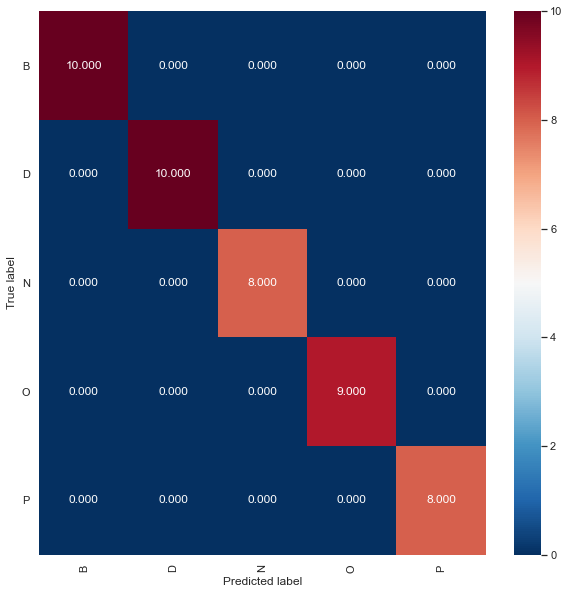

Normalised over true label (rows)


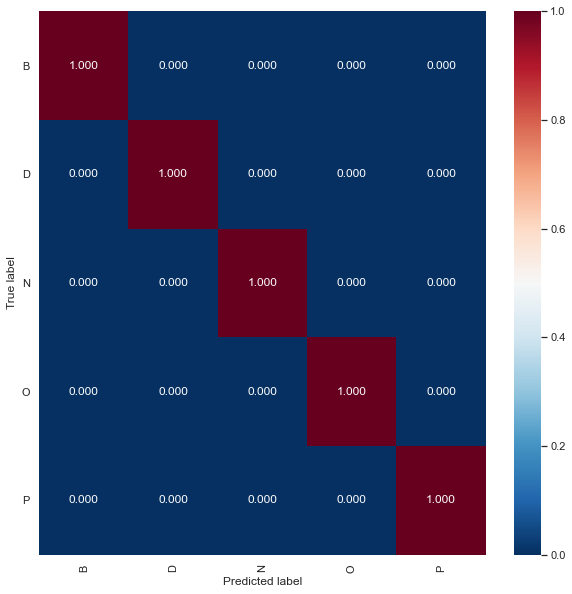

Normalised over pred label (columns)


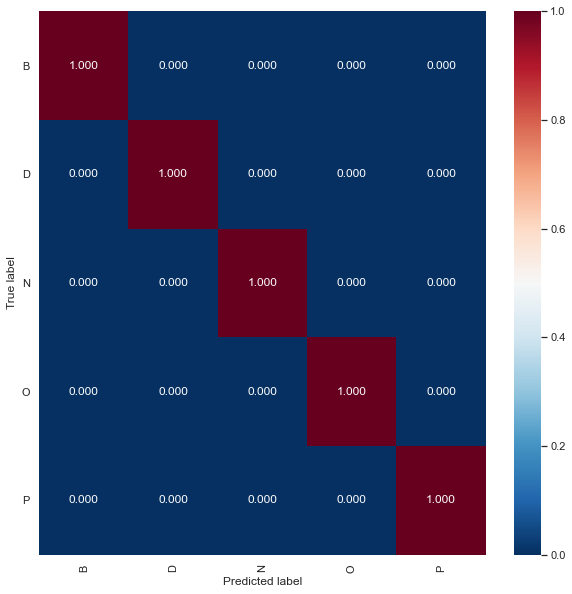

In [35]:
draw_conf_matrices(all_feat_flat_y_true, all_feat_flat_pred, ml.results_dir, 'All_features')

In [36]:
all_feat_true_hue = []
for index, y in enumerate(all_feat_flat_y_true):
    if all_feat_flat_pred[index] == y:
        all_feat_true_hue.append('{}_correct'.format(y))
    else:
        all_feat_true_hue.append('{}_incorrect'.format(y))

sub_all_feat_true_hue = []
sub_all_feat_flat_x_true = []
sub_all_feat_flat_y_true = []
for i, true_hue in enumerate(all_feat_true_hue):
    if true_hue.endswith('_incorrect'):
        sub_all_feat_true_hue.append(true_hue)
        sub_all_feat_flat_x_true.append(all_feat_flat_x_true[i])
        sub_all_feat_flat_y_true.append(all_feat_flat_y_true[i])

all_feat_true_hue = np.array(all_feat_true_hue)
sub_all_feat_true_hue = np.array(sub_all_feat_true_hue)
sub_all_feat_flat_x_true = np.array(sub_all_feat_flat_x_true)
sub_all_feat_flat_y_true = np.array(sub_all_feat_flat_y_true)

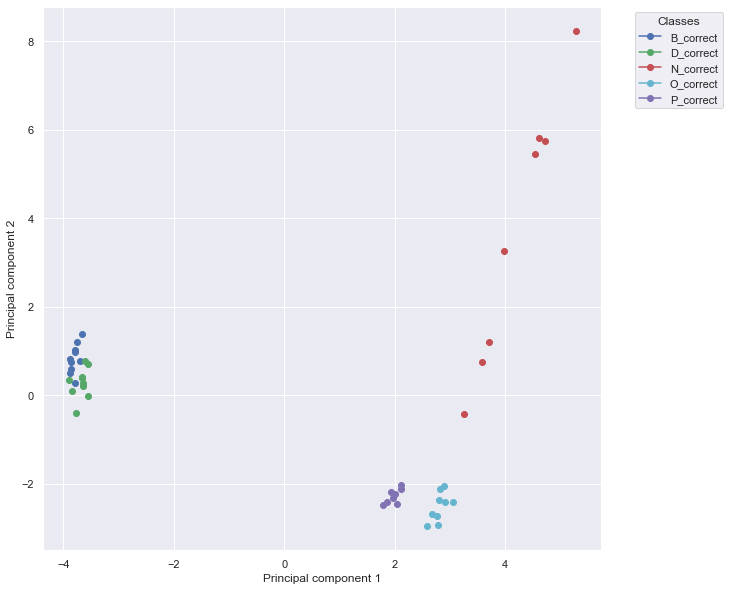

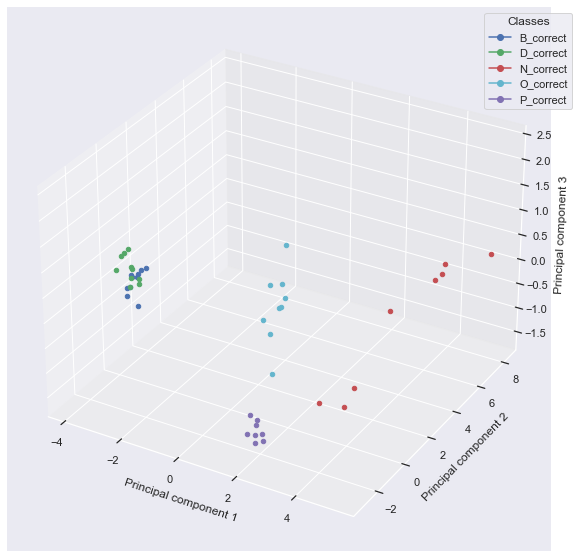

In [37]:
# Scatter plot (axes = top two principal components)
ml.plot_scatter_on_pca_axes(
    x=all_feat_flat_x_true, y=all_feat_flat_y_true, subclasses=all_feat_true_hue, num_dimensions=2,
    scale=True, plt_name='All_features_coloured_by_pred'
)

# Scatter plot (axes = top three principal components)
ml.plot_scatter_on_pca_axes(
    x=all_feat_flat_x_true, y=all_feat_flat_y_true, subclasses=all_feat_true_hue, num_dimensions=3,
    scale=True, plt_name='All_features_coloured_by_pred'
)

# B_incorrect = Value that is actually butanoic acid is predicted to be something else

It is easily possible to train an ML model to distinguish between the five fatty acid classes with 100% accuracy.

#### Is it possible to maintain/improve model performance when reducing the number of peptides?

Sequentially include features via their feature importance (as measured via KBest/permutation analysis), measure if there is any difference in trained classifier performance.

In [38]:
algorithms = [KNeighborsClassifier, GaussianNB, LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~ balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.
num_features_list = [1, 2, 3, 4, 5, 10, 15, 20, 30, 46]

ordered_features = {'KBest_Fscore': kbest_feat_importances_df['Feature'].tolist(),
                    'Permutation_score': mean_permut_feat_importances_df['Feature'].tolist()}

n_components_pca = None
inner_splits = None
outer_splits = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 3
cv_folds_outer_loop = 5
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs={accuracy_score: {},
                    recall_score: {'average': 'weighted',
                                   'zero_division': 0},
                    precision_score: {'average': 'weighted',
                                      'zero_division': 0},
                    f1_score: {'average': 'weighted',
                               'zero_division': 0}}

red_feat_searches = OrderedDict({})
red_feat_score_dict = OrderedDict({'Algorithm': [],
                                   'Resampling_method': [],
                                   'Feature_selection_method': [],
                                   'Num_features': [],
                                   'Average_accuracy': [],
                                   'Std_dev_accuracy': [],
                                   'Average_recall': [],
                                   'Std_dev_recall': [],
                                   'Average_precision': [],
                                   'Std_dev_precision': [],
                                   'Average_f1': [],
                                   'Std_dev_f1': [],})
for algorithm in algorithms:
    for resampling_method in resampling_methods:
        for feat_method, all_features in ordered_features.items():
            for num_features in num_features_list:
                fixed_params = ml.define_fixed_model_params(classifier=algorithm())
                if algorithm.__name__ in ['LinearSVC', 'SVC', 'AdaBoostClassifier']:
                    fixed_params['random_state'] = 1
                tuned_params = ml.define_tuned_model_params(
                    classifier=algorithm(), x_train=ml.x[int(math.floor(0.64*ml.x.shape[0])),:],
                    n_folds=cv_folds_inner_loop
                )
                selected_features = all_features[:num_features]

                nested_cv_search = ml.run_nested_CV(
                    clf=algorithm, x=ml.x, y=ml.y, groups=None, selected_features=selected_features,
                    inner_splits=inner_splits, outer_splits=outer_splits, const_split=True,
                    resampling_method=resampling_method, n_components_pca=n_components_pca, run=run,
                    fixed_params=fixed_params, tuned_params=tuned_params,
                    train_scoring_metric=train_scoring_metric, test_scoring_funcs=test_scoring_funcs,
                    n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
                    cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
                )

                red_feat_searches[
                    '{}__{}__{}__{}'.format(algorithm.__name__, resampling_method, feat_method, num_features)
                ] = copy.deepcopy(nested_cv_search)

                red_feat_score_dict['Algorithm'].append(algorithm.__name__)
                red_feat_score_dict['Resampling_method'].append(resampling_method)
                red_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
                red_feat_score_dict['Feature_selection_method'].append(feat_method)
                red_feat_score_dict['Num_features'].append(num_features)
                red_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
                red_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
                red_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
                red_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
                red_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
                red_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
                red_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])

                for index, params in enumerate(nested_cv_search['outer_loop_params']):
                    print('\n\n\n')
                    print('{}: {},  {},  {}'.format(
                        algorithm.__name__, resampling_method, feat_method, num_features
                    ))
                    print('Parameters: {}'.format(params))
                    print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][index]))
                    print('F1: {}'.format(nested_cv_search['test_scores']['f1'][index]))






KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.5555555555555556
F1: 0.5555555555555556




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 3), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.7777777777777778
F1: 0.7037037037037037




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.8888888888888888
F1: 0.8444444444444444




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 3), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.6666666666666666
F1: 0.5925925925925926




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: Ordere





KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'uniform')])
Accuracy: 1.0
F1: 1.0




KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'uniform')])
Accuracy: 1.0
F1: 1.0




KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'uniform')])
Accuracy: 1.0
F1: 1.0




KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'uniform')])
Accuracy: 1.0
F1: 1.0




KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'uniform')])
Accuracy: 1.





KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'uniform')])
Accuracy: 1.0
F1: 1.0




KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'uniform')])
Accuracy: 1.0
F1: 1.0




KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'uniform')])
Accuracy: 1.0
F1: 1.0




KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'uniform')])
Accuracy: 1.0
F1: 1.0




KNeighborsClassifier: no_balancing,  Permutation_score,  15
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 





GaussianNB: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict()
Accuracy: 1.0
F1: 1.0




GaussianNB: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict()
Accuracy: 1.0
F1: 1.0




GaussianNB: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict()
Accuracy: 1.0
F1: 1.0




GaussianNB: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict()
Accuracy: 1.0
F1: 1.0




GaussianNB: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict()
Accuracy: 1.0
F1: 1.0




GaussianNB: no_balancing,  Permutation_score,  1
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5111111111111111




GaussianNB: no_balancing,  Permutation_score,  1
Parameters: OrderedDict()
Accuracy: 0.7777777777777778
F1: 0.6962962962962963




GaussianNB: no_balancing,  Permutation_score,  1
Parameters: OrderedDict()
Accuracy: 0.6666666666666666
F1: 0.6455026455026455




GaussianNB: no_balancing,  Permutation_score,  1
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.48888888





LinearSVC: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 1024.0)])
Accuracy: 1.0
F1: 1.0




LinearSVC: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 256.0)])
Accuracy: 1.0
F1: 1.0




LinearSVC: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 64.0)])
Accuracy: 0.7777777777777778
F1: 0.7222222222222222




LinearSVC: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 64.0)])
Accuracy: 1.0
F1: 1.0




LinearSVC: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 64.0)])
Accuracy: 1.0
F1: 1.0




LinearSVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 2048.0)])
Accuracy: 0.8888888888888888
F1: 0.8888888888888888




LinearSVC: no_balancing,  KBest_Fscore,  5
Parameters: 





LinearSVC: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 256.0)])
Accuracy: 0.7777777777777778
F1: 0.7777777777777778




LinearSVC: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 4.0)])
Accuracy: 0.8888888888888888
F1: 0.8888888888888888




LinearSVC: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 4.0)])
Accuracy: 0.8888888888888888
F1: 0.8888888888888888




LinearSVC: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 1.0)])
Accuracy: 0.8888888888888888
F1: 0.8814814814814815




LinearSVC: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 1024.0)])
Accuracy: 1.0
F1: 1.0




LinearSVC: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('dual', False), ('random_state', 1), ('C', 128.

Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125


Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125


Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125


Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125


Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125






LinearSVC: no_balancing,  Permutation_score,  30
Parameters: OrderedDic

Range tested: [3.0517578125e-05, 6.103515625e-05, 0.0001220703125, 0.000244140625, 0.00048828125, 0.0009765625, 0.001953125, 0.00390625, 0.0078125, 0.015625, 0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0]
Value selected: 8.0






SVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('random_state', 1), ('C', 64.0), ('gamma', 8.0), ('kernel', 'rbf')])
Accuracy: 1.0
F1: 1.0




SVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('random_state', 1), ('C', 512.0), ('gamma', 8.0), ('kernel', 'rbf')])
Accuracy: 1.0
F1: 1.0




SVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('random_state', 1), ('C', 512.0), ('gamma', 8.0), ('kernel', 'rbf')])
Accuracy: 1.0
F1: 1.0




SVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('random_state', 1), ('C', 32.0), ('gamma', 8.0), ('kernel', 'rbf')])
Accuracy: 1.0
F1: 1.0




SVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('random_state', 1), ('C', 64.0), ('gamma', 8.0), ('kernel', 'rbf

Range tested: [3.0517578125e-05, 6.103515625e-05, 0.0001220703125, 0.000244140625, 0.00048828125, 0.0009765625, 0.001953125, 0.00390625, 0.0078125, 0.015625, 0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0]
Value selected: 8.0


Range tested: [3.0517578125e-05, 6.103515625e-05, 0.0001220703125, 0.000244140625, 0.00048828125, 0.0009765625, 0.001953125, 0.00390625, 0.0078125, 0.015625, 0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0]
Value selected: 8.0


Range tested: [3.0517578125e-05, 6.103515625e-05, 0.0001220703125, 0.000244140625, 0.00048828125, 0.0009765625, 0.001953125, 0.00390625, 0.0078125, 0.015625, 0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0]
Value selected: 8.0


Range tested: [3.0517578125e-05, 6.103515625e-05, 0.0001220703125, 0.000244140625, 0.00048828125, 0.0009765625, 0.001953125, 0.00390625, 0.0078125, 0.015625, 0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0]
Value selected: 8.0


Range tested: [3.0517578125e-05, 6.103515625e-05, 0.00012207

Range tested: [3.0517578125e-05, 6.103515625e-05, 0.0001220703125, 0.000244140625, 0.00048828125, 0.0009765625, 0.001953125, 0.00390625, 0.0078125, 0.015625, 0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0]
Value selected: 8.0






SVC: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('C', 2.0), ('gamma', 1.0), ('kernel', 'rbf')])
Accuracy: 0.6666666666666666
F1: 0.5851851851851851




SVC: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('C', 8.0), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 0.7777777777777778
F1: 0.6962962962962963




SVC: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('C', 8.0), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 0.5555555555555556
F1: 0.48148148148148145




SVC: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('C', 1.0), ('gamma', 8.0), ('kernel', 'rbf')])
Accuracy: 0.5555555555555556
F1: 0.47407407407





SVC: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('random_state', 1), ('C', 0.5), ('gamma', 0.125), ('kernel', 'rbf')])
Accuracy: 1.0
F1: 1.0




SVC: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('random_state', 1), ('C', 0.5), ('gamma', 0.125), ('kernel', 'rbf')])
Accuracy: 1.0
F1: 1.0




SVC: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('random_state', 1), ('C', 0.5), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 1.0
F1: 1.0




SVC: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('random_state', 1), ('C', 0.5), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 1.0
F1: 1.0




SVC: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('random_state', 1), ('C', 0.5), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 1.0
F1: 1.0




AdaBoostClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.5555555555555556
F1: 0.4232804232804233







AdaBoostClassifier: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 316)])
Accuracy: 0.8888888888888888
F1: 0.8888888888888888




AdaBoostClassifier: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.7777777777777778
F1: 0.7222222222222222




AdaBoostClassifier: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.8888888888888888
F1: 0.8814814814814815




AdaBoostClassifier: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 1.0
F1: 1.0




AdaBoostClassifier: no_balancing,  KBest_Fscore,  46
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 1.0
F1: 1.0




AdaBoostClassifier: no_balancing,  Permutation_score,  1
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.4444444444444444
F1: 0.333





AdaBoostClassifier: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.7777777777777778
F1: 0.7962962962962963




AdaBoostClassifier: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.7777777777777778
F1: 0.7222222222222222




AdaBoostClassifier: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.8888888888888888
F1: 0.8814814814814815




AdaBoostClassifier: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 3162)])
Accuracy: 1.0
F1: 1.0




AdaBoostClassifier: no_balancing,  Permutation_score,  46
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 1.0
F1: 1.0


In [39]:
red_feat_score_df = pd.DataFrame(red_feat_score_dict)

In [40]:
red_feat_score_df

,Algorithm,Resampling_method,Feature_selection_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,KNeighborsClassifier,no_balancing,KBest_Fscore,1,0.755556,0.129577,0.755556,0.129577,0.681481,0.116181,0.708148,0.121500
1,KNeighborsClassifier,no_balancing,KBest_Fscore,2,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000
2,KNeighborsClassifier,no_balancing,KBest_Fscore,3,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000
3,KNeighborsClassifier,no_balancing,KBest_Fscore,4,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000
4,KNeighborsClassifier,no_balancing,KBest_Fscore,5,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
95,AdaBoostClassifier,no_balancing,Permutation_score,10,0.955556,0.054433,0.955556,0.054433,0.974074,0.032288,0.954074,0.056296
96,AdaBoostClassifier,no_balancing,Permutation_score,15,0.933333,0.054433,0.933333,0.054433,0.959259,0.033945,0.930370,0.056917
97,AdaBoostClassifier,no_balancing,Permutation_score,20,0.888889,0.099381,0.888889,0.099381,0.911111,0.108866,0.880000,0.110184
98,AdaBoostClassifier,no_balancing,Permutation_score,30,0.955556,0.054433,0.955556,0.054433,0.974074,0.032288,0.954074,0.056296


In [41]:
with open('{}/Red_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((red_feat_searches, all_feat_score_df), f)

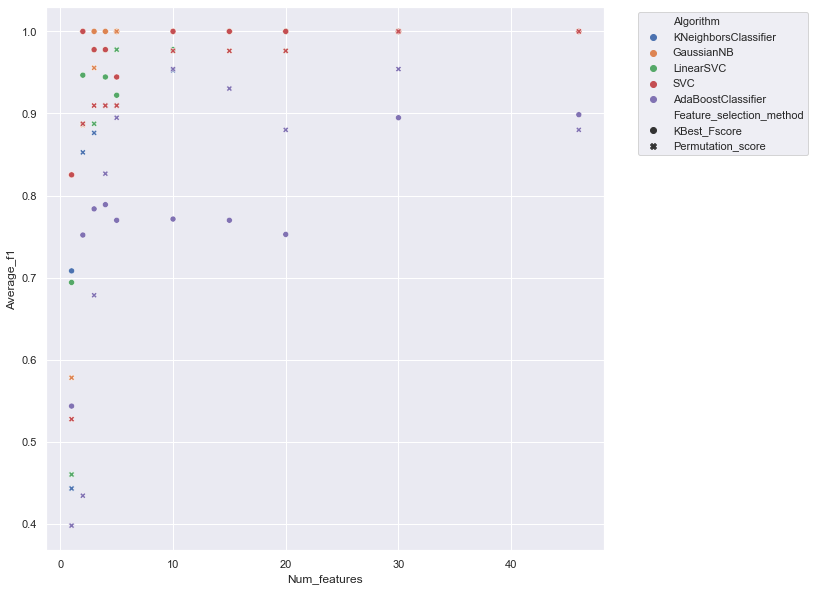

In [42]:
plt.clf()
sns.scatterplot(
    x=red_feat_score_df['Num_features'], y=red_feat_score_df['Average_f1'],
    hue=red_feat_score_df['Algorithm'], style=red_feat_score_df['Feature_selection_method']
)
plt.legend(bbox_to_anchor=(1.05,1))
plt.savefig('{}/Number_of_features_vs_performance_scatter_plot.svg'.format(ml.results_dir))
plt.show()

Model performance reaches a peak at ~2-5 features for both feature selection methods. Model performance remains ~ constant when further peptides are included after this => these peptides are not introducing sufficient noise to negatively affect model performance.

So, can achieve similar level of performance when train a model with just 2 peptides (selected via KBest analysis).

In [43]:
sub_red_feat_score_df = red_feat_score_df[
      (red_feat_score_df['Num_features'] == 2)
    & (red_feat_score_df['Feature_selection_method'] == 'KBest_Fscore')
].reset_index(drop=True)

In [44]:
sub_red_feat_score_df

,Algorithm,Resampling_method,Feature_selection_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,KNeighborsClassifier,no_balancing,KBest_Fscore,2,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000
1,GaussianNB,no_balancing,KBest_Fscore,2,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000
2,LinearSVC,no_balancing,KBest_Fscore,2,0.955556,0.054433,0.955556,0.054433,0.951852,0.071817,0.946667,0.066815
3,SVC,no_balancing,KBest_Fscore,2,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000
4,AdaBoostClassifier,no_balancing,KBest_Fscore,2,0.800000,0.108866,0.800000,0.108866,0.742593,0.130210,0.751852,0.127313


Most of the algorithms achieve 100% accuracy, precision, recall and F1 score when trained with just 2 features. Will take GaussianNB forwards as it is the simplest model, and the same algorithm as that selected for all features.

In [45]:
red_feat_searches['GaussianNB__no_balancing__KBest_Fscore__2']['outer_loop_params']

[OrderedDict(), OrderedDict(), OrderedDict(), OrderedDict(), OrderedDict()]

In [46]:
red_feat_searches['GaussianNB__no_balancing__KBest_Fscore__2']['best_outer_loop_params']

OrderedDict([('accuracy', OrderedDict()),
             ('recall', OrderedDict()),
             ('precision', OrderedDict()),
             ('f1', OrderedDict())])

In [47]:
red_feat_nested_pred = red_feat_searches['GaussianNB__no_balancing__KBest_Fscore__2']['predictions']
red_feat_nested_y_true = red_feat_searches['GaussianNB__no_balancing__KBest_Fscore__2']['y_true']
red_feat_nested_x_true = red_feat_searches['GaussianNB__no_balancing__KBest_Fscore__2']['x_true']

red_feat_flat_pred = np.array([pred for pred_array in red_feat_nested_pred for pred in pred_array])
red_feat_flat_y_true = np.array([y for y_array in red_feat_nested_y_true for y in y_array])
red_feat_flat_x_true = np.array([x for x_array in red_feat_nested_x_true for x in x_array])

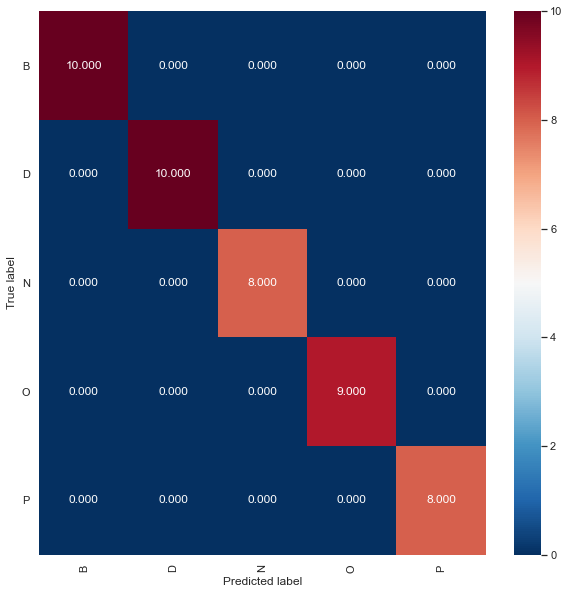

Normalised over true label (rows)


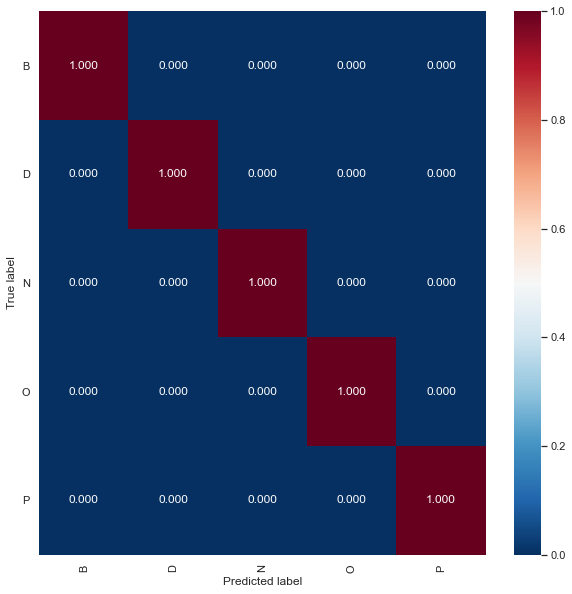

Normalised over pred label (columns)


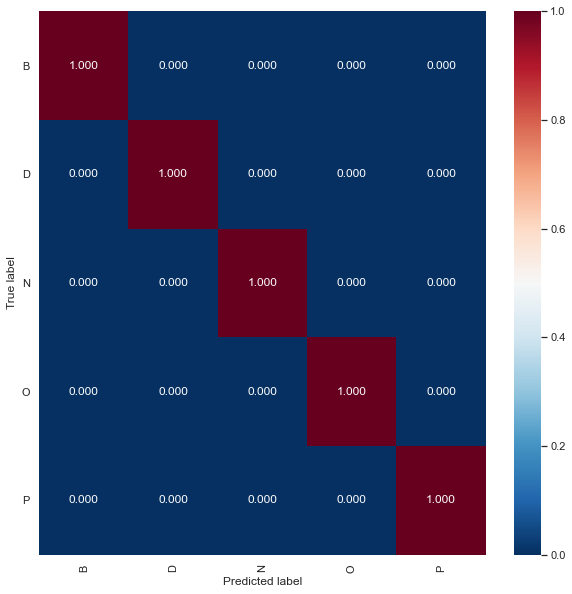

In [48]:
draw_conf_matrices(red_feat_flat_y_true, red_feat_flat_pred, ml.results_dir, 'Red_features')

In [49]:
red_feat_true_hue = []
for index, y in enumerate(red_feat_flat_y_true):
    if red_feat_flat_pred[index] == y:
        red_feat_true_hue.append('{}_correct'.format(y))
    else:
        red_feat_true_hue.append('{}_incorrect'.format(y))

sub_red_feat_true_hue = []
sub_red_feat_flat_x_true = []
sub_red_feat_flat_y_true = []
for i, true_hue in enumerate(red_feat_true_hue):
    if true_hue.endswith('_incorrect'):
        sub_red_feat_true_hue.append(true_hue)
        sub_red_feat_flat_x_true.append(red_feat_flat_x_true[i])
        sub_red_feat_flat_y_true.append(red_feat_flat_y_true[i])

red_feat_true_hue = np.array(red_feat_true_hue)
sub_red_feat_true_hue = np.array(sub_red_feat_true_hue)
sub_red_feat_flat_x_true = np.array(sub_red_feat_flat_x_true)
sub_red_feat_flat_y_true = np.array(sub_red_feat_flat_y_true)

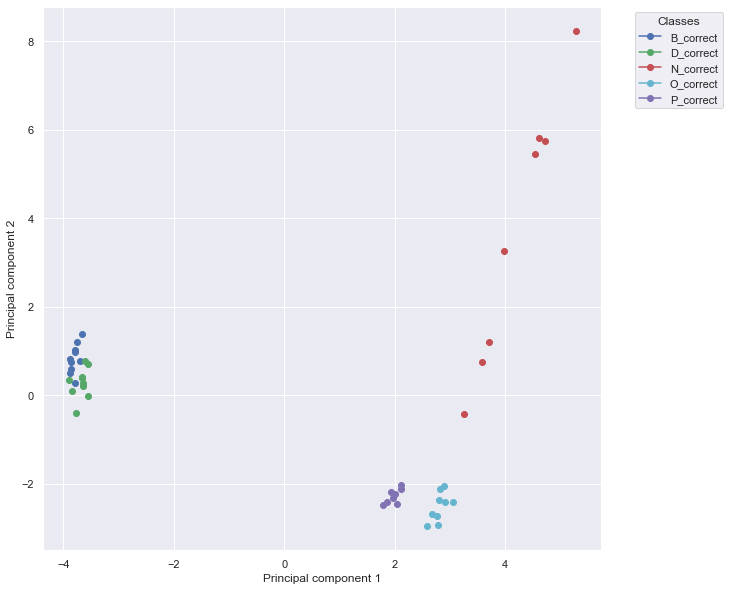

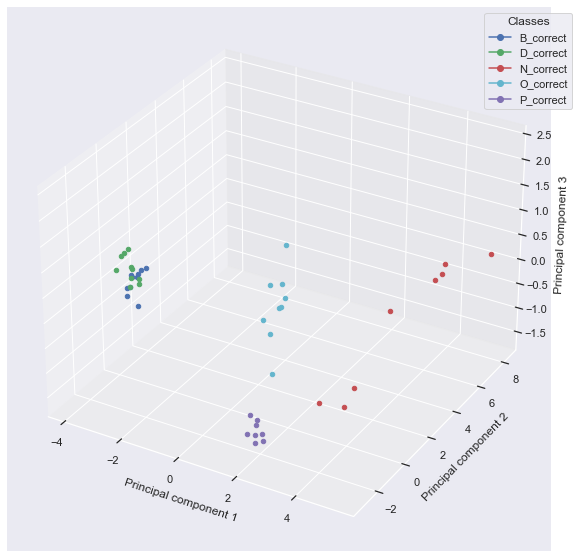

In [50]:
# Scatter plot (axes = top two principal components)
ml.plot_scatter_on_pca_axes(
    x=red_feat_flat_x_true, y=red_feat_flat_y_true, subclasses=red_feat_true_hue, num_dimensions=2,
    scale=True, plt_name='Red_features_coloured_by_pred'
)

# Scatter plot (axes = top three principal components)
ml.plot_scatter_on_pca_axes(
    x=red_feat_flat_x_true, y=red_feat_flat_y_true, subclasses=red_feat_true_hue, num_dimensions=3,
    scale=True, plt_name='Red_features_coloured_by_pred'
)

# B_incorrect = Value that is actually butanoic acid is predicted to be something else

So, GaussianNB model trained with just 2 peptides performs equally well (no incorrect predictions) to the same algorithm trained with all 46 peptides.

Is there a significant difference between the two models?

In [51]:
params_1 = all_feat_searches['GaussianNB__no_balancing']['best_outer_loop_params']['f1']
selected_features_1 = list(ml.features)
params_2 = red_feat_searches['GaussianNB__no_balancing__KBest_Fscore__2']['best_outer_loop_params']['f1']
selected_features_2 = kbest_feat_importances_df['Feature'].tolist()[:2]

print('Model 1:')
print('Algorithm: GaussianNB')
print('Parameters:\n-')
print('Features:\n{}'.format(selected_features_1))
print('\n\n\n')
print('Model 2:')
print('Algorithm: GaussianNB')
print('Parameters:\n{}'.format(params_2))
print('Features:\n{}'.format(selected_features_2))

F, p = ml.run_5x2_CV_combined_F_test(
    x=ml.x, y=ml.y, selected_features_1=selected_features_1, selected_features_2=selected_features_2,
    classifier_1=GaussianNB, classifier_2=GaussianNB, params_1=params_1, params_2=params_2,
    resampling_method_1='no_balancing', resampling_method_2='no_balancing',
    n_components_pca_1=None, n_components_pca_2=None,
)

Model 1:
Algorithm: GaussianNB
Parameters:
-
Features:
['DPH_CCPent', 'DPH_QLKEIA', 'DPH_CCHex2-I24K', 'DPH_CCHept-I24N', 'DPH_CCHept-L28W', 'DPH_GRP22', 'DPH_CCHex', 'DPH_NLKEIA', 'DPH_CCHept-L28K', 'DPH_CCHept-I24T', 'DPH_CCHept-L7Y', 'DPH_CCHex2', 'DPH_CCHept-I17G-L21G', 'DPH_CCHept-I17H', 'DPH_CCHept-I24H', 'DPH_CCHept-L28Y', 'DPH_GRP46', 'DPH_CCHept', 'DPH_CCHept-I17A-L21A', 'DPH_CCHept-I17K-L24E', 'DPH_CCHept-L21S-I24S', 'DPH_CCHept-I24Y', 'DPH_GRP51', 'DPH_CCHept-I24D', 'DPH_CCHept-L14A', 'DPH_CCHept-L7K', 'DPH_CCHept-L21N-I24N', 'DPH_CCHept-L21S-I24Y', 'DPH_GRP52', 'DPH_CCHept-I24E', 'DPH_CCHept-L21A', 'DPH_CCHept-L21K-I24E', 'DPH_CCHept-L21T-I24T', 'DPH_CCHept-L21Y-I24S', 'DPH_GRP63', 'DPH_CCHept-I24K', 'DPH_CCHept-L21K', 'DPH_CCHept-L21E-I24K', 'DPH_CCHept-L21H-I24H', 'DPH_CCHept-I17T', 'DPH_GRP80', 'DPH_CCHept-I17K', 'DPH_CCPent-I24K', 'DPH_CCHept-I24S', 'DPH_CCHept-L7W', 'DPH_CCHept-I24P']




Model 2:
Algorithm: GaussianNB
Parameters:
OrderedDict()
Features:
['DPH_GRP22', 

In [52]:
print('F score: {}'.format(F))
print('p value: {}'.format(p))

F score: 0.8788285160085251
p value: 0.5985810228650634


So, there is no significant difference in performance when reduce the number of peptides from 46 to 2.